# Single model Seed 1 of Case 1: Evaluate model results (confusion matrices, UMAPs of 8th layer activations, LOF scores, image visualizations, screening hits investigations, etc.)

<b> What is our goal? <b>

The main goal is to develop a model that has meaningful uncertainty, meaning the uncertainty is low for known and biologically uninteresting classes, but high for unknown and ideally biologically interesting classes. Our hope would be that this new model learns something the original classifier (autophagy_2_1 from SPACRSpy) did not, thereby identifying something new.
The way to test this for the multi-class classifier is by leaving out different biological conditions during training and then checking uncertainty on them as well as by evaluate the new model with screening data, plotting its 8th layer in UMAP and investigating the classifcation scores between the old and new models.

<b> What data do we have now? <b>

1. Stimulated 14h (or 16h) -> labelled as 0
2. Unstimulated -> labelled as 1
3. ATG5 KO (stimulated but that doesn’t matter, this KO supersedes the stim status [probably looks like unstimulated data]) -> labelled as 2
4. Stimulated timecourse data -> labelled as 3
5. EI24 KO timecourse data (more similar to unstim) -> labelled as 4
6. Screening data (similar to stim) -> labelled as 5


<b> What are we doing in this section? <b>

Here we investigate the model results for Case 1 seed 1 (confusion matrices, UMAPs of 8th layer activations, LOF scores, image visualizations, screening hits investigations, etc.).


In [1]:
!pip install torch-intermediate-layer-getter
!pip install umap-learn
!pip install leidenalg
!pip install scanpy==1.9.6
!pip install anndata umap-learn
!pip install watermark
!pip install --upgrade ipywidgets

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
  Created wheel for torch-intermediate-layer-getter: filename=torch_intermediate_layer_getter-0.1.post1-py3-none-any.whl size=3724 sha256=3164c65f86ffb2f6f4ec75d11579c6ca2c4be22a2742244496401048b2fbdca2
  Stored in directory: /tmp/pip-ephem-wheel-cache-yzqy3wma/wheels/6a/11/c0/30d81aa26172d10d68ffaf352b0762eb9fe0a5f5dcf3de63e0
Successfully built torch-intermediate-layer-getter
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
You should consider upgrading via the '/usr/bi

In [2]:
!pip install nexusformat

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 79 kB 3.1 MB/s eta 0:00:01
     |████████████████████████████████| 45.9 MB 2.0 MB/s eta 0:00:011
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [13]:
#%load_ext watermark 
import os
import wandb
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from tqdm.notebook import tqdm
import pandas as pd
import torch
from torch.utils.data import DataLoader, Dataset, random_split, SubsetRandomSampler
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, balanced_accuracy_score
import sys
import seaborn as sn
from torch.utils.tensorboard import SummaryWriter
from torch_intermediate_layer_getter import IntermediateLayerGetter as MidGetter
import umap
import scanpy as sc
import anndata as ad
import re
from collections import Counter
import random
from torch.utils.data import Subset
import h5py
import random
import pickle
import glob

from sparcscore.ml.datasets import HDF5SingleCellDataset
# from sparcscore.pipeline.project import TimecourseProject, Project
# from sparcscore.pipeline.workflows import MultithreadedWGATimecourseSegmentation, WGATimecourseSegmentation, MultithreadedCytosolCellposeTimecourseSegmentation, ShardedWGASegmentation, ShardedDAPISegmentationCellpose, WGASegmentation, DAPISegmentationCellpose
from sparcscore.pipeline.extraction import HDF5CellExtraction, TimecourseHDF5CellExtraction
from sparcscore.pipeline.classification import MLClusterClassifier
from sparcscore.ml.pretrained_models import autophagy_classifier2_1

In [11]:
class HDF5SingleCellDataset(Dataset):
    """
    Class for handling SPARCSpy single cell datasets stored in HDF5 files.

    This class provides a convenient interface for SPARCSpy formated hdf5 files containing single cell datasets. It supports loading data
    from multiple hdf5 files within specified directories, applying transformations on the data, and returning
    the required information, such as label or id, along with the single cell data.

    Attributes
    ----------
    root_dir : str
        Root directory where the hdf5 files are located.
    dir_labels : list of int
        List of labels corresponding to the directories in dir_list.
    dir_list : list of str
        List of path(s) where the hdf5 files are stored. Supports specifying a path to a specific hdf5 file or directory
        containing hdf5 files.
    transform : callable, optional
        A optional user-defined function to apply transformations to the data. Default is None.
    max_level : int, optional
        Maximum levels of directory to search for hdf5 files. Default is 5.
    return_id : bool, optional
        Whether to return the index of the cell with the data. Default is False.
    return_fake_id : bool, optional
        Whether to return a fake index (0) with the data. Default is False.
    select_channel : int, optional
        Specify a specific channel to select from the data. Default is None, which returns all channels.

    Methods
    -------
    add_hdf_to_index(current_label, path)
        Adds single cell data from the hdf5 file located at ‘path’ with the specified ‘current_label’ to the index.
    scan_directory(path, current_label, levels_left)
        Scans directories for hdf5 files and adds their data to the index with the specified ‘current_label’.
    stats()
        Prints dataset statistics including total count and count per label.
    len()
        Returns the total number of single cells in the dataset.
    getitem(idx)
        Returns the data, label, and optional id/fake_id of the single cell specified by the index ‘idx’.

    Examples
    --------
    >>> hdf5_data = HDF5SingleCellDataset(dir_list=[‘data1.hdf5’, ‘data2.hdf5’],
    dir_labels=[0, 1],
    root_dir=‘/path/to/data’,
    transform=None,
    return_id=True)
    >>> len(hdf5_data)
    2000
    >>> sample = hdf5_data[0]
    >>> sample[0].shape
    torch.Size([1, 128, 128])
    >>> sample[1]
    tensor(0)
    >>> sample[2]
    tensor(0)

    """
    
    HDF_FILETYPES = ["hdf", "hf", "h5", "hdf5"]
    def __init__(self, dir_list, 
                 dir_labels, 
                 root_dir, 
                 max_level=5, 
                 transform=None, 
                 return_id=False, 
                 return_fake_id=False,
                 select_channel=None):
        
        self.root_dir = root_dir
        self.dir_labels = dir_labels
        self.dir_list = dir_list
        self.transform = transform
        
        self.handle_list = []
        self.data_locator = []
        
        self.select_channel = select_channel
        
        # scan all directoreis
        for i, directory in enumerate(dir_list):
            path = os.path.join(self.root_dir, directory)  
            current_label = self.dir_labels[i]

            #check if "directory" is a path to specific hdf5
            filetype = directory.split(".")[-1]
            filename = directory.split(".")[0]
                
            if filetype in self.HDF_FILETYPES:
                self.add_hdf_to_index(current_label, directory)

            else:
                # recursively scan for files
                self.scan_directory(path, current_label, max_level)
        
        # print dataset stats at the end
        
        self.return_id = return_id
        self.return_fake_id = return_fake_id
        self.stats()
 
        
    def add_hdf_to_index(self, current_label, path):       
        try:
            input_hdf = h5py.File(path, 'r')
            index_handle = input_hdf.get('single_cell_index')

            handle_id = len(self.handle_list)
            self.handle_list.append(input_hdf.get('single_cell_data'))

            for row in index_handle:
                self.data_locator.append([current_label, handle_id]+list(row))      
        except:
            return
        
    def scan_directory(self, path, current_label, levels_left):
        
        # iterates over all files and folders in a directory
        # hdf5 files are added to the index
        # subfolders are recursively scanned
        
        if levels_left > 0:
            
            # get files and directories at current level
            input_list = os.listdir(path)
            current_level_directories = [os.path.join(path, name) for name in os.listdir(path) if os.path.isdir(os.path.join(path, name))]

            current_level_files = [ name for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))]
                        
            for i, file in enumerate(current_level_files):
                filetype = file.split(".")[-1]
                filename = file.split(".")[0]
                
                if filetype in self.HDF_FILETYPES:
                    
                    self.add_hdf_to_index(current_label, os.path.join(path, file))
                    
            # recursively scan subdirectories        
            for subdirectory in current_level_directories:
                self.scan_directory(subdirectory, current_label, levels_left-1)
            
        else:
            return
        
    def stats(self):
    
        labels = [el[0] for el in self.data_locator]
        
        print("Total: {}".format(len(labels)))
        
        for l in set(labels):
            print("{}: {}".format(l,labels.count(l)))
        
    def __len__(self):
        return len(self.data_locator)
    
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # get the label, filename and directory for the current dataset
        data_info = self.data_locator[idx]
        
        if self.select_channel is not None:
            cell_tensor = self.handle_list[data_info[1]][data_info[2], self.select_channel]
            t = torch.from_numpy(cell_tensor)
            t = torch.unsqueeze(t,0)
            
        else:
            
            cell_tensor = self.handle_list[data_info[1]][data_info[2]]
            t = torch.from_numpy(cell_tensor)
            
        t = t.float()     
        
        if self.transform:
            t = self.transform(t)
        """  
        if not list(t.shape) == list(torch.Size([1,128,128])):
            t = torch.zeros((1,128,128))
        """      
        if self.return_id and self.return_fake_id:
            raise ValueError("either return_id or return_fake_id should be set")
            
        if self.return_id:
            
            ids = int(data_info[3])
            sample = (t, torch.tensor(data_info[0]), torch.tensor(ids))
        elif self.return_fake_id:
            
            sample = (t, torch.tensor(data_info[0]), torch.tensor(0))
        else:
            sample = (t, torch.tensor(data_info[0]))
        
        return sample

In [17]:
# Function to load saved dataset and recreate DataLoader
def load_dataset(save_path, batch_size):
    # Load the saved tensor data
    images_tensor, labels_tensor = torch.load(save_path)
    
    # Create a TensorDataset from the loaded tensors
    dataset = torch.utils.data.TensorDataset(images_tensor, labels_tensor)
    
    # Create DataLoader
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
    
    print(f"Loaded dataset from {save_path}")
    return data_loader

In [14]:
class MultiClassClassifier(nn.Module):
    def __init__(self, num_classes):
        super(MultiClassClassifier, self).__init__()
        
        # VGG-like feature extractor
        self.features = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        # Classifier head for multi-class
        self.fc_input_size = 8192 
        self.classifier = nn.Sequential(
            nn.Linear(self.fc_input_size, 4096), 
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(4096, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(1024, num_classes) 
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        
        # Print the size of x to confirm it's correct
        #print("Size of x:", x.size())
        
        x = self.classifier(x)
        return x

# Create an instance of the model
num_classes = 6
model = MultiClassClassifier(num_classes)
print(model)

MultiClassClassifier(
  (features): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (

In [15]:
batch_size = 256                    # Batch size for DataLoader

## Confusion matrix 

In [5]:
# Define the number of classes (must match what was used during training)
num_classes = 6

# Reinitialize the model architecture (same as during training)
model = MultiClassClassifier(num_classes)

# Specify the device (same as during training)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


# Load the balanced testset
test_data_loader = load_dataset("/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset.pt", batch_size)


seed = 1  

try:
    model.load_state_dict(torch.load(f'/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/ensemble_models/ensemble_multi_class_VGG2_case1_seed_{seed}.pth'))
    print(f"Model for seed {seed} successfully loaded.")
except Exception as e:
    print(f"Error loading model for seed {seed}: {str(e)}")

Error loading model for seed 1: [Errno 2] No such file or directory: 'ensemble_multi_class_VGG2_case1_seed_1.pth'


In [22]:
!ls -l /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes

total 6726720
-rw-rw---- 1 di93quv pn36po 1147854336 Nov 10 15:28 testset_0.h5
-rw-rw---- 1 di93quv pn36po 1147854336 Nov 10 15:49 testset_1.h5
-rw-rw---- 1 di93quv pn36po 1147854336 Nov 10 16:06 testset_2.h5
-rw-rw---- 1 di93quv pn36po 1147854336 Nov 10 16:24 testset_3.h5
-rw-rw---- 1 di93quv pn36po 1147854336 Nov 10 16:26 testset_4.h5
-rw-rw---- 1 di93quv pn36po 1147854336 Nov 10 16:42 testset_5.h5
-rw-rw---- 1 di93quv pn36po     959366 Nov 10 16:42 testset_indices.pkl


In [30]:
# Create DataLoader for test_data
batch_size = 256 
#test_data_loader = DataLoader(test_data_loader, batch_size=batch_size, shuffle=False)

# Initialize TensorBoard writer
tensorboard_writer = SummaryWriter('runs/single_model_seed_1_VGG2_autophagy_confusion_matrix')

# Test loop
model.eval()
all_test_labels = []
all_test_predicted = []

with torch.no_grad():
    for data, labels in test_data_loader:
        data = data.to(device)
        labels = labels.to(device)

        output = model(data)
        _, predicted = output.max(1)
        all_test_labels.extend(labels.cpu().numpy())
        all_test_predicted.extend(predicted.cpu().numpy())

# Calculate  confusion matrix
confusion_matrix_result = confusion_matrix(all_test_labels, all_test_predicted)

# Print cm to console
print("Seed 42 Confusion Matrix:")
print(confusion_matrix_result)

# Save confusion matrix to TensorBoard
epsilon = 1e-8
num_classes = 6

class_names = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Stim. timecourse)", "Class 4 (EI24 KO timecourse)", "Class 5 (Screening)"]
df_cm = pd.DataFrame(confusion_matrix_result / (confusion_matrix_result.sum(axis=1)[:, None] + epsilon),
                     index=class_names,
                     columns=class_names)

plt.figure(figsize=(10, 8)) 

# Plot confusion matrix
sn.heatmap(confusion_matrix_result, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)

# save confusion matrix to TensorBoard
tensorboard_writer.add_figure('Confusion Matrix', plt.gcf())

# save confusion matrix to file
df_cm.to_csv('single_model_seed_1_confusion_matrix_case1_with_screendata.csv', index=True)

# Close TensorBoard writer aggain
tensorboard_writer.close()

Seed 42 Confusion Matrix:
[[1190    0  810    0    0    0]
 [ 197    0 1803    0    0    0]
 [   6    0 1994    0    0    0]
 [1661    0  339    0    0    0]
 [1461    0  539    0    0    0]
 [1984    0   16    0    0    0]]


The confusion matrix for seed 42 shows how well the model, which was trained only on classes 0 and 2, performs when tested on all six classes. Each row of the confusion matrix represents the actual class (ground truth), while each column represents the predicted class by the model.

Since the model hasn't been exposed to classes 1, 3, 4, and 5 during training, its performance on these unseen classes will be poor or nonexistent.

We see that we have a) strong Bias Toward Classes 0 and 2 and b) poor Generalization to Unseen Classes.

In [11]:
# Get the total number of instances in the dataset
num_instances = len(test_data_loader.dataset)

print(f"Total number of instances in test_data_loader: {num_instances}")

Total number of instances in test_data_loader: 12000


In [31]:
original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

layer_name = 'features.24' # 8th layer activations name from model architecture

# define the return layers for IntermediateLayerGetter
return_layers = {layer_name: layer_name}

# Initialize the model with correct feature output
mid_getter = MidGetter(model, return_layers=return_layers, keep_output=True)

# Define the size of the subset!!! (not full dataset here due to kernal crahsing!)
subset_size = 12000 

# Create DataLoader
batch_size = 256

# Randomly sample a subset of the dataset
subset_indices = torch.randperm(len(original_dataset))[:subset_size]
torch.save(subset_indices, 'single_model_seed_1_Case_1_subset_indices.pth')
subset_indices = torch.load('single_model_seed_1_Case_1_subset_indices.pth')

# Create a new subset sampler with the loaded indices
subset_sampler = SubsetRandomSampler(subset_indices)

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Lists to store activations and labels
activations = []
labels = []

# Forward pass of subset through the model to get activations
with torch.no_grad():
    for data, label in tqdm(subset_data_loader, desc="Processing data", leave=False):
        data = data.to(device) 
        mid_outputs, _ = mid_getter(data)
        # Get the activations
        activations.append(mid_outputs[layer_name].cpu().detach().numpy())
        labels.append(label.numpy())

# Concatenate activations and labels from all batches
activations = np.concatenate(activations, axis=0)
labels = np.concatenate(labels, axis=0)

Processing data:   0%|          | 0/47 [00:00<?, ?it/s]

In [32]:
#save activations and labels to files
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_activations_layer_8.npy', activations)
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_labels_layer_8.npy', labels)

In [34]:
#lload activations and labels from files
activations = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_activations_layer_8.npy')
labels = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_labels_layer_8.npy')
labels

array([2, 3, 1, ..., 5, 1, 5])

In [35]:
# Reshape activations to 2 dims
activations_flat = activations.reshape(activations.shape[0], -1)
activations_flat

array([[0.38064024, 0.02501795, 0.34494883, ..., 0.23335205, 0.1162863 ,
        0.        ],
       [0.32448804, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.50799626, 0.3507328 , 0.70988995, ..., 0.21232459, 0.        ,
        0.        ],
       ...,
       [0.3578396 , 0.        , 0.33600396, ..., 0.        , 0.        ,
        0.        ],
       [0.3316217 , 0.        , 0.09294754, ..., 0.        , 0.        ,
        0.        ],
       [0.7837955 , 0.68988854, 1.0846981 , ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [36]:
%matplotlib inline

# Calc. UMAP
umap_reducer = umap.UMAP(n_components=2)
umap_result = umap_reducer.fit_transform(activations_flat)

# Define new class labels 
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Stim. timecourse)", "Class 4 (EI24 KO timecourse)", "Class 5 (Screening)"]

In [10]:
# Create AnnData object
adata = ad.AnnData(X=umap_result)

# Map numerical labels to string labels
label_map = {i: label for i, label in enumerate(class_labels)}

# Add .obs infos
adata.obs['class_labels'] = labels
adata.obs['class_labels'] = adata.obs['class_labels'].map(label_map)

# Run leiden and make UMAP
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)

# define a custom discrete colormaps
colors_leiden = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
cmap_leiden = ListedColormap(colors_leiden, name='custom_discrete_cmap_leiden')

colors_class_labels = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red']
cmap_class_labels = ListedColormap(colors_class_labels, name='custom_discrete_cmap_class_labels')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


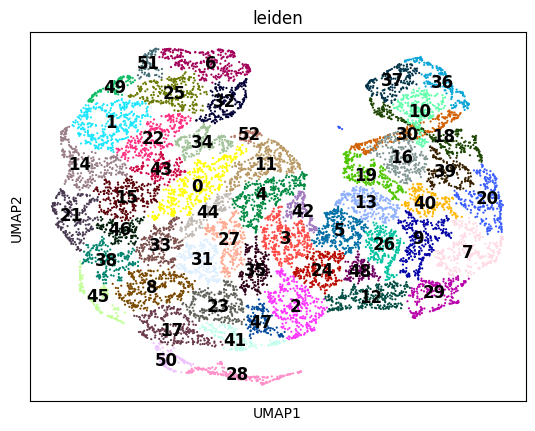

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


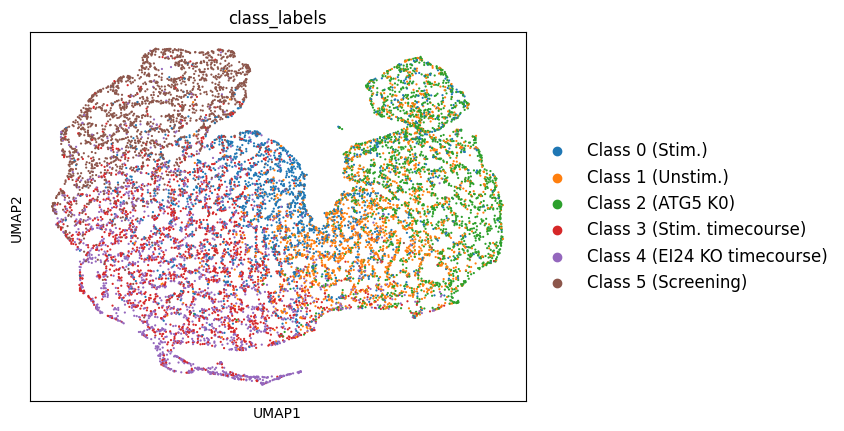

In [11]:
sc.pl.umap(adata, color=['leiden'], cmap=cmap_leiden, legend_loc='on data', legend_fontsize=12)
sc.pl.umap(adata, color=['class_labels'], cmap=cmap_class_labels, legend_loc='right margin', legend_fontsize=12, s = 10)

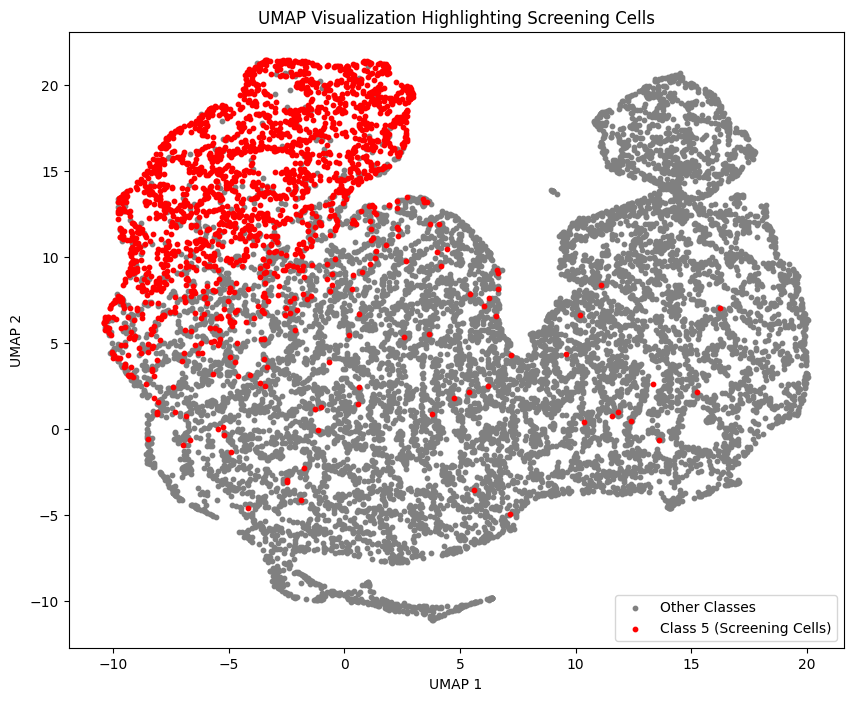

In [50]:
# Define mask for screening and non-screening cells
screening_mask = adata.obs['class_labels'] == 'Class 5 (Screening)'

# Plot non-screening cells in grey
plt.figure(figsize=(10, 8))
plt.scatter(
    adata.obsm['X_umap'][~screening_mask, 0], 
    adata.obsm['X_umap'][~screening_mask, 1], 
    color='grey', 
    label='Other Classes', 
    s=10  # Adjust dot size for non-screening cells
)

# Plot screening cells in red
plt.scatter(
    adata.obsm['X_umap'][screening_mask, 0], 
    adata.obsm['X_umap'][screening_mask, 1], 
    color='red', 
    label='Class 5 (Screening Cells)', 
    s=10  # Adjust dot size for screening cells
)

# Add labels and legend
plt.legend()
plt.title('UMAP Visualization Highlighting Screening Cells')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [16]:
# Get the cell IDs of screening class 3 cells from the subset
screening_cells = adata[adata.obs['class_labels'] == 'Class 5 (Screening)'].obs_names
print("Cell IDs of screening class 3 cells:")
print(screening_cells)

Cell IDs of screening class 3 cells:
Index(['6', '8', '17', '32', '33', '34', '53', '63', '66', '70',
       ...
       '11949', '11956', '11964', '11972', '11973', '11978', '11991', '11996',
       '11997', '11999'],
      dtype='object', length=2000)


In [19]:
# Subset adata to include only the selected Leiden clusters
selected_clusters = ["51", "6", "49", "25", "32", "1", "22", "14", "43", "34", "15", "21", "16"]
adata_subset = adata[adata.obs['leiden'].isin(selected_clusters)]

# Get the cell IDs of screening class 5 cells within the subset
screening_indices = adata_subset[adata_subset.obs['class_labels'] == 'Class 5 (Screening)'].obs_names

# Print the cell IDs of screening class 5 cells within the selected Leiden clusters
print("Cell indices of screening class 5 cells within the selected Leiden clusters:")
print(screening_indices)

# Calculate the number of resulting screening indices
num_screening_indices = len(screening_indices)
print("Number of screening indices:", num_screening_indices)

Cell indices of screening class 5 cells within the selected Leiden clusters:
Index(['6', '8', '17', '32', '33', '34', '53', '63', '66', '70',
       ...
       '11949', '11956', '11964', '11972', '11973', '11978', '11991', '11996',
       '11997', '11999'],
      dtype='object', length=1885)
Number of screening indices: 1885


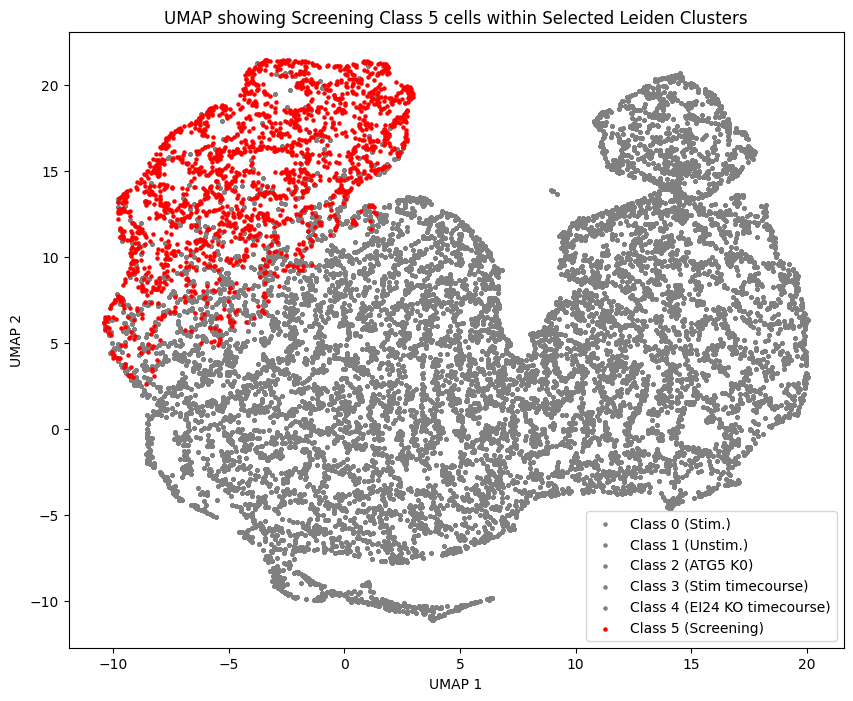

In [20]:
# Define colors for class labels
colors = {'Class 0 (Stim.)': 'grey', 
          'Class 1 (Unstim.)': 'grey', 
          'Class 2 (ATG5 K0)': 'grey', 
          'Class 3 (Stim timecourse)': 'grey',
          'Class 4 (EI24 KO timecourse)': 'grey',
          'Class 5 (Screening)': 'red'}

#filter only screening class 5 cells within selected Leiden clusters and plot UMAP
mask = (adata.obs['class_labels'] == 'Class 5 (Screening)') & (adata.obs['leiden'].isin(selected_clusters))
plt.figure(figsize=(10, 8))
for label, color in colors.items():
    if label == 'Class 5 (Screening)':
        plt.scatter(adata.obsm['X_umap'][mask, 0], adata.obsm['X_umap'][mask, 1], c=color, label=label, s=5)
    else:
        plt.scatter(adata.obsm['X_umap'][~mask, 0], adata.obsm['X_umap'][~mask, 1], c=color, label=label, s=5)

plt.title('UMAP showing Screening Class 5 cells within Selected Leiden Clusters')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

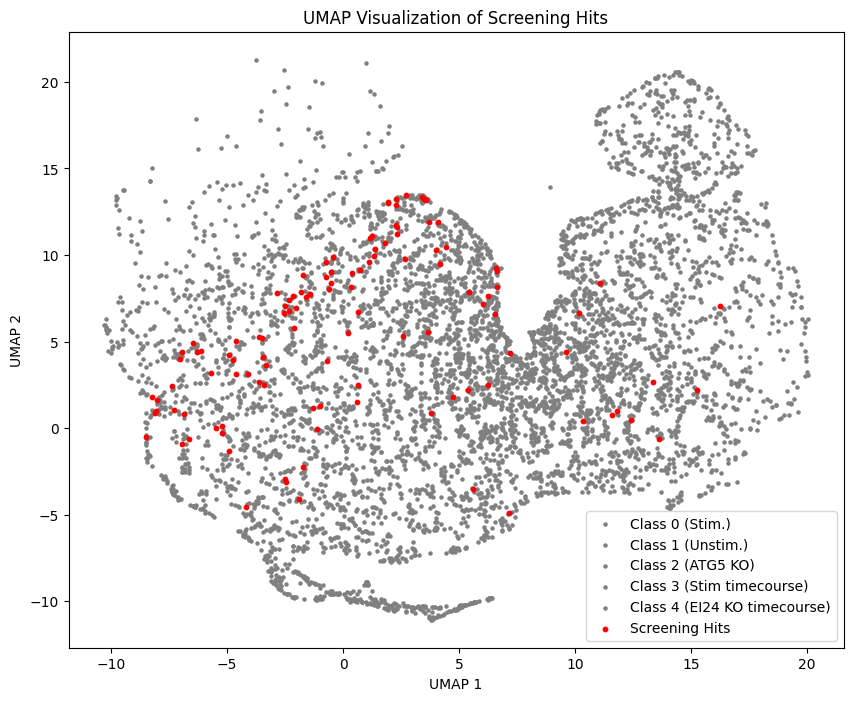

Total Screening Hits (Class 5 cells not in selected clusters): 115
Screening Hits Cell IDs: ['131', '228', '247', '260', '299', '403', '416', '717', '762', '841', '880', '888', '938', '950', '972', '1151', '1251', '1477', '1555', '1639', '1801', '1889', '1941', '2220', '2300', '2305', '2473', '2480', '2590', '2674', '3424', '3475', '3489', '3798', '3947', '4113', '4114', '4143', '4155', '4192', '4279', '4300', '4332', '4342', '4562', '4605', '4752', '4802', '5007', '5042', '5142', '5179', '5236', '5250', '5294', '5302', '5356', '5366', '5551', '5591', '5608', '5680', '6079', '6365', '6468', '6495', '6757', '6841', '6922', '6944', '7245', '7340', '7414', '7578', '7686', '7784', '7998', '8045', '8083', '8110', '8298', '8335', '8540', '8663', '8766', '8783', '8819', '8914', '8924', '9060', '9255', '9334', '9403', '9437', '9471', '9472', '9524', '9648', '9654', '9692', '9985', '10080', '10158', '10457', '10526', '10588', '10661', '10998', '11051', '11338', '11416', '11500', '11532', '11731

In [31]:
# Define the selected Leiden clusters
selected_clusters = ["51", "6", "49", "25", "32", "1", "22", "14", "43", "34", "15", "21", "16"]

# Step 1: Identify Screening Hits
# Create a mask to filter Class 5 (Screening) cells that are not in the selected clusters
screening_class_5_mask = (adata.obs['class_labels'] == 'Class 5 (Screening)')
not_in_selected_clusters_mask = ~adata.obs['leiden'].isin(selected_clusters)
screening_hits_mask = screening_class_5_mask & not_in_selected_clusters_mask

# Get the UMAP coordinates for plotting
umap_coords = adata.obsm['X_umap']

# Step 2: Plot the UMAP, highlighting screening hits
plt.figure(figsize=(10, 8))

# Define colors for each class label
colors = {'Class 0 (Stim.)': 'grey', 
          'Class 1 (Unstim.)': 'grey', 
          'Class 2 (ATG5 KO)': 'grey', 
          'Class 3 (Stim timecourse)': 'grey',
          'Class 4 (EI24 KO timecourse)': 'grey',
          'Class 5 (Screening)': 'red'}

# Plot all cells, setting the appropriate color for each class
for label, color in colors.items():
    # Filter for cells belonging to the current class label
    class_mask = (adata.obs['class_labels'] == label)
    
    if label == 'Class 5 (Screening)':
        # Plot the screening hits (Class 5 cells not in selected clusters) in red
        plt.scatter(
            umap_coords[screening_hits_mask, 0], 
            umap_coords[screening_hits_mask, 1], 
            c=color, label="Screening Hits", s=10, edgecolor="red"
        )
    else:
        # Plot all other cells in their respective colors
        plt.scatter(
            umap_coords[class_mask, 0], 
            umap_coords[class_mask, 1], 
            c=color, label=label, s=5
        )

# Set plot labels and legend
plt.title('UMAP Visualization of Screening Hits')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

# Step 3: Print out screening hit information for reference
screening_hits_indices = adata.obs_names[screening_hits_mask]
print("Total Screening Hits (Class 5 cells not in selected clusters):", len(screening_hits_indices))
print("Screening Hits Cell IDs:", screening_hits_indices.tolist())

In [57]:
"""# Convert cell IDs to indices
screening_indices = [int(idx) for idx in screening_indices]
#print(len(screening_indices))

# Just double-checking here...
# Obtain data for screening cells and print infos
screening_cells_data = [umap_result[idx] for idx in screening_indices]
for idx, sample in zip(screening_indices, screening_cells_data):
    print(f"Cell ID: {idx}")
    #print(f"Data: {sample[0]}")  # Acces data
    #print(f"Label: {sample[1]}")  # Access label
    if len(sample) == 3:
        print(f"ID: {sample[2]}")  # Access ID if available
    print("="*20)"""

'# Convert cell IDs to indices\nscreening_indices = [int(idx) for idx in screening_indices]\n#print(len(screening_indices))\n\n# Just double-checking here...\n# Obtain data for screening cells and print infos\nscreening_cells_data = [umap_result[idx] for idx in screening_indices]\nfor idx, sample in zip(screening_indices, screening_cells_data):\n    print(f"Cell ID: {idx}")\n    #print(f"Data: {sample[0]}")  # Acces data\n    #print(f"Label: {sample[1]}")  # Access label\n    if len(sample) == 3:\n        print(f"ID: {sample[2]}")  # Access ID if available\n    print("="*20)'

In [59]:
"""num_screening_indices = len(screening_indices)
plots_per_row = 7
num_rows = (num_screening_indices + plots_per_row - 1) // plots_per_row
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5*num_rows))

# Iterate over the screening cells and plot the images
for i, (idx, sample) in enumerate(zip(screening_indices, screening_cells_data), 1):
    # Convert 1-channel image to 2D array for visualization
    image = sample[0][0]
    
    # Calculate the row and column indices for the subplot grid
    row_idx = (i - 1) // plots_per_row
    col_idx = (i - 1) % plots_per_row
    
    # Plot the image
    axes[row_idx, col_idx].imshow(image, cmap='viridis') 
    axes[row_idx, col_idx].set_title(f"Cell ID: {idx}")
    axes[row_idx, col_idx].axis('off')
plt.tight_layout()
plt.show()"""

'num_screening_indices = len(screening_indices)\nplots_per_row = 7\nnum_rows = (num_screening_indices + plots_per_row - 1) // plots_per_row\nfig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5*num_rows))\n\n# Iterate over the screening cells and plot the images\nfor i, (idx, sample) in enumerate(zip(screening_indices, screening_cells_data), 1):\n    # Convert 1-channel image to 2D array for visualization\n    image = sample[0][0]\n    \n    # Calculate the row and column indices for the subplot grid\n    row_idx = (i - 1) // plots_per_row\n    col_idx = (i - 1) % plots_per_row\n    \n    # Plot the image\n    axes[row_idx, col_idx].imshow(image, cmap=\'viridis\') \n    axes[row_idx, col_idx].set_title(f"Cell ID: {idx}")\n    axes[row_idx, col_idx].axis(\'off\')\nplt.tight_layout()\nplt.show()'

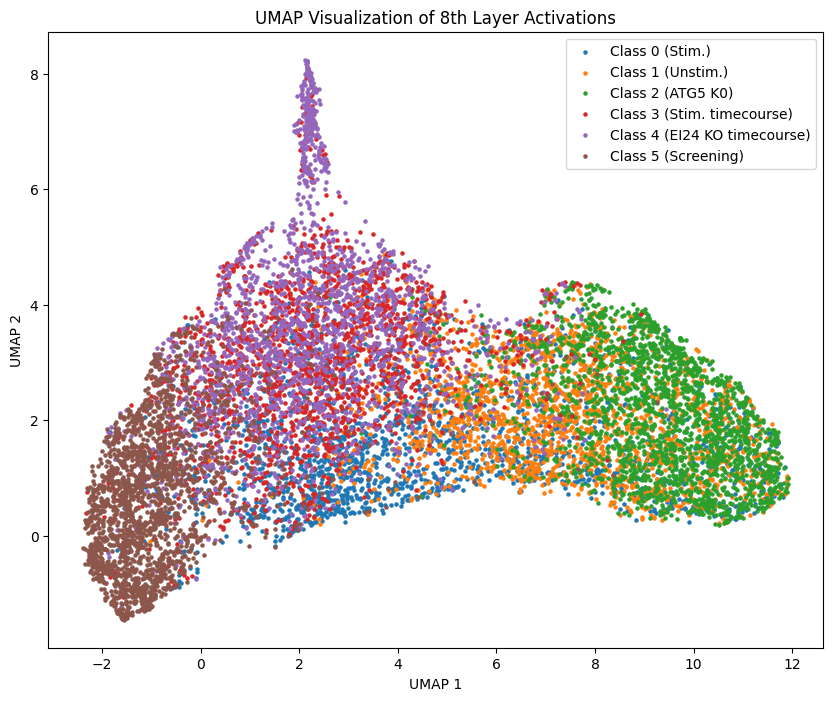

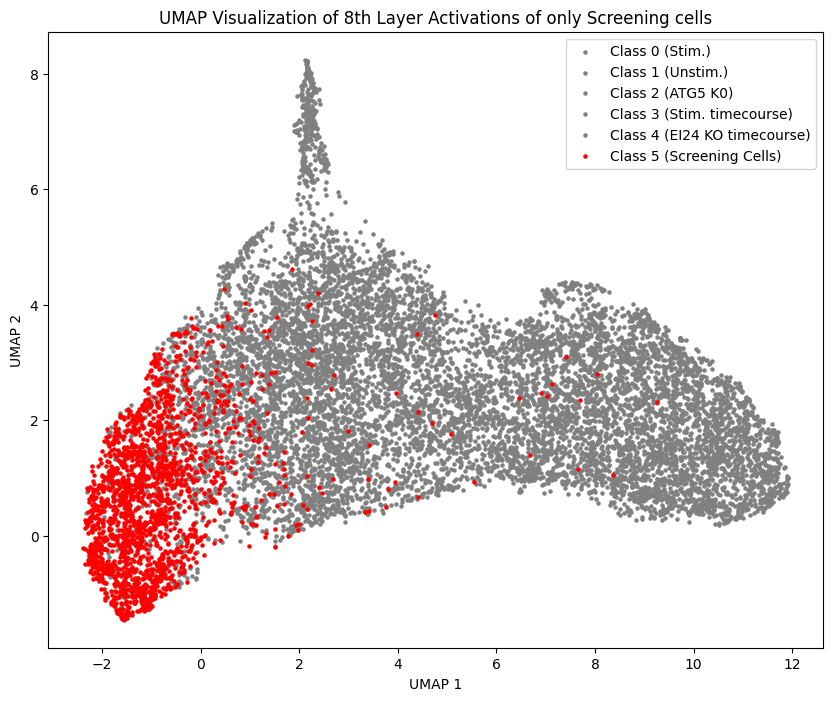

In [43]:
#Plotting UMAP using scatterplot instead of via scanpy
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()
plt.figure(figsize=(10, 8))

# Plot cells belonging to other classes in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude the last class (screening)
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)
    
    
# Plot cells belonging to class 5 (screening) with red color
screening_idx = labels == 5
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], color='red', label='Class 5 (Screening Cells)', s=5)

plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations of only Screening cells')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

# Determine the class index from the classification scores index
class_index = 0 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

A bit strange that screen data are so completely seperate but overall clustering looks good!
Specifically, screening cells cluster so far away from class 0 becuase most of them are very simialr to class 0 thus we might have some batch effect here.

##### Classification scores

In [16]:
#Load pretrained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [17]:
checkpoint_path = "VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


In [18]:
model = autophagy_classifier2_1(device)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
model.to(device)
model.eval()

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.7. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../../workspace/SPARCSpy/src/pretrained_models/autophagy/autophagy2.1/VGG2_autophagy_classifier2.1.cpkt`


MultilabelSupervisedModel(
  (network): _VGG2(
    (norm): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (softmax): LogSoftmax(dim=1)
    (features): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU(inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU(inplace=True)
      (11): Conv2d(256, 256, k

In [ ]:
# Load the checkpoint
checkpoint_path = "VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize and load model
model = autophagy_classifier2_1(device)
model.load_state_dict(checkpoint['state_dict'])
model.to(device)
model.eval()

# Define the subset size and batch size
subset_size = 10000
batch_size = 256

# Load the subset indices
subset_indices = torch.load('single_model_seed_1_Case_1_subset_indices.pth')

# Create a SubsetRandomSampler
subset_sampler = SubsetRandomSampler(subset_indices)

original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

classification_scores = []
out_labels = []

# Calculate Classification Scores
with torch.no_grad():
    for data, labels in tqdm(subset_data_loader, desc="Calculating Scores", leave=False):
        data = data.to(device)
        logits = model(data)
        probabilities = torch.softmax(logits, dim=1)
        classification_scores.append(probabilities.cpu().detach().numpy())
        out_labels.append(labels.cpu().detach())

# Concatenate classification scores and labels from all batches
classification_scores = np.concatenate(classification_scores, axis=0)

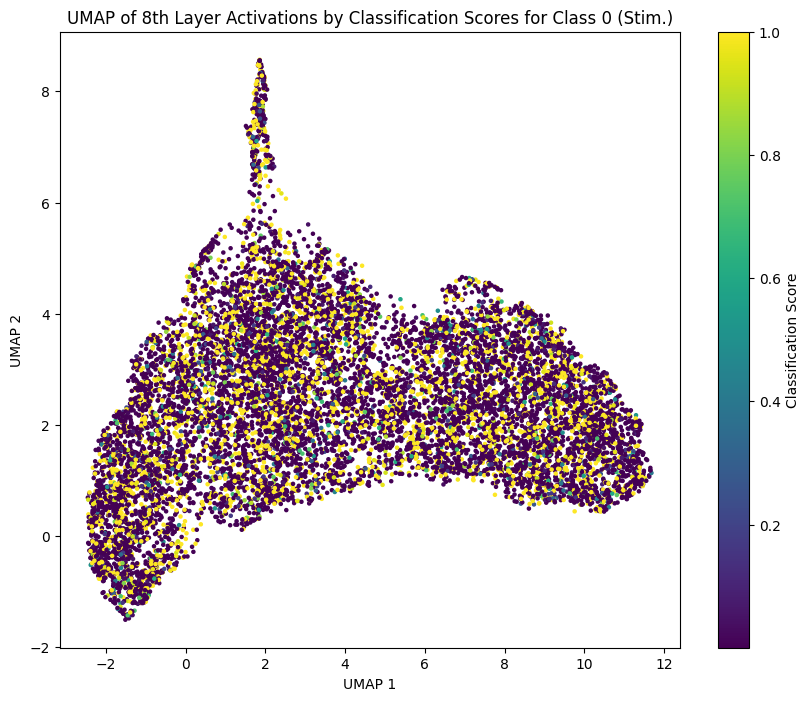

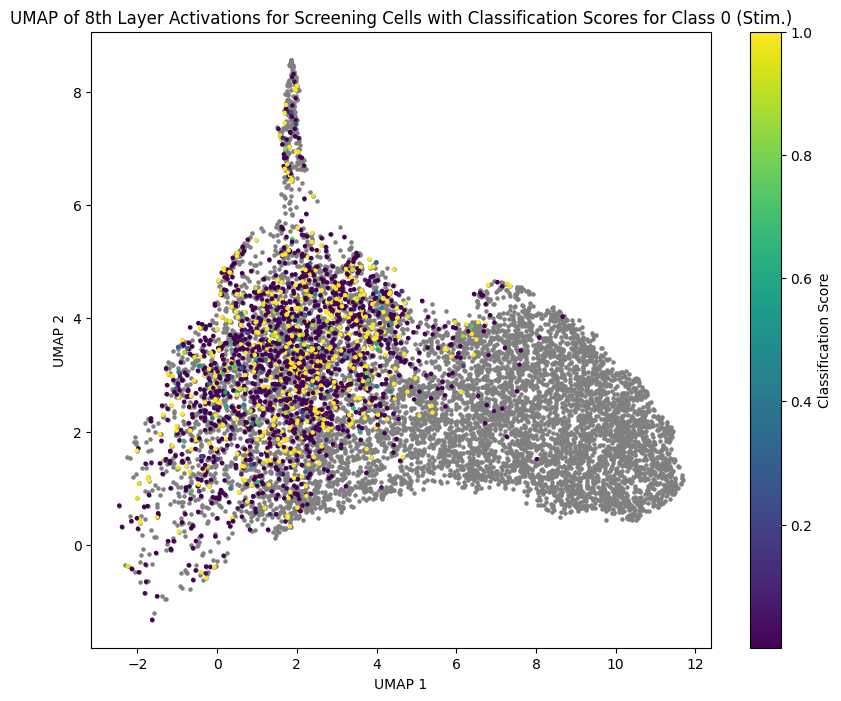

In [41]:
# Plot UMAP with cells colored by classification score
plt.figure(figsize=(10, 8))
plt.scatter(umap_result[:, 0], umap_result[:, 1], c=classification_scores[:, class_index], cmap='viridis', s=5)
plt.colorbar(label='Classification Score')
plt.title(title)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

class_index = 0
plt.figure(figsize=(10, 8))

# Plot cells belonging to class 5 (screening) with color based on classification score
for i, label in enumerate(class_labels[:-1]): 
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)

# Color the screening cells based on their classification score
cmap = plt.get_cmap('viridis')
screening_scores = classification_scores[screening_idx]
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], c=screening_scores[:, class_index], cmap=cmap, label='Screening Cells', s=5)
cbar = plt.colorbar()
cbar.set_label('Classification Score')

  
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations for Screening Cells with Classification Scores for {class_label}'

plt.title(title)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [ ]:
# Save classification scores to a file
np.save('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_classification_scores.npy', classification_scores)

# Save out_labels as torch tensor
torch.save(out_labels, 'single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels.pth')

In [27]:
# Load scores and labels
classification_scores = np.load('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_classification_scores.npy')
out_labels = torch.load('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels.pth')

In [29]:
#out_labels

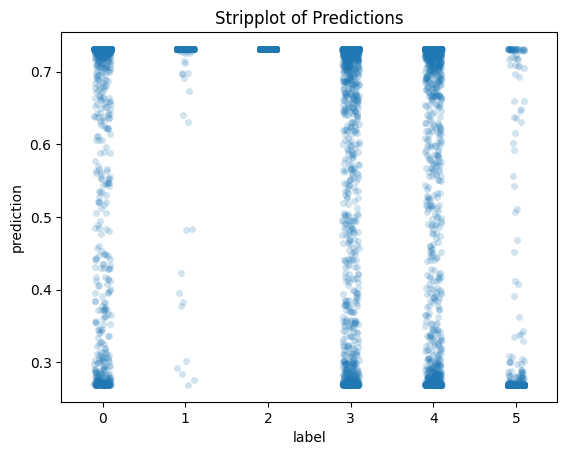

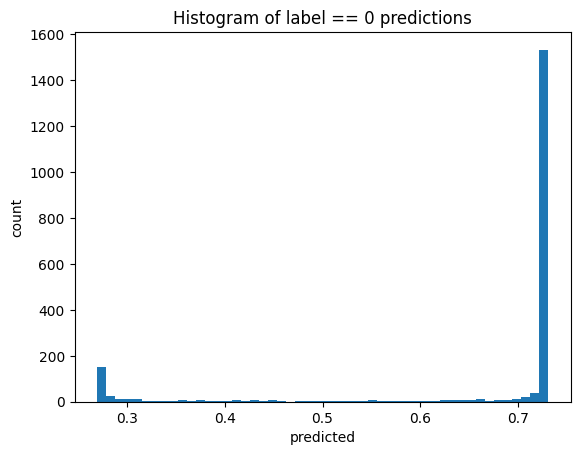

In [39]:
reform_labels = torch.hstack(out_labels)
reform_res = torch.tensor(classification_scores).softmax(dim=1)[:, 1]

#Strip Plot
sns.stripplot(x=reform_labels.numpy(), y=reform_res.numpy(), alpha=0.2)
plt.xlabel('label')
plt.ylabel('prediction')
plt.title('Stripplot of Predictions')
plt.show()

# Histogram
plt.hist(reform_res[reform_labels == 0].numpy(), bins=50)
plt.title('Histogram of label == 0 predictions')
plt.xlabel('predicted')
plt.ylabel('count')
plt.show()

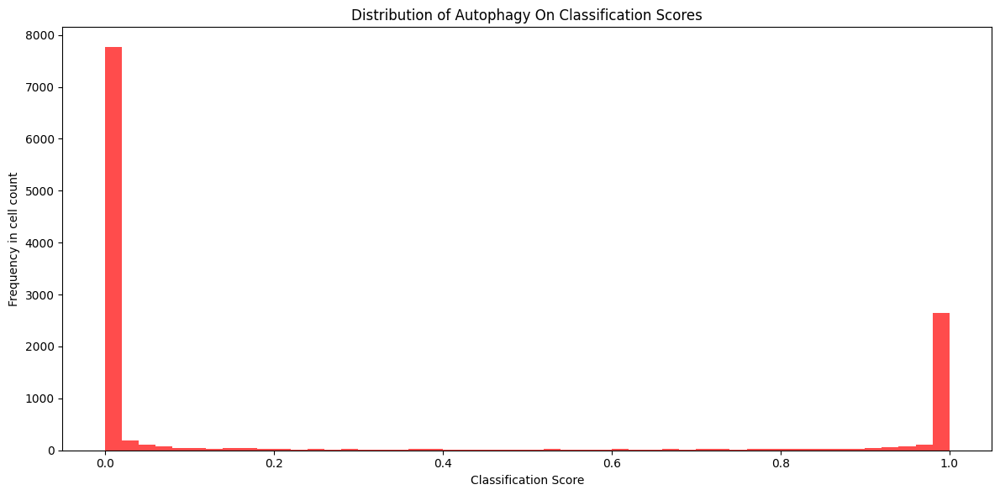

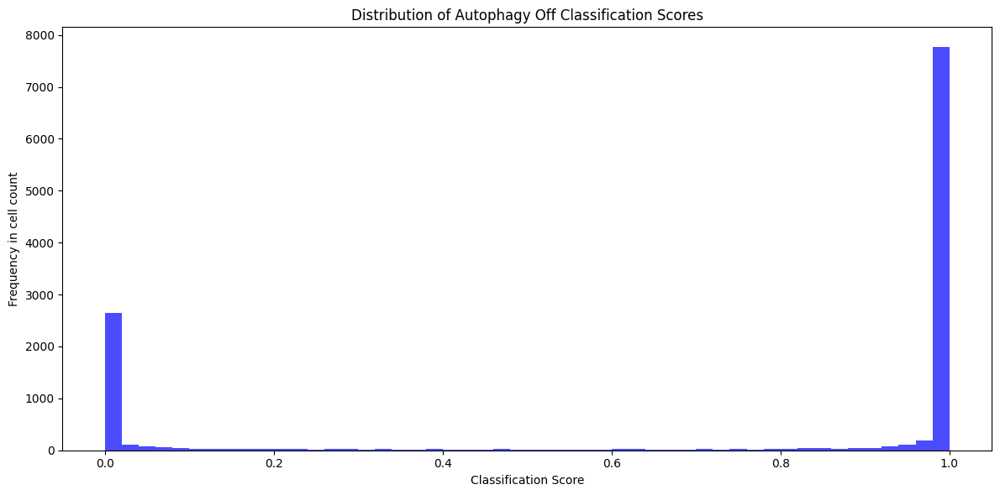

In [27]:
# Extract scores for autophagy on and off
autophagy_on_scores = classification_scores[:, 0]
autophagy_off_scores = classification_scores[:, 1]

# Plot for autophagy on
plt.figure(figsize=(12, 6))
plt.hist(autophagy_on_scores, bins=50, color='red', alpha=0.7)
plt.title('Distribution of Autophagy On Classification Scores')
plt.xlabel('Classification Score')
plt.ylabel('Frequency in cell count')
plt.tight_layout()
plt.show()

# Plot for autophagy off
plt.figure(figsize=(12, 6))
plt.hist(autophagy_off_scores, bins=50, color='blue', alpha=0.7)
plt.title('Distribution of Autophagy Off Classification Scores')
plt.xlabel('Classification Score')
plt.ylabel('Frequency in cell count')
plt.tight_layout()
plt.show()

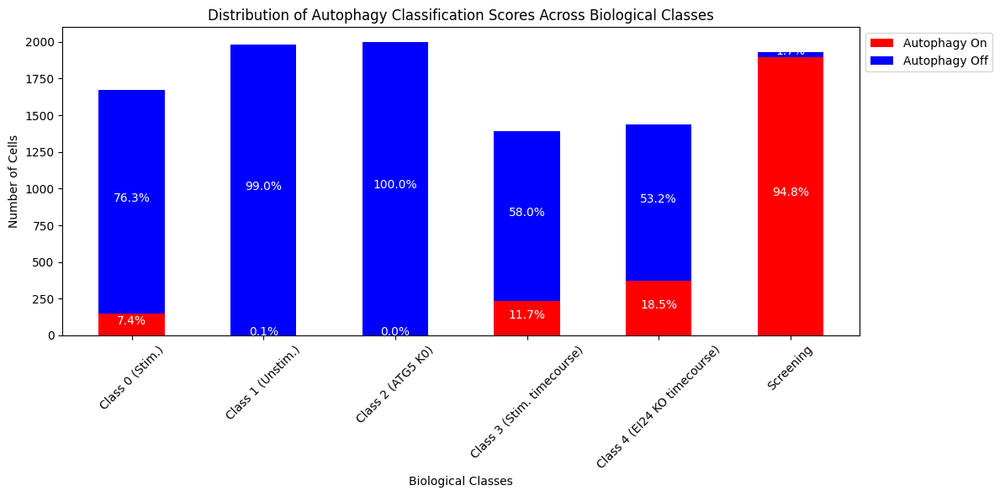

In [28]:
# Verify shape
assert classification_scores.shape[0] == reform_labels.shape[0], "Mismatch in number of samples between classification scores and labels"

# Initialize a dictionary to store counts for each biological class and autophagy label
counts = {bio_label: [0, 0] for bio_label in class_labels}
percentages = {bio_label: [0.0, 0.0] for bio_label in class_labels}

# Count the number of cells in each biological class with autophagy on or off
for i, bio_label in enumerate(class_labels):
    class_indices = (reform_labels == i).numpy()  # convert tensor to numpy for indexing
    total_count = np.sum(class_indices)
    autophagy_on_count = np.sum(classification_scores[class_indices, 0] > 0.98)  # Threshold for 'Autophagy on'
    autophagy_off_count = np.sum(classification_scores[class_indices, 1] > 0.98)  # Threshold for 'Autophagy off'
    counts[bio_label] = [autophagy_on_count, autophagy_off_count]
    if total_count > 0:
        percentages[bio_label] = [autophagy_on_count / total_count * 100, autophagy_off_count / total_count * 100]

# Extract counts for plotting
bio_classes = list(counts.keys())
autophagy_on_counts = [counts[bio_label][0] for bio_label in bio_classes]
autophagy_off_counts = [counts[bio_label][1] for bio_label in bio_classes]

plt.figure(figsize=(12, 6))
bar_width = 0.5
indices = np.arange(len(bio_classes))

plt.bar(indices, autophagy_on_counts, bar_width, label='Autophagy On', color='red')
plt.bar(indices, autophagy_off_counts, bar_width, bottom=autophagy_on_counts, label='Autophagy Off', color='blue')

# Add percentages to plot
for i, bio_label in enumerate(bio_classes):
    total = autophagy_on_counts[i] + autophagy_off_counts[i]
    if total > 0:
        plt.text(i, autophagy_on_counts[i] / 2, f'{percentages[bio_label][0]:.1f}%', ha='center', color='white')
        plt.text(i, autophagy_on_counts[i] + autophagy_off_counts[i] / 2, f'{percentages[bio_label][1]:.1f}%', ha='center', color='white')

plt.xlabel('Biological Classes')
plt.ylabel('Number of Cells')
plt.title('Distribution of Autophagy Classification Scores Across Biological Classes')
plt.xticks(indices, bio_classes, rotation=45)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

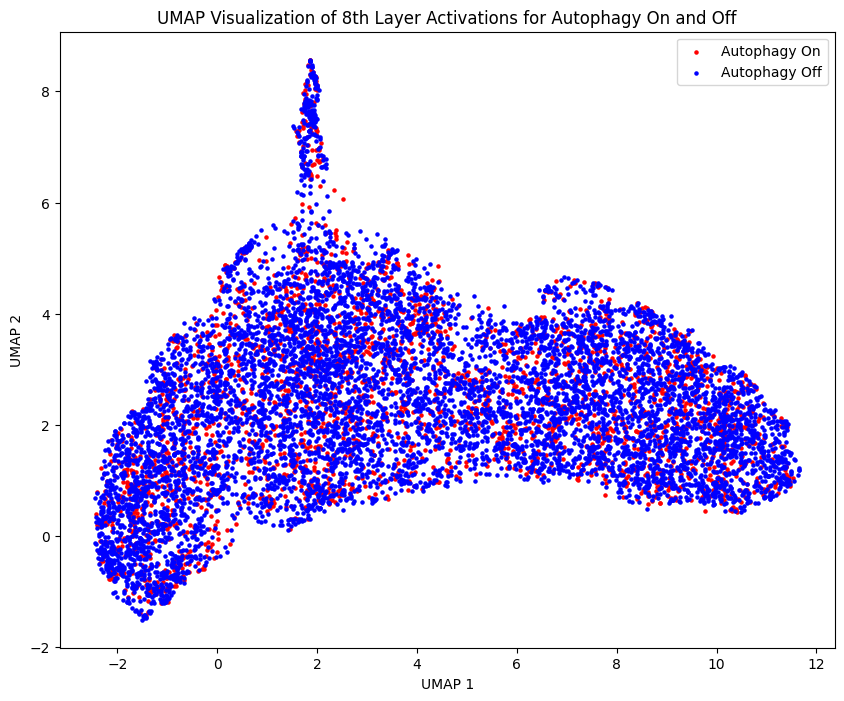

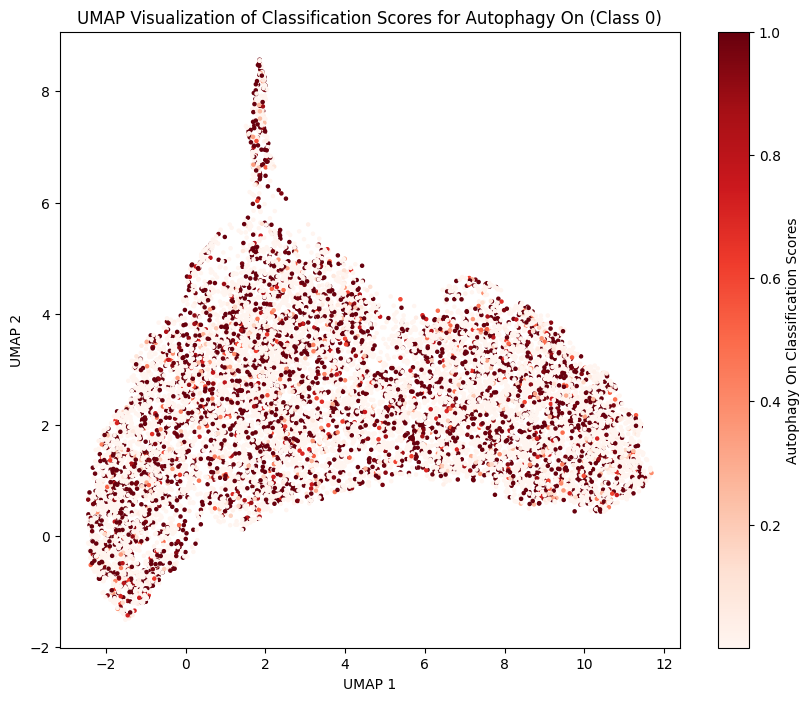

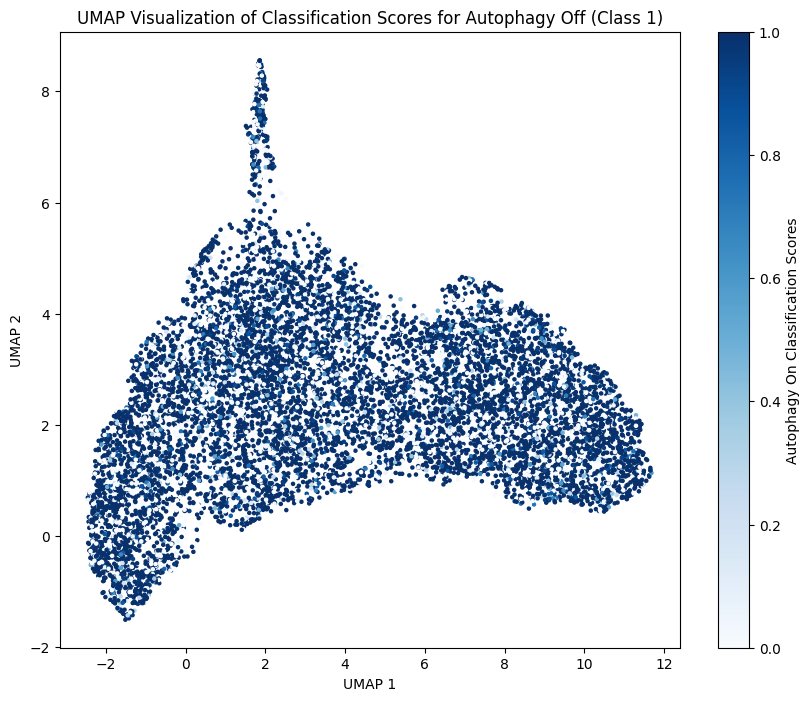

In [45]:
# Define thresholds 
autophagy_on_threshold = 0.98
autophagy_off_threshold = 0.98

# Determine indices for autophagy on and off
autophagy_on_indices = classification_scores[:, 0] > autophagy_on_threshold
autophagy_off_indices = classification_scores[:, 1] > autophagy_off_threshold

plt.figure(figsize=(10, 8))

# Autophagy On
plt.scatter(umap_result[autophagy_on_indices, 0], 
            umap_result[autophagy_on_indices, 1], 
            color='red', label='Autophagy On', s=5)

# Autophagy Off
plt.scatter(umap_result[autophagy_off_indices, 0], 
            umap_result[autophagy_off_indices, 1], 
            color='blue', label='Autophagy Off', s=5)

plt.title('UMAP Visualization of 8th Layer Activations for Autophagy On and Off')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

# Extract classification scores for autophagy on
autophagy_on_scores = classification_scores[:, 0]

# Plot UMAP with continuous colormap for autophagy on scores
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_result[:, 0], 
                      umap_result[:, 1], 
                      c=autophagy_on_scores, 
                      cmap='Reds', 
                      s=5)

cbar = plt.colorbar(scatter)
cbar.set_label('Autophagy On Classification Scores')

plt.title('UMAP Visualization of Classification Scores for Autophagy On (Class 0)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()


# Extract classification scores for autophagy off
autophagy_on_scores = classification_scores[:, 1]

# Plot UMAP with continuous colormap for autophagy on scores
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_result[:, 0], 
                      umap_result[:, 1], 
                      c=autophagy_on_scores, 
                      cmap='Blues', 
                      s=5)

cbar = plt.colorbar(scatter)
cbar.set_label('Autophagy On Classification Scores')

plt.title('UMAP Visualization of Classification Scores for Autophagy Off (Class 1)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [31]:
"""# Define the number of screening indices
num_screening_indices = len(screening_indices)

plots_per_row = 7
num_rows = (num_screening_indices + plots_per_row - 1) // plots_per_row
fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5*num_rows))

# Iterate over the screening cells and plot the images
for i, (idx, sample, scores) in enumerate(zip(screening_indices, screening_cells_data, classification_scores), 1):
    image = sample[0][0]  
    
    # Calculate the row and column indices for the subplot grid
    row_idx = (i - 1) // plots_per_row
    col_idx = (i - 1) % plots_per_row
    
    # Plot the image
    axes[row_idx, col_idx].imshow(image, cmap='viridis')
    axes[row_idx, col_idx].set_title(f"Cell ID: {idx}")
    axes[row_idx, col_idx].axis('off')
    
    # Add classification scores as text
    axes[row_idx, col_idx].text(0.5, -0.2, f"Class 0 autophagy_2_1 Score: {scores[0]:.2f}", horizontalalignment='center', verticalalignment='center', transform=axes[row_idx, col_idx].transAxes)
    axes[row_idx, col_idx].text(0.5, -0.35, f"Class 1 autophagy_2_1 Score: {scores[1]:.2f}", horizontalalignment='center', verticalalignment='center', transform=axes[row_idx, col_idx].transAxes)
plt.tight_layout()
plt.show()"""

'# Define the number of screening indices\nnum_screening_indices = len(screening_indices)\n\nplots_per_row = 7\nnum_rows = (num_screening_indices + plots_per_row - 1) // plots_per_row\nfig, axes = plt.subplots(num_rows, plots_per_row, figsize=(20, 5*num_rows))\n\n# Iterate over the screening cells and plot the images\nfor i, (idx, sample, scores) in enumerate(zip(screening_indices, screening_cells_data, classification_scores), 1):\n    image = sample[0][0]  \n    \n    # Calculate the row and column indices for the subplot grid\n    row_idx = (i - 1) // plots_per_row\n    col_idx = (i - 1) % plots_per_row\n    \n    # Plot the image\n    axes[row_idx, col_idx].imshow(image, cmap=\'viridis\')\n    axes[row_idx, col_idx].set_title(f"Cell ID: {idx}")\n    axes[row_idx, col_idx].axis(\'off\')\n    \n    # Add classification scores as text\n    axes[row_idx, col_idx].text(0.5, -0.2, f"Class 0 autophagy_2_1 Score: {scores[0]:.2f}", horizontalalignment=\'center\', verticalalignment=\'center\'

In [44]:
#Save the adata
adata.write('single_model_seed_1_Case1_adata.h5ad')

In [20]:
# Load the adata
adata = sc.read_h5ad('single_model_seed_1_Case1_adata.h5ad')
adata

AnnData object with n_obs × n_vars = 12000 × 2
    obs: 'class_labels', 'leiden', 'LOF_scores'
    uns: 'class_labels_colors', 'leiden', 'leiden_colors', 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

### LOF calculation

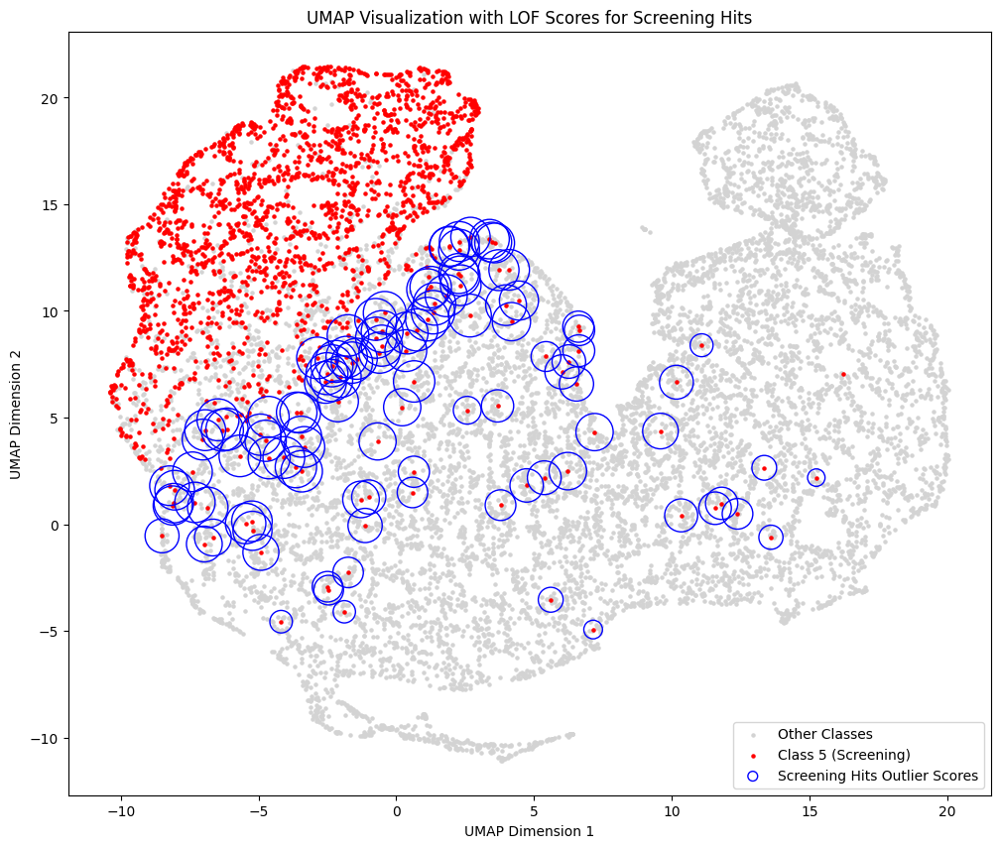

In [27]:
from sklearn.neighbors import LocalOutlierFactor
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerPathCollection
import numpy as np

# Step 1: Define the mask for Class 5 cells and the mask for screening hits
screening_class_5_mask = (adata.obs['class_labels'] == 'Class 5 (Screening)')
not_in_selected_clusters_mask = ~adata.obs['leiden'].isin(selected_clusters)
screening_hits_mask = screening_class_5_mask & not_in_selected_clusters_mask
umap_coords = adata.obsm['X_umap']

# Extract UMAP coordinates for all Class 5 cells and screening hits
class_5_coords = umap_coords[screening_class_5_mask]
screening_hits_coords = umap_coords[screening_hits_mask]

# Calculate LOF scores for both sets
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)

# Calculate LOF scores for all Class 5 cells
lof_class_5_scores = -lof.fit_predict(class_5_coords)
lof_class_5_outlier_scores = -lof.negative_outlier_factor_

# Calculate LOF scores for screening hits only
lof_hits_scores = -lof.fit_predict(screening_hits_coords)
lof_hits_outlier_scores = -lof.negative_outlier_factor_

# Plot the UMAP with LOF-based outlier visualization
plt.figure(figsize=(12, 10))

# Plot non-Class 5 cells in gray for context
plt.scatter(umap_coords[~screening_class_5_mask, 0], umap_coords[~screening_class_5_mask, 1], 
            color="lightgrey", s=5, label="Other Classes")

# Plot all Class 5 cells as background in red
plt.scatter(class_5_coords[:, 0], class_5_coords[:, 1], 
            color="red", s=5, label="Class 5 (Screening)")

# Define circle radii based on LOF scores for screening hits
# Normalize and scale up the radius for visualization
hits_radius = (lof_hits_outlier_scores.max() - lof_hits_outlier_scores) / (lof_hits_outlier_scores.max() - lof_hits_outlier_scores.min())
hits_marker_sizes = 1000 * hits_radius

# Custom function to update legend marker size
def update_legend_marker_size(handle, orig):
    handle.update_from(orig)
    handle.set_sizes([50])  

# Plot the outliers based on LOF for screening hits with circles
scatter = plt.scatter(
    screening_hits_coords[:, 0], screening_hits_coords[:, 1], 
    s=hits_marker_sizes, edgecolors="b", facecolors="none", label="Screening Hits Outlier Scores"
)

# Configure plot details
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.title("UMAP Visualization with LOF Scores for Screening Hits")
plt.legend(handler_map={scatter: HandlerPathCollection(update_func=update_legend_marker_size)})

plt.show()

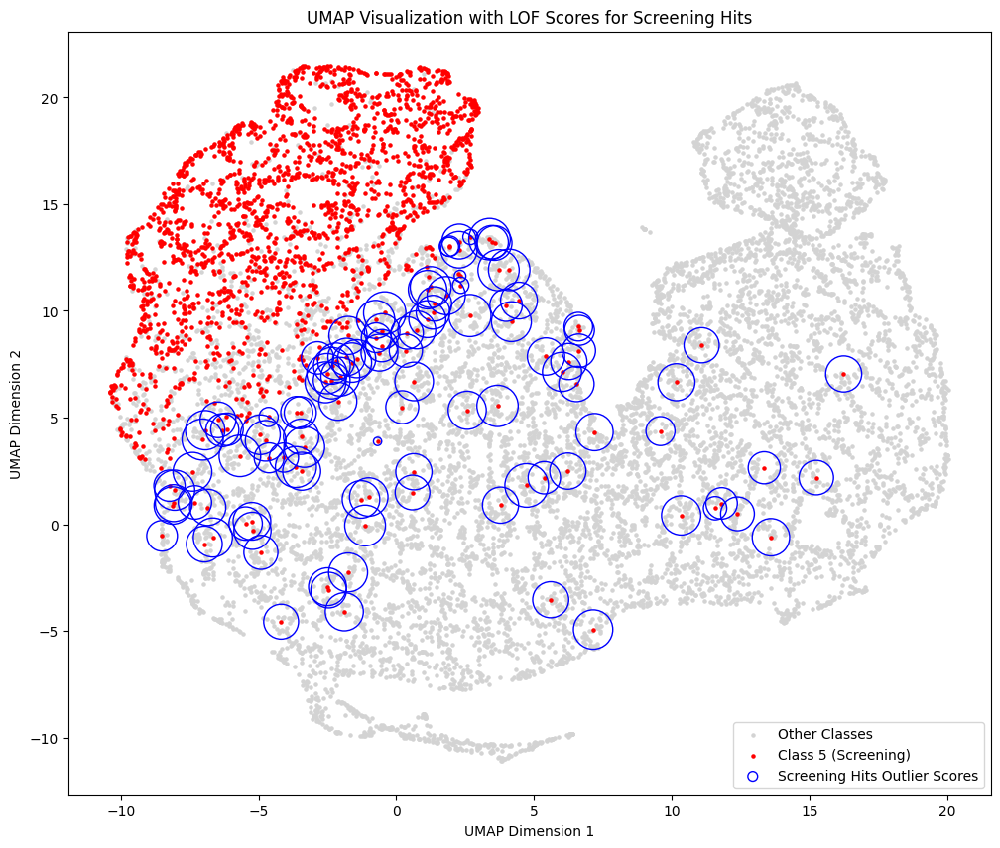

In [56]:
#Define the mask for Class 5 cells and the mask for screening hits
screening_class_5_mask = (adata.obs['class_labels'] == 'Class 5 (Screening)')
not_in_selected_clusters_mask = ~adata.obs['leiden'].isin(selected_clusters)
screening_hits_mask = screening_class_5_mask & not_in_selected_clusters_mask

umap_coords = adata.obsm['X_umap']

# Extract UMAP coordinates for all Class 5 cells and screening hits
class_5_coords = umap_coords[screening_class_5_mask]
screening_hits_coords = umap_coords[screening_hits_mask]

# Use the LOF scores already computed in adata.obs['LOF_scores']
lof_scores = adata.obs['LOF_scores']

# Extract LOF scores for Class 5 cells and screening hits
lof_class_5_scores = lof_scores[screening_class_5_mask]
lof_hits_scores = lof_scores[screening_hits_mask]

# Plot the UMAP with LOF-based outlier visualization
plt.figure(figsize=(12, 10))

# Plot non-Class 5 cells in gray for context
plt.scatter(umap_coords[~screening_class_5_mask, 0], umap_coords[~screening_class_5_mask, 1], 
            color="lightgrey", s=5, label="Other Classes")

# Plot all Class 5 cells as background in red
plt.scatter(class_5_coords[:, 0], class_5_coords[:, 1], 
            color="red", s=5, label="Class 5 (Screening)")

# Define circle radii based on LOF scores for screening hits
# Normalize and scale up the radius for visualization (invert LOF scores for outlier detection)
hits_radius = (lof_hits_scores.max() - lof_hits_scores) / (lof_hits_scores.max() - lof_hits_scores.min())
hits_marker_sizes = 1000 * hits_radius  # Adjust the factor if needed for better visualization

# Custom function to update legend marker size
def update_legend_marker_size(handle, orig):
    handle.update_from(orig)
    handle.set_sizes([50])  # Smaller size for legend marker

# Plot the outliers based on LOF for screening hits with circles
scatter = plt.scatter(
    screening_hits_coords[:, 0], screening_hits_coords[:, 1], 
    s=hits_marker_sizes, edgecolors="b", facecolors="none", label="Screening Hits Outlier Scores"
)

# Configure plot details
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.title("UMAP Visualization with LOF Scores for Screening Hits")
plt.legend(handler_map={scatter: HandlerPathCollection(update_func=update_legend_marker_size)})

plt.show()

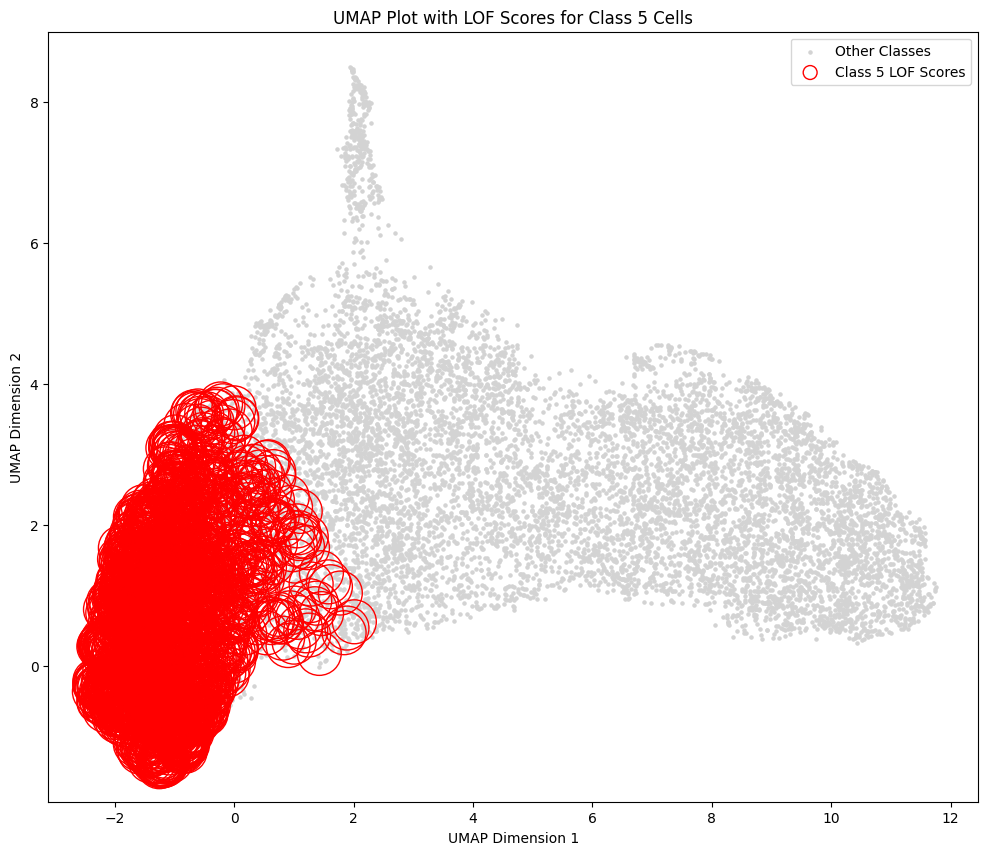

In [39]:
# Filter UMAP results to only include class 5 cells
class_5_indices = np.where(labels == 5)[0]
umap_class_5 = umap_result[class_5_indices]  # UMAP points for class 5 cells

#Calculate LOF scores specifically for class 5 cells
lof_class_5 = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
lof_scores_class_5 = -lof_class_5.fit_predict(umap_class_5)  # Higher scores = more outlier

#Normalize radii for visualization based on LOF scores
radius_class_5 = (lof_scores_class_5.max() - lof_scores_class_5) / (lof_scores_class_5.max() - lof_scores_class_5.min())
marker_sizes = 1000 * radius_class_5  # Scale up for better visibility

def update_legend_marker_size(handle, orig):
    handle.update_from(orig)
    handle.set_sizes([100])  # Legend marker size

#Plot UMAP for all cells with class 5 highlighted by LOF-based marker sizes
plt.figure(figsize=(12, 10))

# Plot all other cells in light gray for context
other_classes_indices = np.where(labels != 5)[0]
plt.scatter(
    umap_result[other_classes_indices, 0],
    umap_result[other_classes_indices, 1],
    color="lightgray",
    s=5,
    label="Other Classes"
)

# Plot class 5 cells with LOF-based outlier scoring
scatter = plt.scatter(
    umap_class_5[:, 0],
    umap_class_5[:, 1],
    s=marker_sizes,         
    edgecolors="red",         
    facecolors="none",        
    label="Class 5 LOF Scores"
)

plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.title("UMAP Plot with LOF Scores for Class 5 Cells")
plt.legend(
    handler_map={scatter: HandlerPathCollection(update_func=update_legend_marker_size)}
)

plt.show()

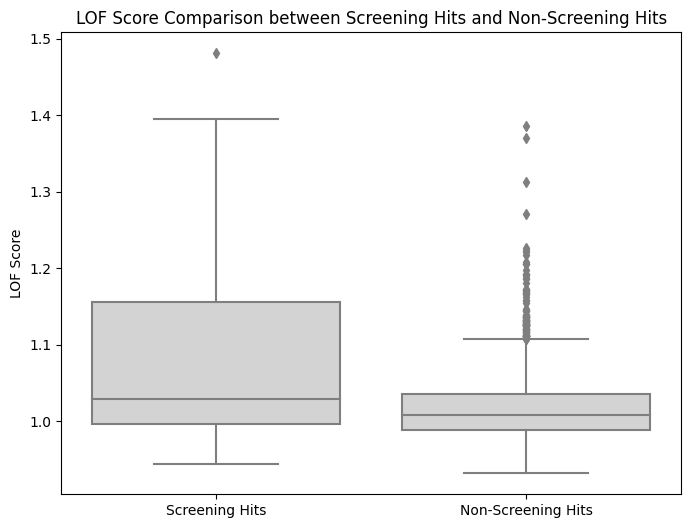

In [34]:
# Separate LOF scores for screening hits and non-screening hits
lof_scores_hits = lof_hits_outlier_scores  # LOF scores for screening hits
lof_scores_non_hits = lof_class_5_outlier_scores[~screening_hits_mask[screening_class_5_mask]]  # non-hit LOF scores

# Plot boxplot for a more compact comparison
plt.figure(figsize=(8, 6))
sns.boxplot(data=[lof_scores_hits, lof_scores_non_hits], palette=["lightgrey", "lightgrey"])
plt.xticks([0, 1], ["Screening Hits", "Non-Screening Hits"])
plt.ylabel("LOF Score")
plt.title("LOF Score Comparison between Screening Hits and Non-Screening Hits")
plt.show()

In [36]:
# Use UMAP coordinates for LOF 
umap_data = adata.obsm['X_umap']

# Fit LOF model
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
lof.fit(umap_data)

# Get LOF scores (negative outlier factor; lower values indicate stronger outliers)
lof_scores = -lof.negative_outlier_factor_

In [40]:
adata.obs['LOF_scores'] = lof_scores
adata.obs

,class_labels,leiden,LOF_scores
0,Class 2 (ATG5 K0),19,0.962623
1,Class 3 (Stim. timecourse),41,1.012499
2,Class 1 (Unstim.),40,0.983775
3,Class 3 (Stim. timecourse),33,0.993520
4,Class 0 (Stim.),19,0.996100
...,...,...,...
11995,Class 3 (Stim. timecourse),35,1.007377
11996,Class 5 (Screening),32,1.029879
11997,Class 5 (Screening),6,1.071300
11998,Class 1 (Unstim.),3,0.999939


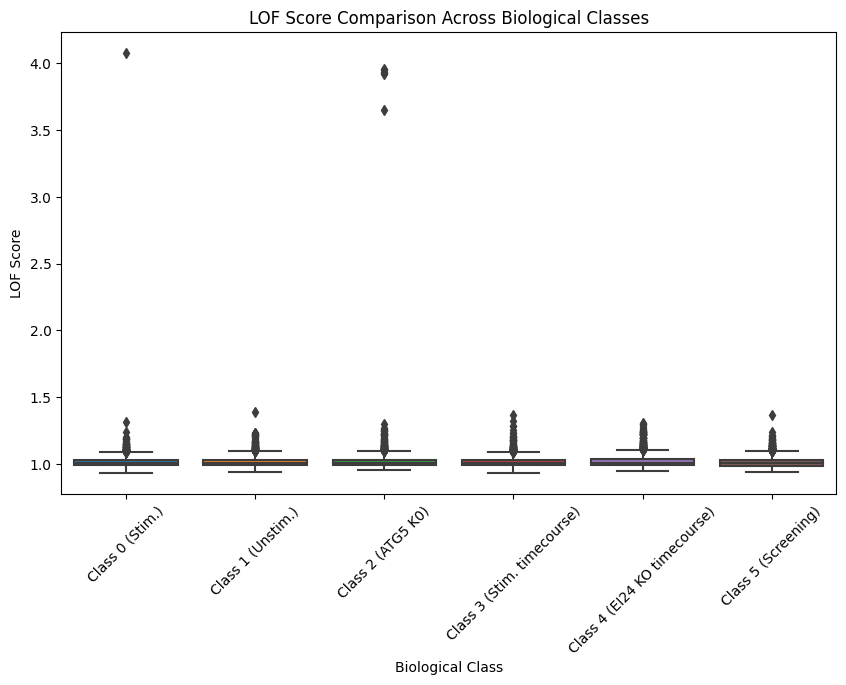

In [41]:
# Prepare data for boxplot: extract class labels and their corresponding LOF scores
lof_scores_by_class = adata.obs[['class_labels', 'LOF_scores']]

# Plot boxplot for each biological class
plt.figure(figsize=(10, 6))
sns.boxplot(data=lof_scores_by_class, x='class_labels', y='LOF_scores')
plt.xticks(rotation=45)  # Rotate x labels if they are long
plt.xlabel("Biological Class")
plt.ylabel("LOF Score")
plt.title("LOF Score Comparison Across Biological Classes")
plt.show()

## LOF for novelty detection

We want an outlier score wrt class 0 and not just general outlier score (as done in the other LOF calculation before)! If smth is close to lots of class 0 instances, it is not an outlier, it is a False Positive. Thus, the reference class is class 0 and we evaluate its relationship with class 5 to find out if our screening hits are FP or likely true hits. 
The reason why we dont include class 3 in background is that we might still consider a perturbation which arrested signallign at 4h timepoint, we still call it a hit.

* Use the activations corresponding to class 0 instances as the training set for LOF.
* Extract activations for class 5 as the test set.

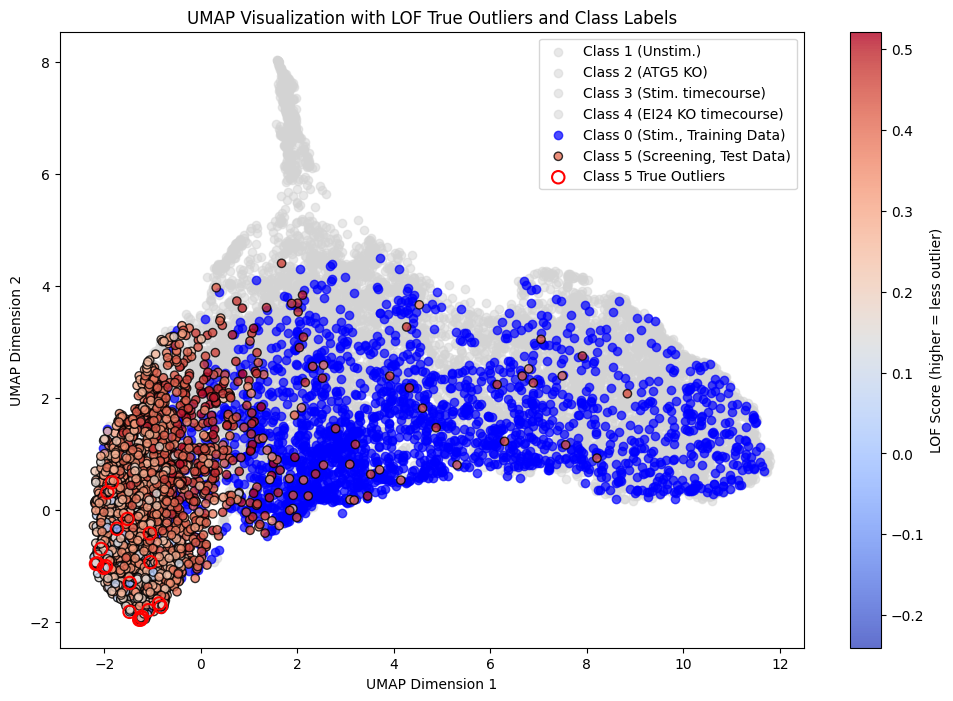

In [66]:
# Reshape activations
activations_flat = activations.reshape(activations.shape[0], -1)

# Separate class 0 and class 5 activations
class_0_indices = labels == 0  
class_5_indices = labels == 5 

class_0_activations = activations_flat[class_0_indices]
class_5_activations = activations_flat[class_5_indices]

# Fit LOF on class 0 activations
lof = LocalOutlierFactor(n_neighbors=20, novelty=True)
lof.fit(class_0_activations)

# Get LOF scores for class 5 activations
class_5_scores = lof.decision_function(class_5_activations)  # Higher is better
class_5_outliers = lof.predict(class_5_activations)  # -1 = outlier, 1 = inlier

plt.figure(figsize=(12, 8))

# all other classes in grey
for cls, label in enumerate(class_labels):
    if cls not in [0, 5]:
        indices = labels == cls
        plt.scatter(
            umap_result[indices, 0],
            umap_result[indices, 1],
            color="lightgrey",
            label=f"{label}",
            alpha=0.5
        )

# Highlight Class 0
plt.scatter(
    umap_result[class_0_indices, 0],
    umap_result[class_0_indices, 1],
    color="blue",
    label="Class 0 (Stim., Training Data)",
    alpha=0.7,
)

# Highlight Class 5 with LOF scores
scatter = plt.scatter(
    umap_result[class_5_indices, 0],
    umap_result[class_5_indices, 1],
    c=class_5_scores,
    cmap="coolwarm",
    label="Class 5 (Screening, Test Data)",
    edgecolor="k",
    alpha=0.8,
)
plt.colorbar(scatter, label="LOF Score (higher = less outlier)")

# Mark True Outliers in Class 5
plt.scatter(
    umap_result[class_5_indices][class_5_outliers == -1, 0],
    umap_result[class_5_indices][class_5_outliers == -1, 1],
    edgecolor="red",
    facecolor="none",
    label="Class 5 True Outliers",
    s=80,
    linewidth=1.5,
)

plt.title("UMAP Visualization with LOF True Outliers and Class Labels")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.legend()
plt.show()

* A false positive occurs when a class 5 screening cell is incorrectly flagged as an outlier, but it is actually close to class 0 cells (Stimulated training data).
* A true outlier is a class 5 screening cell that is far from class 0 cells, indicating that it is dissimilar to the training data (Stimulated cells).
* High LOF score: Indicates a data point is less likely an outlier, meaning it fits well within the local density of its neighbors (closer to class 0 cells).
* Low LOF score: Indicates a data point is more likely an outlier, meaning it deviates significantly from the local density of its neighbors (far from class 0 cells).

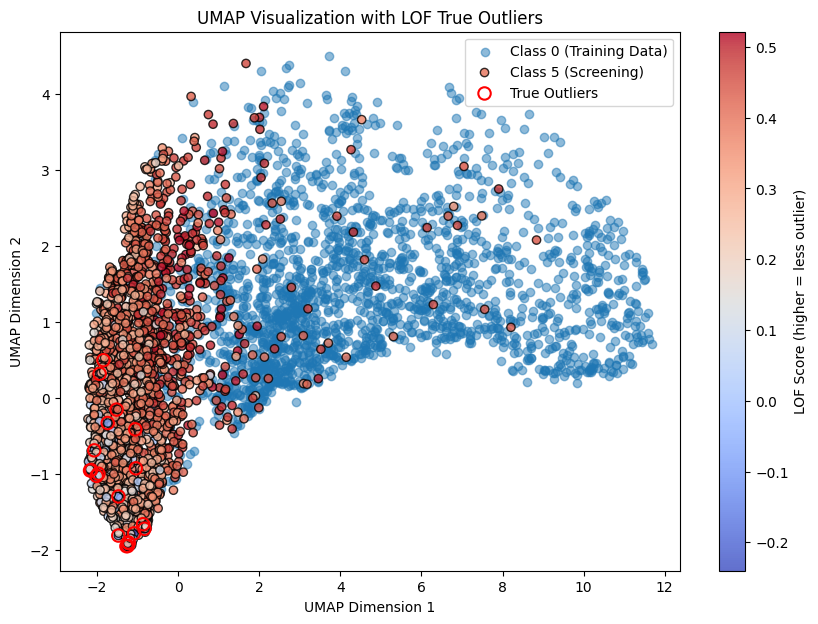

In [50]:
plt.figure(figsize=(10, 7))
plt.scatter(umap_class_0[:, 0], umap_class_0[:, 1], label="Class 0 (Training Data)", alpha=0.5)
plt.scatter(
    umap_class_5[:, 0],
    umap_class_5[:, 1],
    c=class_5_scores,
    cmap="coolwarm",
    label="Class 5 (Screening)",
    edgecolor="k",
    alpha=0.8
)
plt.colorbar(label="LOF Score (higher = less outlier)")
plt.scatter(
    umap_class_5[class_5_outliers == -1, 0],
    umap_class_5[class_5_outliers == -1, 1],
    edgecolor="red",
    facecolor="none",
    label="True Outliers",
    s=80,
    linewidth=1.5,
)
plt.title("UMAP Visualization with LOF True Outliers")
plt.legend()
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.show()

Plot only class 0 and class 5 this time.

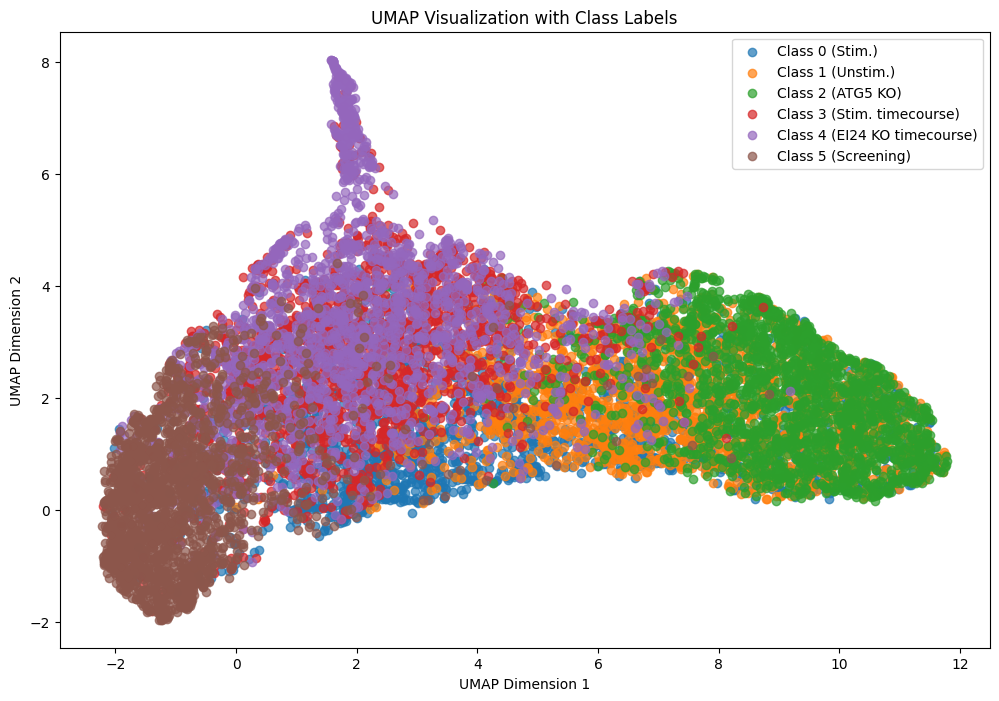

In [52]:
class_labels = [
    "Class 0 (Stim.)",
    "Class 1 (Unstim.)",
    "Class 2 (ATG5 KO)",
    "Class 3 (Stim. timecourse)",
    "Class 4 (EI24 KO timecourse)",
    "Class 5 (Screening)",
]

# Plot UMAP with class labels
plt.figure(figsize=(12, 8))
for cls, label in enumerate(class_labels):
    indices = labels == cls
    plt.scatter(
        umap_result[indices, 0],
        umap_result[indices, 1],
        label=label,
        alpha=0.7,
    )

plt.title("UMAP Visualization with Class Labels")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.legend()
plt.show()

In [61]:
# Compute LOF scores 
#outlier_scores_class_0 = lof.score_samples(class_0_activations)  # Higher = less outlier
#outlier_scores_class_5 = lof.score_samples(class_5_activations)

# Define a threshold for true outliers: 5th percentile of Class 0 LOF scores
threshold = np.percentile(outlier_scores_class_0, 5)

# Identify true outliers and false positives in Class 5
true_outliers_indices = outlier_scores_class_5 < threshold  # True outliers: below threshold
false_positives_indices = ~true_outliers_indices  # False positives: above threshold

# Count the numbers
num_true_outliers = np.sum(true_outliers_indices)
num_false_positives = np.sum(false_positives_indices)

print(f"Threshold (5th percentile of Class 0 LOF scores): {threshold}")
print(f"Number of True Outliers in Class 5: {num_true_outliers}")
print(f"Number of False Positives in Class 5: {num_false_positives}")

Threshold (5th percentile of Class 0 LOF scores): -1.1610441982746125
Number of True Outliers in Class 5: 956
Number of False Positives in Class 5: 1044


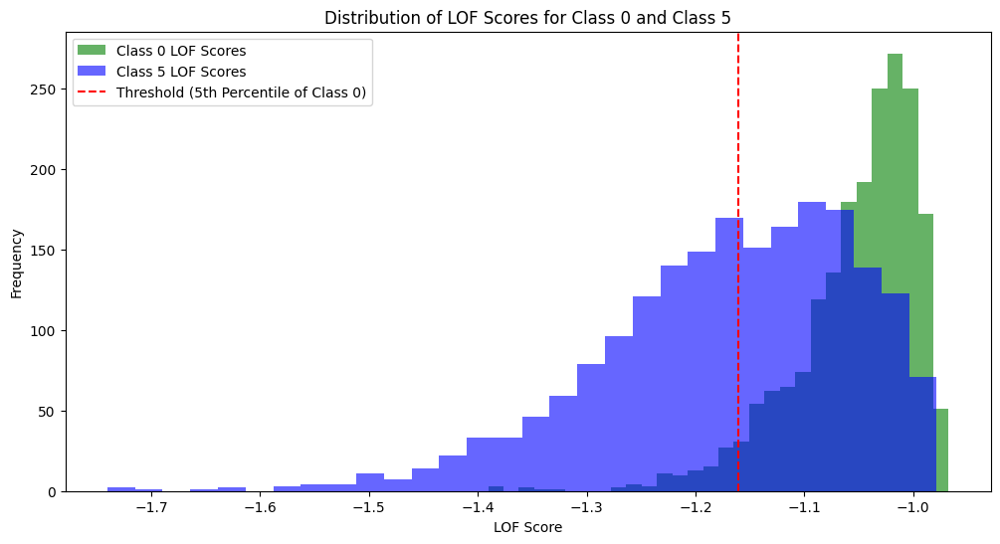

In [62]:
#Distribution of LOF Scores ----
plt.figure(figsize=(12, 6))


plt.hist(outlier_scores_class_0, bins=30, alpha=0.6, color="green", label="Class 0 LOF Scores")
plt.hist(outlier_scores_class_5, bins=30, alpha=0.6, color="blue", label="Class 5 LOF Scores")
plt.axvline(x=threshold, color="red", linestyle="--", label=f"Threshold (5th Percentile of Class 0)")

plt.title("Distribution of LOF Scores for Class 0 and Class 5")
plt.xlabel("LOF Score")
plt.ylabel("Frequency")
plt.legend(loc="upper left")
plt.show()

## Plot UMAP on new balanced testset with all biological classes with cell_ids

In [18]:
def load_dataset(save_path, batch_size):
    """
    Load dataset with images, labels, and cell IDs.

    Parameters:
    - save_path: Path where the dataset is stored
    - batch_size: Batch size for DataLoader

    Returns:
    - DataLoader for the dataset
    """
    images_tensor, labels_tensor, cell_ids_tensor = torch.load(save_path)

    # Create a TensorDataset from the loaded tensors
    dataset = torch.utils.data.TensorDataset(images_tensor, labels_tensor, cell_ids_tensor)
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    print(f"Loaded dataset from {save_path}")
    return data_loader

In [9]:
# Load the balanced test dataset
test_data_loader = load_dataset(
    "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset.pt",
    batch_size=64
)

Loaded dataset from /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset.pt


In [10]:
# Define the number of classes (must match what was used during training)
num_classes = 6

# Reinitialize the model architecture (same as during training)
model = MultiClassClassifier(num_classes)

# Specify the device (same as during training)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


# Load the balanced testset
test_data_loader = load_dataset("/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset.pt", batch_size)

seed = 1  

try:
    model.load_state_dict(torch.load(f'/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/ensemble_models/ensemble_multi_class_VGG2_case1_seed_{seed}.pth'))
    print(f"Model for seed {seed} successfully loaded.")
except Exception as e:
    print(f"Error loading model for seed {seed}: {str(e)}")

Loaded dataset from /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset.pt
Model for seed 1 successfully loaded.


In [6]:
original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

layer_name = 'features.24' # 8th layer activations name from model architecture

# define the return layers for IntermediateLayerGetter
return_layers = {layer_name: layer_name}

# Initialize the model with correct feature output
mid_getter = MidGetter(model, return_layers=return_layers, keep_output=True)

# Define the size of the subset!!! (not full dataset here due to kernal crahsing!)
subset_size = 12000 

# Create DataLoader
batch_size = 256

# Randomly sample a subset of the dataset
subset_indices = torch.randperm(len(original_dataset))[:subset_size]
torch.save(subset_indices, 'single_model_seed_1_Case_1_subset_indices_new.pth')
subset_indices = torch.load('single_model_seed_1_Case_1_subset_indices_new.pth')

# Create a new subset sampler with the loaded indices
subset_sampler = SubsetRandomSampler(subset_indices)

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Lists to store activations and labels
activations = []
labels = []
cell_ids_list = []

# Forward pass of subset through the model to get activations
with torch.no_grad():
    for data, label, cell_ids in tqdm(subset_data_loader, desc="Processing data", leave=False):
        data = data.to(device) 
        mid_outputs, _ = mid_getter(data)
        # Get the activations
        activations.append(mid_outputs[layer_name].cpu().detach().numpy())
        labels.append(label.numpy())
        cell_ids_list.append(cell_ids.numpy())

# Concatenate activations and labels from all batches
activations = np.concatenate(activations, axis=0)
labels = np.concatenate(labels, axis=0)
cell_ids_array = np.concatenate(cell_ids_list, axis=0)

Processing data:   0%|          | 0/47 [00:00<?, ?it/s]

In [7]:
#save activations and labels to files
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_activations_layer_8_new.npy', activations)
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_labels_layer_8_new.npy', labels)
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_cell_ids_layer_8_new.npy', cell_ids_array)

In [23]:
# Load activations, labels, and cell IDs
activations = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_activations_layer_8_new.npy')
labels = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_labels_layer_8_new.npy')
cell_ids_array = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_cell_ids_layer_8_new.npy')

# Verif
print("Activations shape:", activations.shape)
print("Labels shape:", labels.shape)
print("Cell IDs shape:", cell_ids_array.shape)

Activations shape: (12000, 512, 8, 8)
Labels shape: (12000,)
Cell IDs shape: (12000,)


In [24]:
# Reshape activations to 2 dims
activations_flat = activations.reshape(activations.shape[0], -1)
activations_flat

array([[2.74468541e-01, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.45257580e-01, 0.00000000e+00, 3.01072061e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.18580836e-01, 0.00000000e+00, 5.84481924e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [4.44361031e-01, 1.23568244e-01, 6.38086975e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [4.50214118e-01, 0.00000000e+00, 9.86273065e-02, ...,
        2.78514773e-02, 0.00000000e+00, 0.00000000e+00],
       [4.33485895e-01, 2.10066289e-01, 8.21662843e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]], dtype=float32)

In [26]:
%matplotlib inline
import umap.umap_ as umap

# Calc. UMAP
umap_reducer = umap.UMAP(n_components=2)
umap_result = umap_reducer.fit_transform(activations_flat)

# Define new class labels 
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Stim. timecourse)", "Class 4 (EI24 KO timecourse)", "Class 5 (Screening)"]

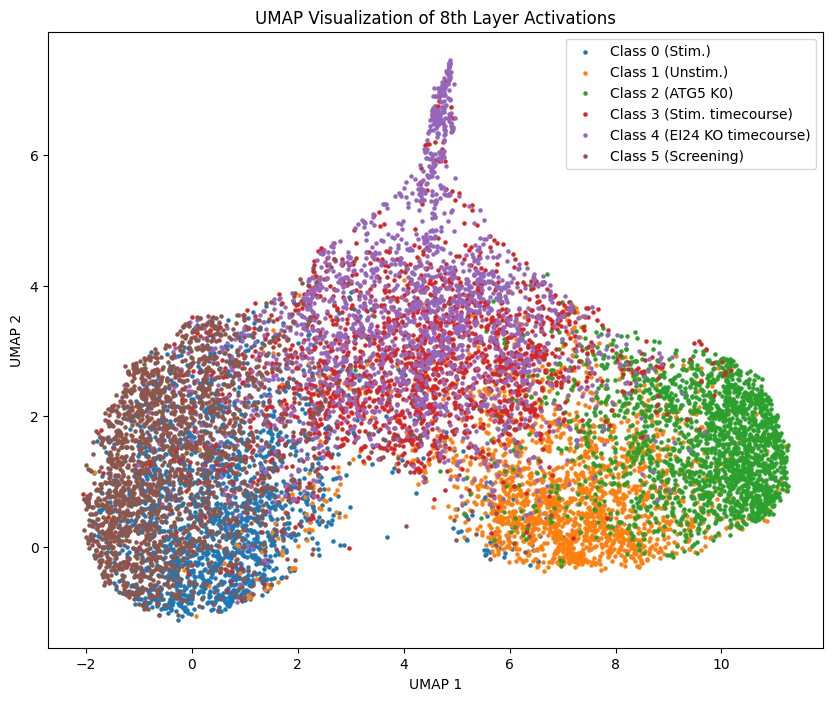

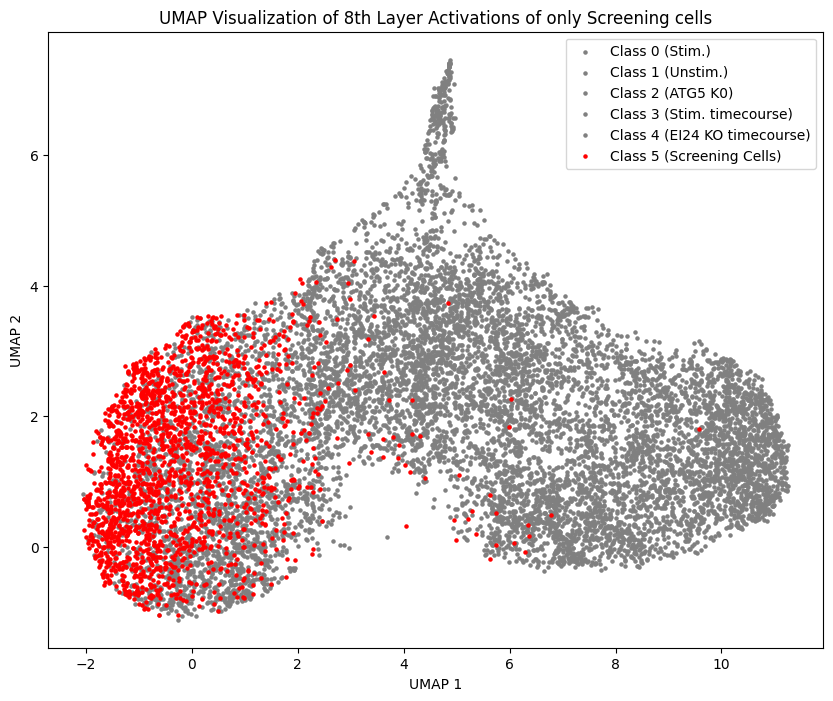

In [27]:
#Plotting UMAP using scatterplot instead of via scanpy
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()
plt.figure(figsize=(10, 8))

# Plot cells belonging to other classes in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude the last class (screening)
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)
    
    
# Plot cells belonging to class 5 (screening) with red color
screening_idx = labels == 5
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], color='red', label='Class 5 (Screening Cells)', s=5)

plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations of only Screening cells')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

# Determine the class index from the classification scores index
class_index = 0 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

In [ ]:
import os

# Ensure UMAP x-coordinates are in NumPy format
x_coords = np.asarray(umap_result[:, 0])
y_coords = np.asarray(umap_result[:, 1])
labels = np.asarray(labels)

# Ensure `cell_ids_array` is a NumPy array (convert if necessary)
cell_ids_array = np.array(cell_ids_array) if isinstance(cell_ids_array, np.ndarray) else np.array(list(map(str, cell_ids_array)))

# Identify screening cells (Class 5)
screening_idx = labels == 5

# Apply the threshold: Keep only Class 5 cells where x >= 3
filtered_idx = screening_idx & (x_coords >= 3)

# Extract the filtered cell IDs
filtered_cell_ids = cell_ids_array[filtered_idx]

# Define save path
save_path = "./de_novo_output_files/de_novo_outside_block_screening_hits.txt"

# Ensure the directory exists
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save to file
np.savetxt(save_path, filtered_cell_ids, fmt="%s")  # Use %s if cell IDs are not integers

print(f" Saved {len(filtered_cell_ids)} cell IDs to {save_path}")

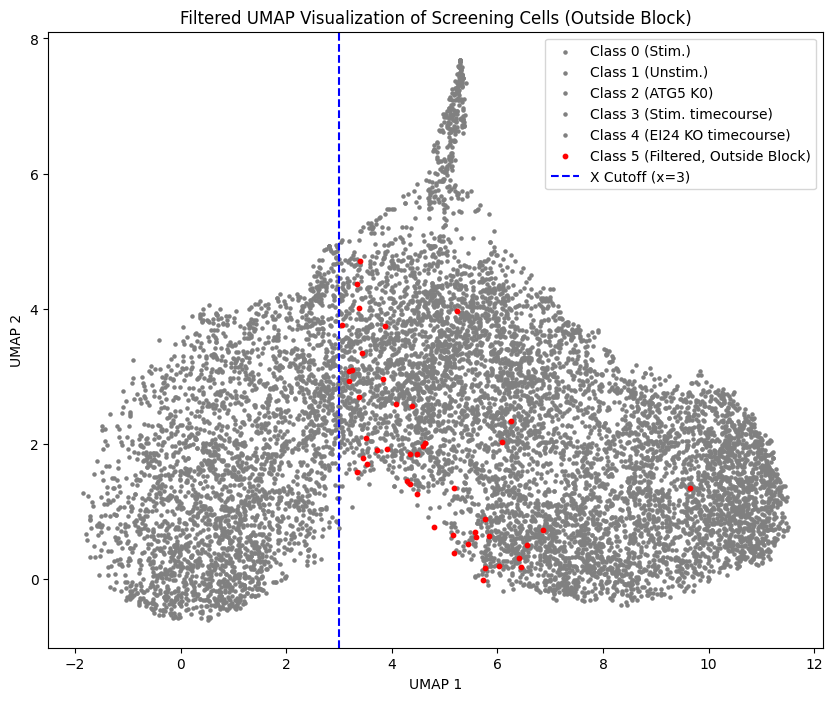

In [21]:
# Plot the UMAP visualization with applied threshold
plt.figure(figsize=(10, 8))

# Plot all other classes in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude class 5
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)

# Plot newly filtered Class 5 (Screening) cells in red (those **outside** the block)
plt.scatter(x_coords[filtered_idx], y_coords[filtered_idx], color='red', label='Class 5 (Filtered, Outside Block)', s=10)

# Highlight the excluded region in blue (x < 3)
plt.axvline(x=3, color='blue', linestyle='--', label='X Cutoff (x=3)')

plt.legend()
plt.title('Filtered UMAP Visualization of Screening Cells (Outside Block)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

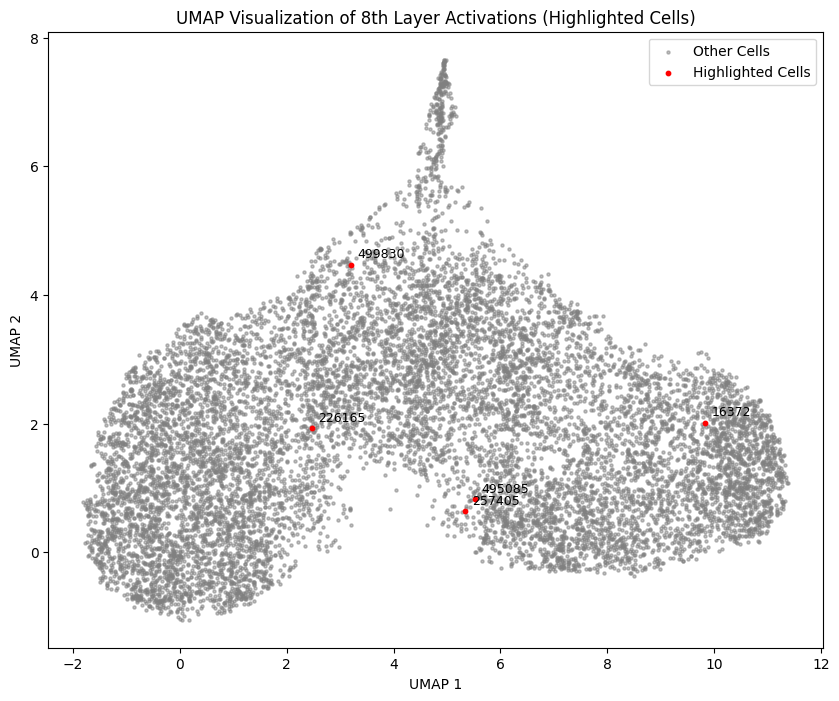

In [34]:
import numpy as np
import matplotlib.pyplot as plt
import umap

# Define the 5 cell IDs to highlight
highlighted_cell_ids = np.array([16372, 495085, 499830, 226165, 257405])

# Find indices of these Cell IDs in the dataset
highlighted_indices = np.isin(cell_ids_array, highlighted_cell_ids)

# Extract UMAP coordinates of these highlighted cells
highlighted_x = umap_result[highlighted_indices, 0]
highlighted_y = umap_result[highlighted_indices, 1]

# Plot all cells in grey
plt.figure(figsize=(10, 8))
plt.scatter(umap_result[:, 0], umap_result[:, 1], color='grey', label="Other Cells", s=5, alpha=0.5)

# Highlight specific cells in green with black edges
plt.scatter(highlighted_x, highlighted_y, color='red', edgecolors='red', s=10, label='Highlighted Cells', marker='o')

# Add labels to each highlighted point
for i, txt in enumerate(highlighted_cell_ids):
    plt.annotate(txt, (highlighted_x[i], highlighted_y[i]), fontsize=9, color='black', xytext=(5,5), textcoords='offset points')

# Legend and formatting
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations (Highlighted Cells)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

### Get the potential screening hits using a kNN approach and plot in UMAP to compare with manual threshold setting approach

1. Determine the main screening block (non-hit control) by clustering Class 5 cells in UMAP space
2. Use k-NN to compute the average distance of each screening cell to its k nearest neighbors in this control group
3. Select the top n outliers (cells with the highest average k-NN distances)
4. Save their cell IDs just like before
5. Plot a new UMAP highlighting these outlier screening hits

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import umap
from sklearn.neighbors import NearestNeighbors
import os

In [12]:
# k (nearest neighbors) and n (number of outliers)
k = 10  
n = 50  

x_coords = np.asarray(umap_result[:, 0])
y_coords = np.asarray(umap_result[:, 1])
labels = np.asarray(labels)
cell_ids_array = np.asarray(cell_ids_array, dtype=str) 

# Identify screening cells (Class 5)
screening_idx = labels == 5
screening_coords = np.column_stack((x_coords[screening_idx], y_coords[screening_idx]))

#Find the dense cluster of screening cells (non-hit control)
nbrs = NearestNeighbors(n_neighbors=k).fit(screening_coords)
distances, _ = nbrs.kneighbors(screening_coords)

#Compute the mean distance to k nearest neighbors for each cell
avg_knn_dist = distances.mean(axis=1)

# Identify the top n outliers with biggest knn distances
outlier_indices = np.argsort(avg_knn_dist)[-n:]

# Get cellIDs of outliers
outlier_cell_ids = cell_ids_array[screening_idx][outlier_indices]

In [13]:
outlier_cell_ids

array(['241798', '187445', '101936', '386043', '437493', '128326',
       '362916', '290151', '421378', '468563', '495085', '99519', '29774',
       '151985', '357679', '77796', '439251', '462577', '196000',
       '179806', '496582', '439908', '85724', '262265', '443040',
       '241751', '265034', '494985', '412475', '418387', '436832',
       '503082', '117323', '436262', '503182', '443497', '239551',
       '437730', '361820', '499830', '325509', '211297', '226165',
       '198764', '58839', '385191', '50045', '147546', '192747', '16372'],
      dtype='<U21')

In [ ]:
# Save to file
save_path = "./de_novo_output_files/knn_screening_hits.txt"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
np.savetxt(save_path, outlier_cell_ids, fmt="%s")
print(f"Saved {len(outlier_cell_ids)} potential screening hits to {save_path}")

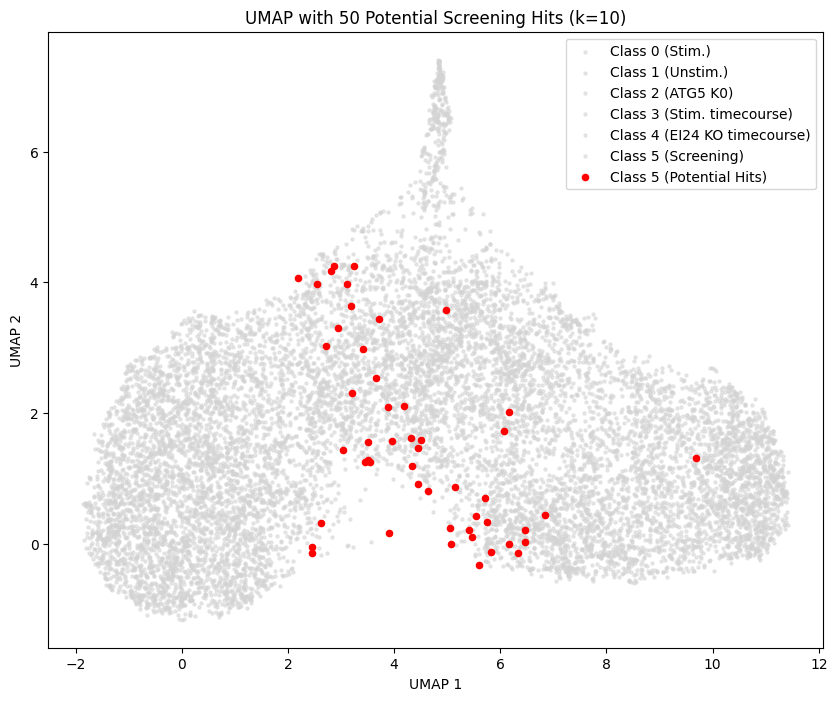

In [20]:
#UMAP this
plt.figure(figsize=(10, 8))

for i, label in enumerate(class_labels):  
    idx = labels == i
    plt.scatter(x_coords[idx], y_coords[idx], color='lightgrey', label=label, s=5, alpha=0.5)

plt.scatter(screening_coords[outlier_indices, 0], screening_coords[outlier_indices, 1], 
            color='red', label="Class 5 (Potential Hits)", s=20, edgecolors='red')

plt.legend()
plt.title(f'UMAP with {n} Potential Screening Hits (k={k})')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

### Get autophagy2_1_classifier scores

In [17]:
#Load pretrained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [18]:
checkpoint_path = "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


In [19]:
model = autophagy_classifier2_1(device)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
model.to(device)
model.eval()

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.7. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../../workspace/SPARCSpy/src/pretrained_models/autophagy/autophagy2.1/VGG2_autophagy_classifier2.1.cpkt`


MultilabelSupervisedModel(
  (network): _VGG2(
    (norm): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (softmax): LogSoftmax(dim=1)
    (features): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU(inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU(inplace=True)
      (11): Conv2d(256, 256, k

In [13]:
# Define the subset size and batch size
subset_size = 10000
batch_size = 256

# Load the subset indices
subset_indices = torch.load('single_model_seed_1_Case_1_subset_indices_new.pth')

In [27]:
# Create a SubsetRandomSampler
subset_sampler = SubsetRandomSampler(subset_indices)

original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Get the first batch from the DataLoader
#for data in subset_data_loader:
    #print(type(data))  # Check the type of data
    #print(len(data))  # Check how many elements in the batch
    #print(data)  # Print the batch to inspect what is returned
    #break  # Exit after inspecting the first batch

classification_scores = []
out_labels = []
cell_ids = []

# Calculate Classification Scores
with torch.no_grad():
    for data, labels, ids in tqdm(subset_data_loader, desc="Calculating Scores", leave=False):
        data = data.to(device)
        logits = model(data)
        probabilities = torch.softmax(logits, dim=1)

        # Save classification scores, labels, and cell ids
        classification_scores.append(probabilities.cpu().detach().numpy())
        out_labels.append(labels.cpu().detach())
        cell_ids.append(ids.cpu().detach().numpy())

# Concatenate classification scores, labels, and cell IDs from all batches
classification_scores = np.concatenate(classification_scores, axis=0)
#out_labels = np.concatenate(out_labels, axis=0)
#out_labels = torch.cat(out_labels, dim=0)  # Concatenate the tensor lists into one tensor
cell_ids = np.concatenate(cell_ids, axis=0)

Calculating Scores:   0%|          | 0/47 [00:00<?, ?it/s]

In [28]:
# Save classification scores to a file
#np.save('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_classification_scores_new.npy', classification_scores)

# Save out_labels as torch tensor
#torch.save(out_labels, 'single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new.pth')


# Save the three arrays to a .npy file
np.save('classification_scores.npy', classification_scores)

#Save out_labels as a PyTorch tensor
torch.save(out_labels, 'single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new.pth')
np.save('cell_ids.npy', cell_ids)

In [ ]:
# Load scores and labels
#classification_scores = np.load('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_classification_scores_new.npy')
#out_labels = torch.load('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new.pth')

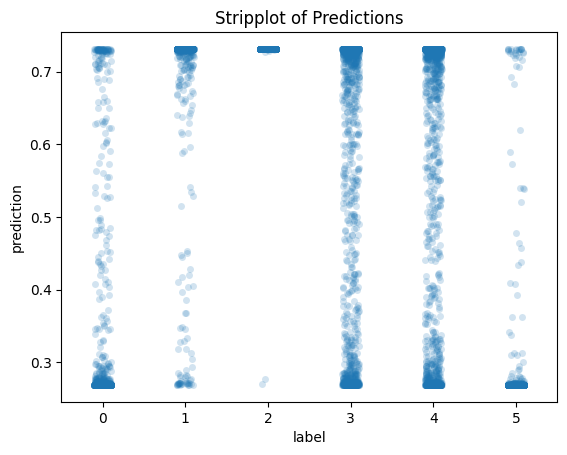

In [29]:
reform_labels = torch.hstack(out_labels)
reform_res = torch.tensor(classification_scores).softmax(dim=1)[:, 1]

#Strip Plot
sns.stripplot(x=reform_labels.numpy(), y=reform_res.numpy(), alpha=0.2)
plt.xlabel('label')
plt.ylabel('prediction')
plt.title('Stripplot of Predictions')
plt.show()

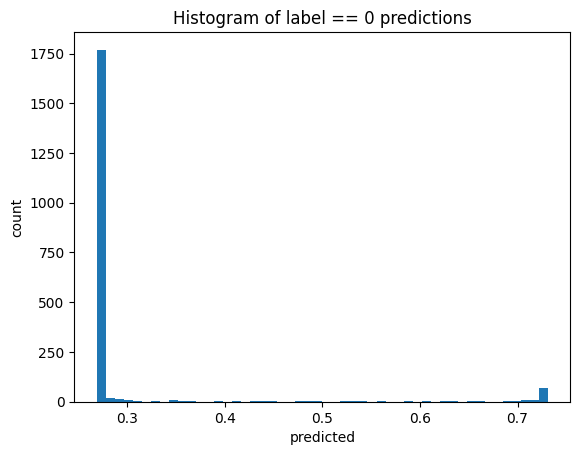

In [30]:
# Histogram
plt.hist(reform_res[reform_labels == 0].numpy(), bins=50)
plt.title('Histogram of label == 0 predictions')
plt.xlabel('predicted')
plt.ylabel('count')
plt.show()

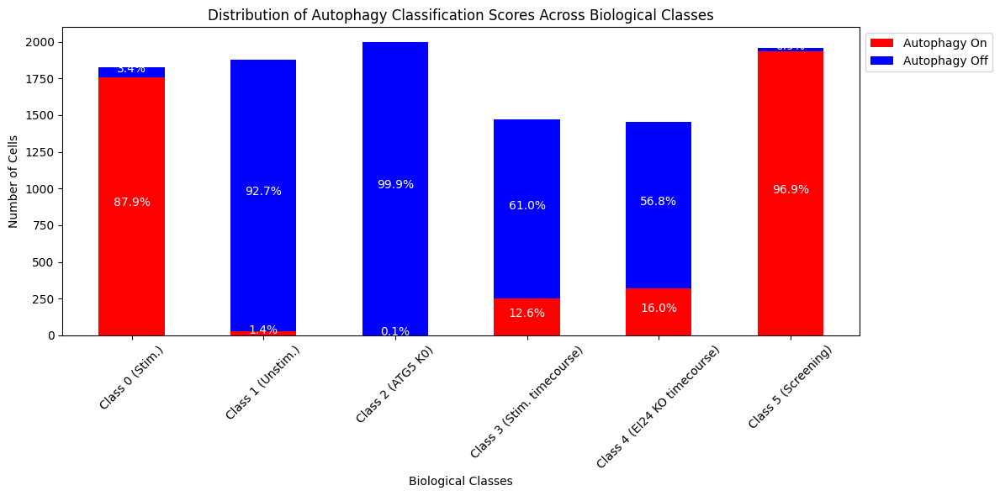

In [31]:
# Verify shape
assert classification_scores.shape[0] == reform_labels.shape[0], "Mismatch in number of samples between classification scores and labels"

# Initialize a dictionary to store counts for each biological class and autophagy label
counts = {bio_label: [0, 0] for bio_label in class_labels}
percentages = {bio_label: [0.0, 0.0] for bio_label in class_labels}

# Count the number of cells in each biological class with autophagy on or off
for i, bio_label in enumerate(class_labels):
    class_indices = (reform_labels == i).numpy()  # convert tensor to numpy for indexing
    total_count = np.sum(class_indices)
    autophagy_on_count = np.sum(classification_scores[class_indices, 0] > 0.98)  # Threshold for 'Autophagy on'
    autophagy_off_count = np.sum(classification_scores[class_indices, 1] > 0.98)  # Threshold for 'Autophagy off'
    counts[bio_label] = [autophagy_on_count, autophagy_off_count]
    if total_count > 0:
        percentages[bio_label] = [autophagy_on_count / total_count * 100, autophagy_off_count / total_count * 100]

# Extract counts for plotting
bio_classes = list(counts.keys())
autophagy_on_counts = [counts[bio_label][0] for bio_label in bio_classes]
autophagy_off_counts = [counts[bio_label][1] for bio_label in bio_classes]

plt.figure(figsize=(12, 6))
bar_width = 0.5
indices = np.arange(len(bio_classes))

plt.bar(indices, autophagy_on_counts, bar_width, label='Autophagy On', color='red')
plt.bar(indices, autophagy_off_counts, bar_width, bottom=autophagy_on_counts, label='Autophagy Off', color='blue')

# Add percentages to plot
for i, bio_label in enumerate(bio_classes):
    total = autophagy_on_counts[i] + autophagy_off_counts[i]
    if total > 0:
        plt.text(i, autophagy_on_counts[i] / 2, f'{percentages[bio_label][0]:.1f}%', ha='center', color='white')
        plt.text(i, autophagy_on_counts[i] + autophagy_off_counts[i] / 2, f'{percentages[bio_label][1]:.1f}%', ha='center', color='white')

plt.xlabel('Biological Classes')
plt.ylabel('Number of Cells')
plt.title('Distribution of Autophagy Classification Scores Across Biological Classes')
plt.xticks(indices, bio_classes, rotation=45)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

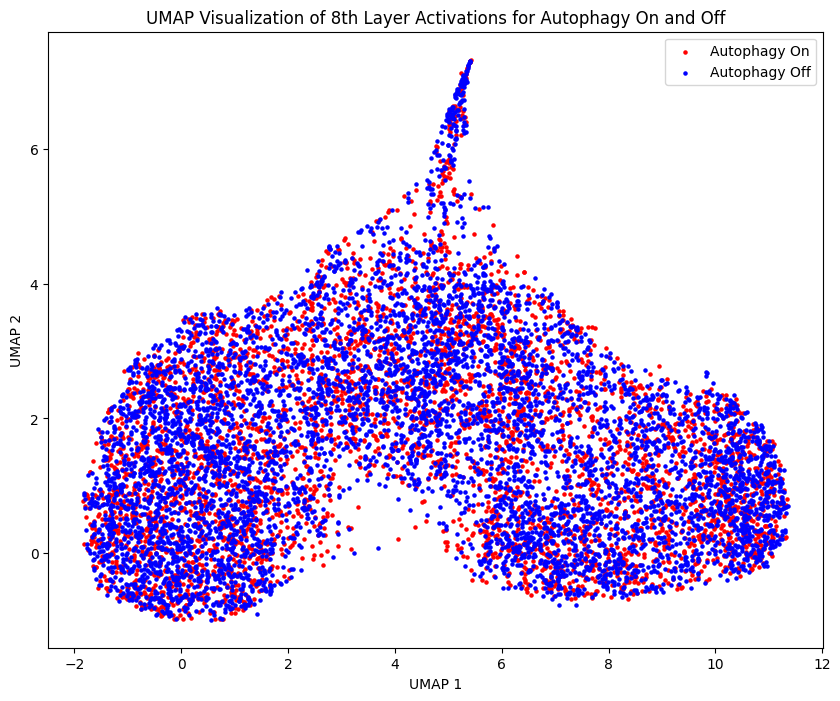

In [34]:
# Define thresholds 
autophagy_on_threshold = 0.98
autophagy_off_threshold = 0.98

# Determine indices for autophagy on and off
autophagy_on_indices = classification_scores[:, 0] > autophagy_on_threshold
autophagy_off_indices = classification_scores[:, 1] > autophagy_off_threshold

plt.figure(figsize=(10, 8))

# Autophagy On
plt.scatter(umap_result[autophagy_on_indices, 0], 
            umap_result[autophagy_on_indices, 1], 
            color='red', label='Autophagy On', s=5)

# Autophagy Off
plt.scatter(umap_result[autophagy_off_indices, 0], 
            umap_result[autophagy_off_indices, 1], 
            color='blue', label='Autophagy Off', s=5)

plt.title('UMAP Visualization of 8th Layer Activations for Autophagy On and Off')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.legend()
plt.show()

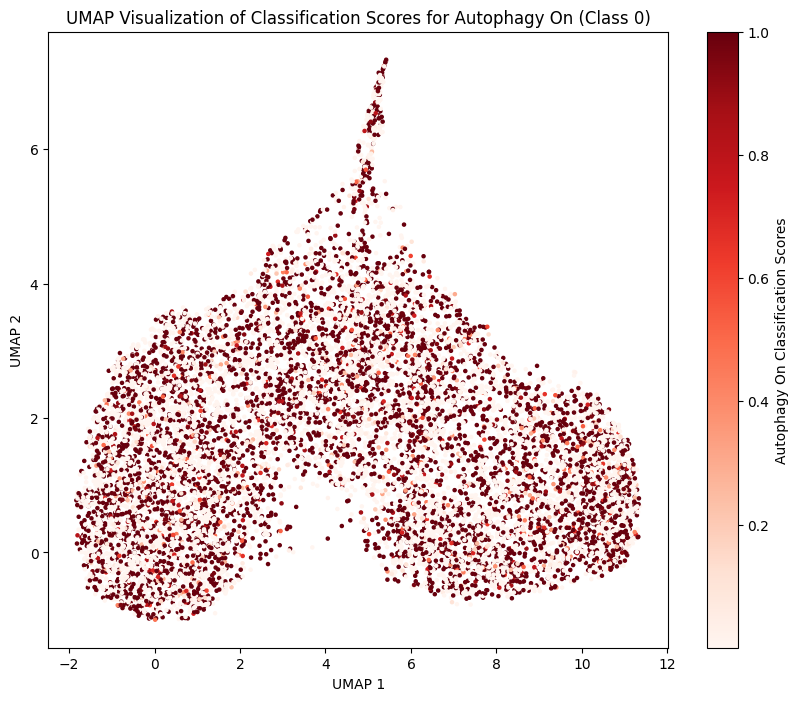

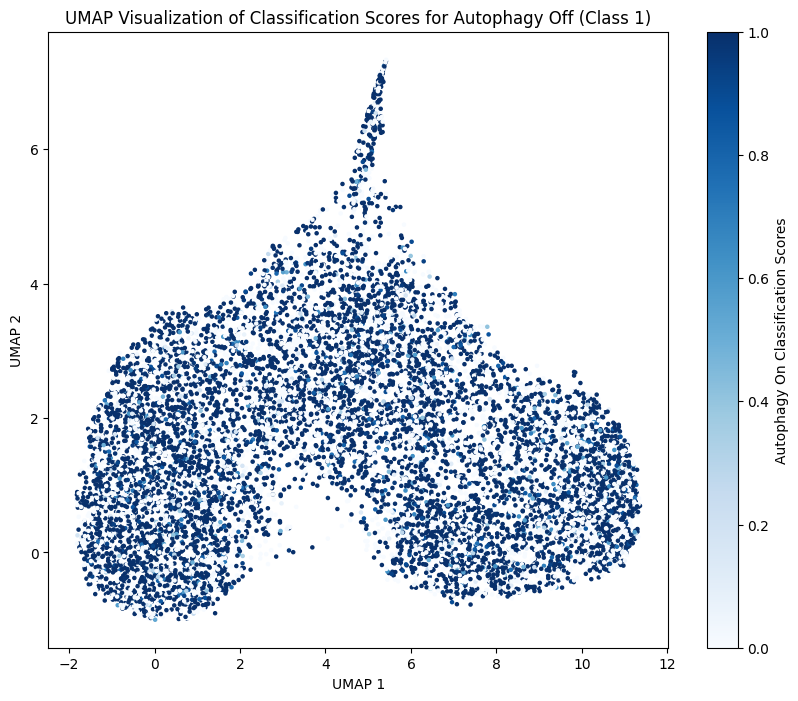

In [33]:
# Extract classification scores for autophagy on
autophagy_on_scores = classification_scores[:, 0]

# Plot UMAP with continuous colormap for autophagy on scores
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_result[:, 0], 
                      umap_result[:, 1], 
                      c=autophagy_on_scores, 
                      cmap='Reds', 
                      s=5)

cbar = plt.colorbar(scatter)
cbar.set_label('Autophagy On Classification Scores')

plt.title('UMAP Visualization of Classification Scores for Autophagy On (Class 0)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()


# Extract classification scores for autophagy off
autophagy_on_scores = classification_scores[:, 1]

# Plot UMAP with continuous colormap for autophagy on scores
plt.figure(figsize=(10, 8))
scatter = plt.scatter(umap_result[:, 0], 
                      umap_result[:, 1], 
                      c=autophagy_on_scores, 
                      cmap='Blues', 
                      s=5)

cbar = plt.colorbar(scatter)
cbar.set_label('Autophagy On Classification Scores')

plt.title('UMAP Visualization of Classification Scores for Autophagy Off (Class 1)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [37]:
# Extract classification scores for autophagy on and off 
autophagy_on_scores = classification_scores[:, 0]
autophagy_off_scores = classification_scores[:, 1]

# Create a DataFrame with cell ids, autophagy on, and autophagy off scores
df = pd.DataFrame({
    'Cell ID': cell_ids,
    'Autophagy On Score': autophagy_on_scores,
    'Autophagy Off Score': autophagy_off_scores
})

# Save the DataFrame to a .csv file
df.to_csv('autophagy21_classification_scores.csv', index=False)

In [38]:
df

,Cell ID,Autophagy On Score,Autophagy Off Score
0,745,9.651525e-04,0.999035
1,538647,2.845118e-08,1.000000
2,47264,9.999980e-01,0.000002
3,1137,1.247762e-04,0.999875
4,458,4.398844e-04,0.999560
...,...,...,...
11995,57,5.086402e-01,0.491360
11996,802,6.130011e-04,0.999387
11997,1269,4.275976e-01,0.572402
11998,449960,9.997860e-01,0.000214


In [40]:
# Define the cell IDs of overlap
target_cell_ids = [16372, 495085, 499830, 226165, 257405]

# Find the indices of these cell IDs in the cell_ids array
target_indices = np.isin(cell_ids, target_cell_ids)

# Extract the corresponding classification scores for autophagy on and off
target_autophagy_on_scores = classification_scores[target_indices, 0]
target_autophagy_off_scores = classification_scores[target_indices, 1]

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'Cell ID': np.array(cell_ids)[target_indices],  # Get the corresponding cell IDs
    'Autophagy On Score': target_autophagy_on_scores,
    'Autophagy Off Score': target_autophagy_off_scores
})

# Display the result
result_df

,Cell ID,Autophagy On Score,Autophagy Off Score
0,16372,0.000064,0.999936
1,499830,0.000079,0.999921
2,495085,0.995752,0.004248
3,257405,0.968347,0.031653
4,226165,0.000302,0.999698


### Inference with new (im)balanced_testset with 10000 screening class 5 instances and other bio. classes have 2000 instances

In [19]:
# Define the number of classes (must match what was used during training)
num_classes = 6

# Reinitialize the model architecture (same as during training)
model = MultiClassClassifier(num_classes)

# Specify the device (same as during training)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


# Load the balanced testset
test_data_loader = load_dataset("/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset_big.pt", batch_size)

seed = 1  

try:
    model.load_state_dict(torch.load(f'/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/ensemble_models/ensemble_multi_class_VGG2_case1_seed_{seed}.pth'))
    print(f"Model for seed {seed} successfully loaded.")
except Exception as e:
    print(f"Error loading model for seed {seed}: {str(e)}")

Loaded dataset from /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset_big.pt
Model for seed 1 successfully loaded.


In [7]:
original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

layer_name = 'features.24' # 8th layer activations name from model architecture

# define the return layers for IntermediateLayerGetter
return_layers = {layer_name: layer_name}

# Initialize the model with correct feature output
mid_getter = MidGetter(model, return_layers=return_layers, keep_output=True)

# Define the size of the subset!!! (not full dataset here due to kernal crahsing!)
subset_size = 12000 

# Create DataLoader
batch_size = 256

# Randomly sample a subset of the dataset
subset_indices = torch.randperm(len(original_dataset))[:subset_size]
torch.save(subset_indices, 'single_model_seed_1_Case_1_subset_indices_new_big_testset.pth')
subset_indices = torch.load('single_model_seed_1_Case_1_subset_indices_new_big_testset.pth')

# Create a new subset sampler with the loaded indices
subset_sampler = SubsetRandomSampler(subset_indices)

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Lists to store activations and labels
activations = []
labels = []
cell_ids_list = []

# Forward pass of subset through the model to get activations
with torch.no_grad():
    for data, label, cell_ids in tqdm(subset_data_loader, desc="Processing data", leave=False):
        data = data.to(device) 
        mid_outputs, _ = mid_getter(data)
        # Get the activations
        activations.append(mid_outputs[layer_name].cpu().detach().numpy())
        labels.append(label.numpy())
        cell_ids_list.append(cell_ids.numpy())

# Concatenate activations and labels from all batches
activations = np.concatenate(activations, axis=0)
labels = np.concatenate(labels, axis=0)
cell_ids_array = np.concatenate(cell_ids_list, axis=0)

Processing data:   0%|          | 0/47 [00:00<?, ?it/s]

In [8]:
#save activations and labels to files
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_activations_layer_8_new_big_testset.npy', activations)
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_labels_layer_8_new_big_testset.npy', labels)
np.save('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_cell_ids_layer_8_new_big_testset.npy', cell_ids_array)

In [20]:
# Load activations, labels, and cell IDs
activations = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_activations_layer_8_new_big_testset.npy')
labels = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_labels_layer_8_new_big_testset.npy')
cell_ids_array = np.load('/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/autophagy_models/single_model_seed_1_Case_1_junk_cell_ids_layer_8_new_big_testset.npy')

# Verif
print("Activations shape:", activations.shape)
print("Labels shape:", labels.shape)
print("Cell IDs shape:", cell_ids_array.shape)

Activations shape: (12000, 512, 8, 8)
Labels shape: (12000,)
Cell IDs shape: (12000,)


In [21]:
# Reshape activations to 2 dims
activations_flat = activations.reshape(activations.shape[0], -1)
activations_flat

array([[3.48597437e-01, 0.00000000e+00, 4.83738855e-02, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.53584945e-01, 0.00000000e+00, 3.38413417e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.64783913e-01, 1.18858196e-01, 6.80259287e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [2.62011319e-01, 0.00000000e+00, 4.74807457e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.24285895e-01, 4.50531952e-03, 2.29087904e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.14751601e+00, 7.77394354e-01, 5.95759571e-01, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]], dtype=float32)

In [22]:
%matplotlib inline

# Calc. UMAP
umap_reducer = umap.UMAP(n_components=2)
umap_result = umap_reducer.fit_transform(activations_flat)

# Define new class labels 
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", "Class 3 (Stim. timecourse)", "Class 4 (EI24 KO timecourse)", "Class 5 (Screening)"]

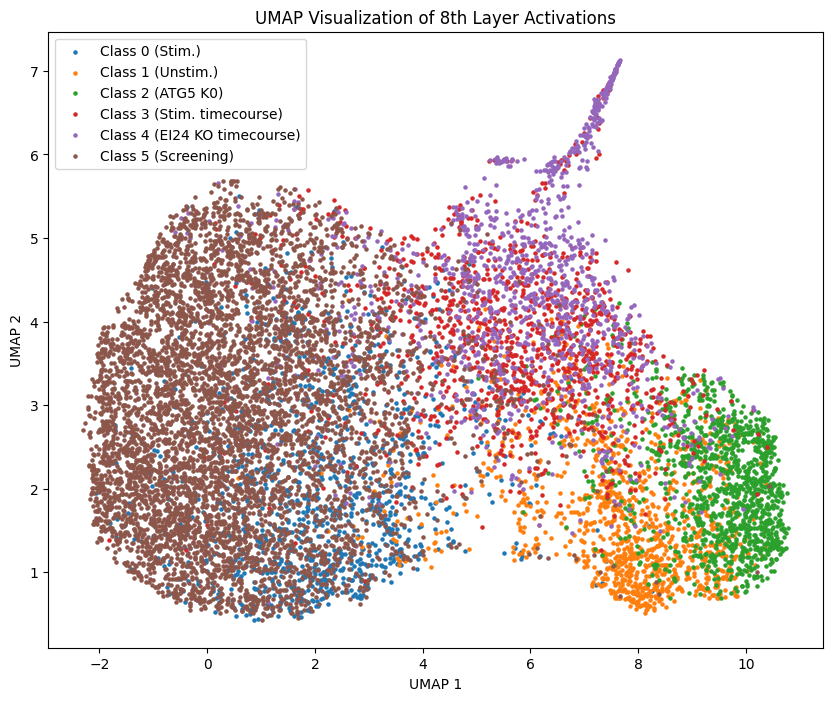

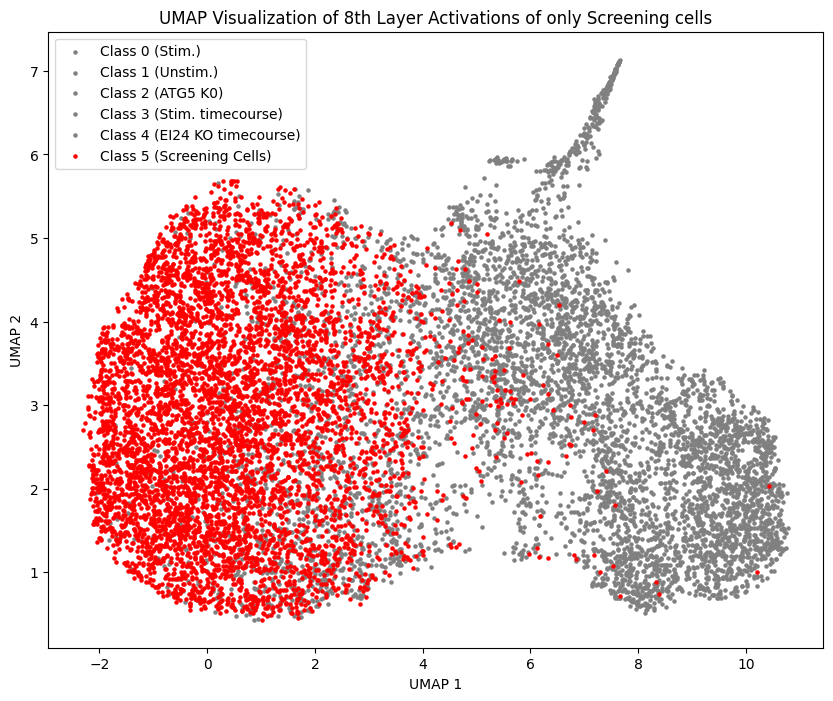

In [23]:
#Plotting UMAP using scatterplot instead of via scanpy
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)
plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()
plt.figure(figsize=(10, 8))

# Plot cells belonging to other classes in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude the last class (screening)
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', label=label, s=5)
    
    
# Plot cells belonging to class 5 (screening) with red color
screening_idx = labels == 5
plt.scatter(umap_result[screening_idx, 0], umap_result[screening_idx, 1], color='red', label='Class 5 (Screening Cells)', s=5)

plt.legend()
plt.title('UMAP Visualization of 8th Layer Activations of only Screening cells')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

# Determine the class index from the classification scores index
class_index = 0 
class_label = class_labels[class_index]
title = f'UMAP of 8th Layer Activations by Classification Scores for {class_label}'

In [24]:
import os

# Ensure UMAP x-coordinates are in NumPy format
x_coords = np.asarray(umap_result[:, 0])
y_coords = np.asarray(umap_result[:, 1])
labels = np.asarray(labels)

# Ensure `cell_ids_array` is a NumPy array (convert if necessary)
cell_ids_array = np.array(cell_ids_array) if isinstance(cell_ids_array, np.ndarray) else np.array(list(map(str, cell_ids_array)))

# Identify screening cells (Class 5)
screening_idx = labels == 5

# Apply the threshold: Keep only Class 5 cells where x >= 3
filtered_idx = screening_idx & (x_coords >= 5)

# Extract the filtered cell IDs
filtered_cell_ids = cell_ids_array[filtered_idx]

# Define save path
save_path = "./de_novo_output_files/de_novo_outside_block_screening_hits_big.txt"

# Ensure the directory exists
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save to file
np.savetxt(save_path, filtered_cell_ids, fmt="%s")  # Use %s if cell IDs are not integers

print(f" Saved {len(filtered_cell_ids)} cell IDs to {save_path}")

 Saved 80 cell IDs to ./de_novo_output_files/de_novo_outside_block_screening_hits_big.txt


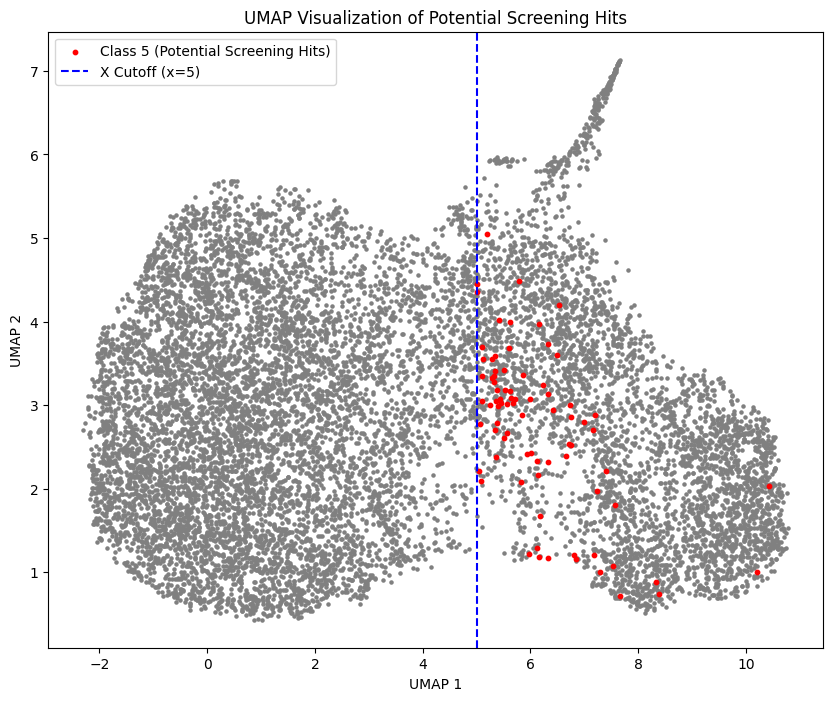

In [30]:
plt.figure(figsize=(10, 8))

# Plot all other classes (0-4) in grey
for i, label in enumerate(class_labels[:-1]):  # Exclude class 5
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], color='grey', s=5)

# Plot non-filtered screening cells (class 5 that are NOT in filtered_idx) in grey
screening_idx = labels == 5
non_filtered_idx = screening_idx & ~filtered_idx  # inverse of filtered_idx for screening cells
plt.scatter(umap_result[non_filtered_idx, 0], umap_result[non_filtered_idx, 1], color='grey', s=5)

# Overlay filtered Class 5 cells (those outside the block) in red
plt.scatter(x_coords[filtered_idx], y_coords[filtered_idx], color='red', label='Class 5 (Potential Screening Hits)', s=10)

# Vertical threshold line
plt.axvline(x=5, color='blue', linestyle='--', label='X Cutoff (x=5)')

plt.legend()
plt.title('UMAP Visualization of Potential Screening Hits')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

In [11]:
# k (nearest neighbors) and n (number of outliers)
k = 10  
n = 87  

x_coords = np.asarray(umap_result[:, 0])
y_coords = np.asarray(umap_result[:, 1])
labels = np.asarray(labels)
cell_ids_array = np.asarray(cell_ids_array, dtype=str) 

# Identify screening cells (Class 5)
screening_idx = labels == 5
screening_coords = np.column_stack((x_coords[screening_idx], y_coords[screening_idx]))

#Find the dense cluster of screening cells (non-hit control)
nbrs = NearestNeighbors(n_neighbors=k).fit(screening_coords)
distances, _ = nbrs.kneighbors(screening_coords)

#Compute the mean distance to k nearest neighbors for each cell
avg_knn_dist = distances.mean(axis=1)

# Identify the top n outliers with biggest knn distances
outlier_indices = np.argsort(avg_knn_dist)[-n:]

# Get cellIDs of outliers
outlier_cell_ids = cell_ids_array[screening_idx][outlier_indices]

In [12]:
# Save to file
save_path = "./de_novo_output_files/knn_screening_hits_10k.txt"
os.makedirs(os.path.dirname(save_path), exist_ok=True)
np.savetxt(save_path, outlier_cell_ids, fmt="%s")
print(f"Saved {len(outlier_cell_ids)} potential screening hits to {save_path}")

Saved 87 potential screening hits to ./de_novo_output_files/knn_screening_hits_10k.txt


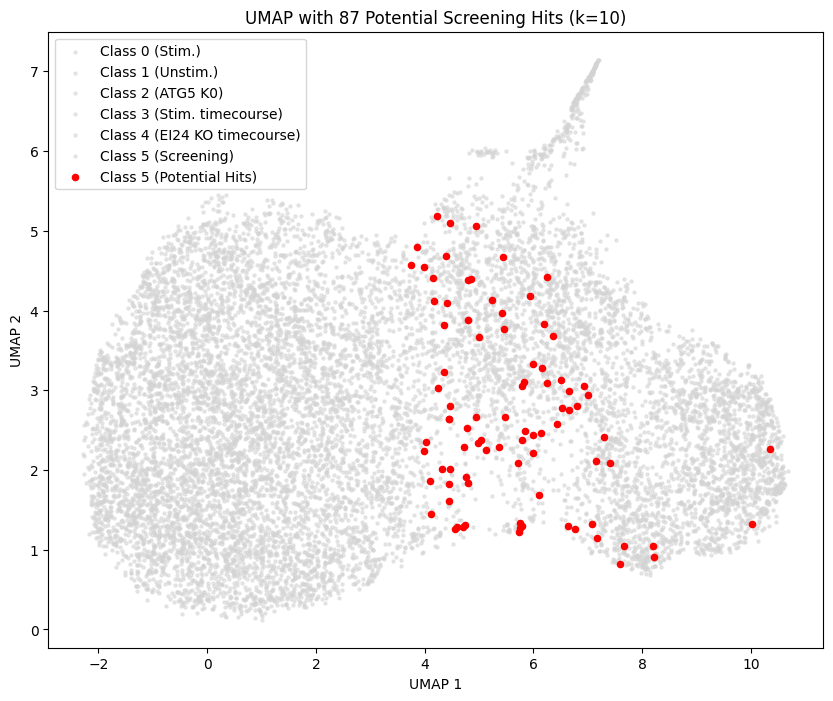

In [13]:
#UMAP this
plt.figure(figsize=(10, 8))

for i, label in enumerate(class_labels):  
    idx = labels == i
    plt.scatter(x_coords[idx], y_coords[idx], color='lightgrey', label=label, s=5, alpha=0.5)

plt.scatter(screening_coords[outlier_indices, 0], screening_coords[outlier_indices, 1], 
            color='red', label="Class 5 (Potential Hits)", s=20, edgecolors='red')

plt.legend()
plt.title(f'UMAP with {n} Potential Screening Hits (k={k})')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

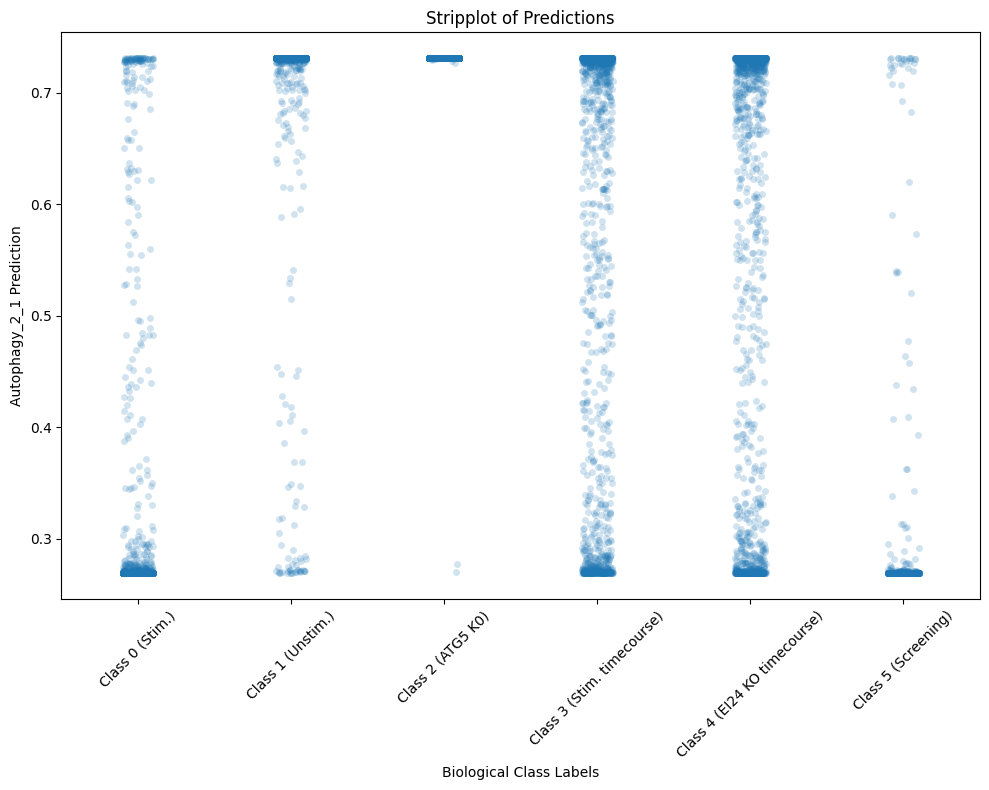

In [38]:
import numpy as np
import torch
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data from saved files
classification_scores = np.load('classification_scores.npy')
out_labels = torch.load('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new.pth')
cell_ids = np.load('cell_ids.npy')

# Reform the labels and results
reform_labels = torch.hstack(out_labels)
reform_res = torch.tensor(classification_scores).softmax(dim=1)[:, 1]

# Create the custom label list for the x-axis
bio_class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", 
                    "Class 3 (Stim. timecourse)", "Class 4 (EI24 KO timecourse)", 
                    "Class 5 (Screening)"]

# Strip plot
plt.figure(figsize=(10, 8))
sns.stripplot(x=reform_labels.numpy(), y=reform_res.numpy(), alpha=0.2)

# Set custom labels for the x-axis
plt.xticks(ticks=np.arange(6), labels=bio_class_labels, rotation=45)

# Set axis labels
plt.xlabel('Biological Class Labels')
plt.ylabel('Autophagy_2_1 Prediction')
plt.title('Stripplot of Predictions')

# Display the plot
plt.tight_layout()
plt.show()

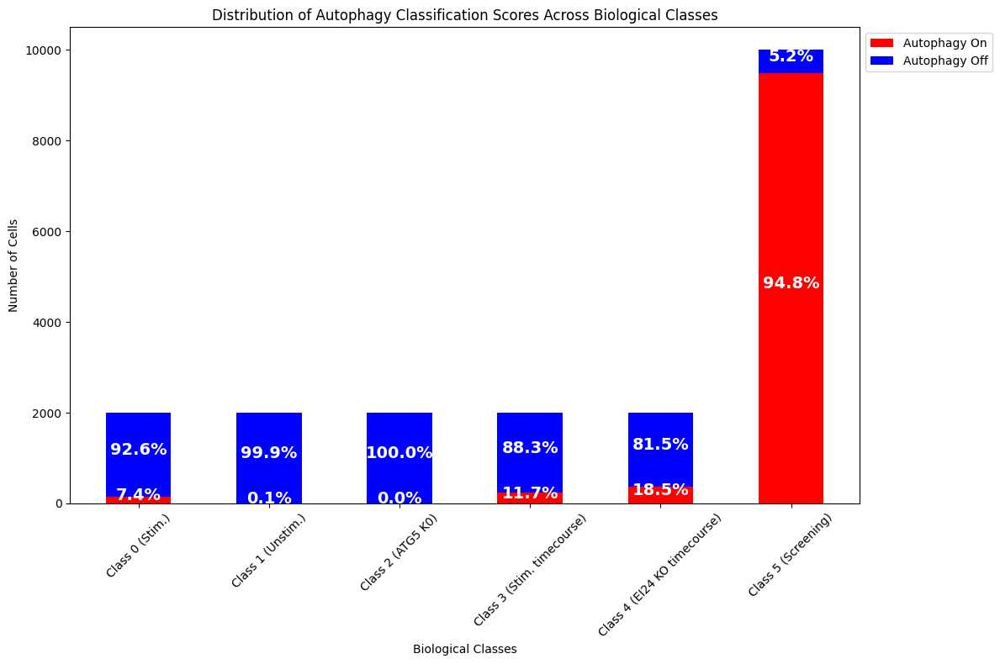

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Set the new percentages for "Autophagy On"
autophagy_on_percentages = {
    "Class 0 (Stim.)": 7.4,
    "Class 1 (Unstim.)": 0.1,
    "Class 2 (ATG5 K0)": 0.0,
    "Class 3 (Stim. timecourse)": 11.7,
    "Class 4 (EI24 KO timecourse)": 18.5,
    "Class 5 (Screening)": 94.8  # Screening class with 10k cells
}

# Set the number of cells for each class
total_cells = {
    "Class 0 (Stim.)": 2000,
    "Class 1 (Unstim.)": 2000,
    "Class 2 (ATG5 K0)": 2000,
    "Class 3 (Stim. timecourse)": 2000,
    "Class 4 (EI24 KO timecourse)": 2000,
    "Class 5 (Screening)": 10000  # Screening class with 10k cells
}

# Calculate the number of cells for "Autophagy On" and "Autophagy Off" based on percentages
autophagy_on_counts = {bio_label: int(total_cells[bio_label] * (percentage / 100)) 
                       for bio_label, percentage in autophagy_on_percentages.items()}
autophagy_off_counts = {bio_label: total_cells[bio_label] - autophagy_on_counts[bio_label] 
                       for bio_label in autophagy_on_counts}

# Extract counts for plotting
bio_classes = list(autophagy_on_counts.keys())
autophagy_on_values = [autophagy_on_counts[bio_label] for bio_label in bio_classes]
autophagy_off_values = [autophagy_off_counts[bio_label] for bio_label in bio_classes]

# Plot the stacked bar chart
plt.figure(figsize=(12, 8))
bar_width = 0.5
indices = np.arange(len(bio_classes))

# Create the stacked bars
plt.bar(indices, autophagy_on_values, bar_width, label='Autophagy On', color='red')
plt.bar(indices, autophagy_off_values, bar_width, bottom=autophagy_on_values, label='Autophagy Off', color='blue')

# Add percentages to plot with larger and bolder text
for i, bio_label in enumerate(bio_classes):
    total = autophagy_on_values[i] + autophagy_off_values[i]
    if total > 0:
        # Increase font size and make it bold for better visibility
        plt.text(i, autophagy_on_values[i] / 2, f'{autophagy_on_percentages[bio_label]:.1f}%', 
                 ha='center', color='white', fontsize=14, fontweight='bold')
        plt.text(i, autophagy_on_values[i] + autophagy_off_values[i] / 2, 
                 f'{(100 - autophagy_on_percentages[bio_label]):.1f}%', 
                 ha='center', color='white', fontsize=14, fontweight='bold')

# Customize the plot
plt.xlabel('Biological Classes')
plt.ylabel('Number of Cells')
plt.title('Distribution of Autophagy Classification Scores Across Biological Classes')
plt.xticks(indices, bio_classes, rotation=45)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show the plot
plt.show()

In [32]:
import numpy as np
import pandas as pd
import umap
import umap.umap_ as umap  # Correct way
import matplotlib.pyplot as plt

# Define binning function based on autophagy_off score
def assign_bin(score):
    if score > 0.99999:
        return "bin 1"
    elif score > 0.999:
        return "bin 2"
    elif score > 0.9975:
        return "bin 3"
    elif score > 0.995:
        return "bin 4"
    elif score > 0.99:
        return "bin 5"
    elif score > 0.98:
        return "bin 6"
    else:
        return "other"

    
# Step 2: Apply binning function to create a new column
df = pd.read_csv("autophagy21_classification_scores_big_testset.csv")
df

cell_ids_to_find = ["471341", "122133", "388580", "196470", "444025", "279984", 
               "337264", "502672", "396801", "388225", "445937", "438714", 
               "504110", "137700", "465136", "387425", "496681", "95544", 
               "445021", "366589", "280452", "412462", "421516", "441130", 
               "78880", "238589", "394210", "497101", "49425", "323443", 
               "362618", "240471", "443765", "323137", "493513", "199625", 
               "56408", "446082", "304850", "125074", "451082", "127065", 
               "372600", "494469", "497255", "472298", "179666", "232312", 
               "380477", "379875", "474071", "58222", "435097", "439502", 
               "410213", "189818", "439363", "442577", "501087", "51896", 
               "84877", "418925", "141546", "198304", "271984", "390902", 
               "61719", "322883", "452271", "260275", "445456", "403923", 
               "385373", "445370", "70623", "443025", "64637", "501015", 
               "387731", "442018", "378248", "443599", "500126", "441400", 
               "377358", "418815", "48986"]


# Apply binning function to the dataframe
df["Bin"] = df["Autophagy Off Score"].apply(assign_bin)
df["Cell ID"] = df["Cell ID"].astype(str)
df

,Cell ID,Autophagy On Score,Autophagy Off Score,Bin
0,439,6.700127e-02,9.329987e-01,other
1,293873,5.018042e-07,9.999995e-01,bin 1
2,1437,7.523392e-01,2.476609e-01,other
3,437630,1.878466e-06,9.999981e-01,bin 1
4,80815,9.999956e-01,4.432396e-06,other
...,...,...,...,...
11995,469873,9.998048e-01,1.952647e-04,other
11996,316062,3.255916e-05,9.999675e-01,bin 2
11997,179090,9.619690e-01,3.803107e-02,other
11998,247275,2.832826e-06,9.999971e-01,bin 1


In [33]:
# Merge bin information into filtered_df
filtered_df = df[df["Cell ID"].isin(cell_ids_to_find)]
filtered_df

,Cell ID,Autophagy On Score,Autophagy Off Score,Bin
53,504110,0.984518,0.015482,other
54,442577,0.705635,0.294365,other
253,141546,0.996307,0.003693,other
701,443765,0.126061,0.873939,other
707,279984,0.071340,0.928660,other
...,...,...,...,...
11339,418925,0.000138,0.999862,bin 2
11391,385373,0.000464,0.999536,bin 2
11538,439502,0.997512,0.002488,other
11726,323137,0.286216,0.713784,other


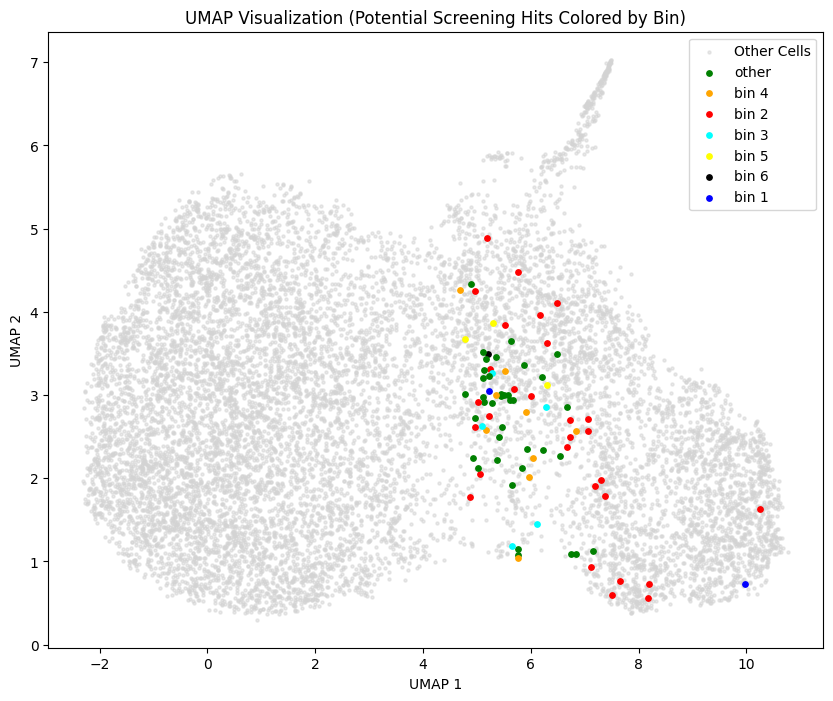

In [36]:
# Extract indices of highlighted screening cells
cell_ids_array = cell_ids_array.astype(str)  # Convert all cell IDs to string
highlighted_indices = np.isin(cell_ids_array, filtered_df["Cell ID"].values)  # Boolean mask

# Extract UMAP coordinates of these highlighted cells
highlighted_x = umap_result[highlighted_indices, 0]
highlighted_y = umap_result[highlighted_indices, 1]

# Merge UMAP results with bin information
highlighted_bins = filtered_df.set_index("Cell ID").loc[cell_ids_array[highlighted_indices], "Bin"].values

# Define colors for bins
bin_colors = {
    "bin 1": "blue",
    "bin 2": "red",
    "bin 3": "cyan",
    "bin 4": "orange",
    "bin 5": "yellow",
    "bin 6": "black", 
    "other": "green"
}

# Plot UMAP
plt.figure(figsize=(10, 8))

# Plot all cells in light grey
plt.scatter(umap_result[:, 0], umap_result[:, 1], color='lightgrey', s=5, alpha=0.5, label="Other Cells")

# Overlay highlighted screening cells in their bin colors
for i, bin_label in enumerate(highlighted_bins):
    plt.scatter(highlighted_x[i], highlighted_y[i], color=bin_colors[bin_label], s=15, label=bin_label if bin_label not in plt.gca().get_legend_handles_labels()[1] else "")

plt.legend()
plt.title('UMAP Visualization (Potential Screening Hits Colored by Bin)')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.grid(False)
plt.show()

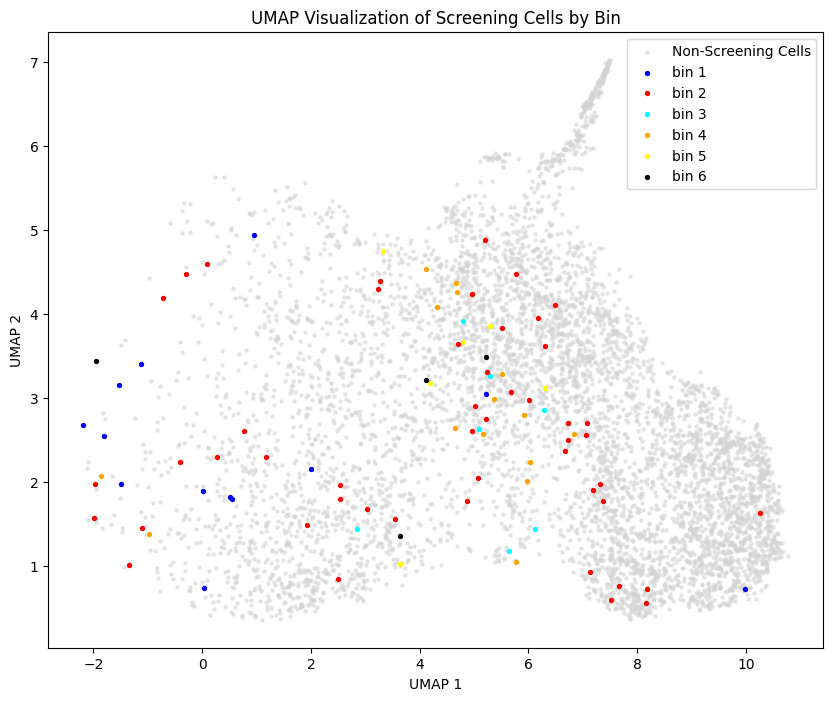

In [40]:
import os
import pickle
import numpy as np
import pandas as pd
import umap
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns

# Create a mapping from Cell ID to bin values
cell_id_to_bin = dict(zip(df["Cell ID"], df["Bin"]))

# Identify screening cells
screening_idx = labels == 5
screening_cell_ids = [str(cell_id) for cell_id in cell_ids_array[screening_idx]]

# Extract bin values for screening cells
screening_bins = [cell_id_to_bin.get(cid, "Unknown") for cid in screening_cell_ids]

# Define a color palette for bins
bin_palette = {
    "bin 1": "blue",
    "bin 2": "red",
    "bin 3": "cyan",
    "bin 4": "orange",
    "bin 5": "yellow",
    "bin 6": "black"
}

# Plot UMAP
plt.figure(figsize=(10, 8))

# Plot non-screening cells in grey
non_screening_idx = ~screening_idx
plt.scatter(umap_result[non_screening_idx, 0], umap_result[non_screening_idx, 1],
            color='lightgrey', alpha=0.5, s=5, label="Non-Screening Cells")

# Plot screening cells with bin colors
for bin_label, color in bin_palette.items():
    bin_indices = [i for i, b in enumerate(screening_bins) if b == bin_label]
    if bin_indices:
        plt.scatter(umap_result[screening_idx][bin_indices, 0], 
                    umap_result[screening_idx][bin_indices, 1],
                    color=color, s=8, label=bin_label)

plt.legend()
plt.title("UMAP Visualization of Screening Cells by Bin")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(False)

# Save the plot
output_path = "./de_novo_output_files/de_novo_umap_plot_screening_cells_by_bin.png"
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [17]:
# Training data is MPCDF screening data with bin information and the dir labels are the bins!
MPCDF_screening_testdata = HDF5SingleCellDataset(
    dir_list=['/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/bin_1/single_cells_subsetted.h5',
              '/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/bin_2/single_cells_subsetted.h5',
              '/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/bin_3/single_cells_subsetted.h5',
              '/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/bin_4/single_cells_subsetted.h5',
              '/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/bin_5/single_cells_subsetted.h5',
              '/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/bin_6/single_cells_subsetted.h5'
    ],
    dir_labels=[1, 2, 3, 4, 5, 6],  # Bin labels
    root_dir='/dss/dsshome1/0F/di93quv/MPCDF_data/Screen_2.3/',
    select_channel=4,  # Select the 5th channel
    return_id=True
)

Total: 60000
1: 10000
2: 10000
3: 10000
4: 10000
5: 10000
6: 10000


In [18]:
test_loader = DataLoader(MPCDF_screening_testdata, batch_size=64, shuffle=True, num_workers=8)

In [19]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

In [20]:
original_dataset = test_loader.dataset  # Access the underlying dataset from the DataLoader

layer_name = 'features.24' # 8th layer activations name from model architecture

# define the return layers for IntermediateLayerGetter
return_layers = {layer_name: layer_name}

# Initialize the model with correct feature output
mid_getter = MidGetter(model, return_layers=return_layers, keep_output=True)

# Define the size of the subset!!! (not full dataset here due to kernal crahsing!)
subset_size = 12000 

# Create DataLoader
batch_size = 256

# Randomly sample a subset of the dataset
subset_indices = torch.randperm(len(original_dataset))[:subset_size]
torch.save(subset_indices, './de_novo_output_files/MPCDF_testset.pth')
subset_indices = torch.load('./de_novo_output_files/MPCDF_testset.pth')

# Create a new subset sampler with the loaded indices
subset_sampler = SubsetRandomSampler(subset_indices)

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Lists to store activations and labels
activations = []
labels = []
cell_ids_list = []

# Forward pass of subset through the model to get activations
with torch.no_grad():
    for data, label, cell_ids in tqdm(subset_data_loader, desc="Processing data", leave=False):
        data = data.to(device) 
        mid_outputs, _ = mid_getter(data)
        # Get the activations
        activations.append(mid_outputs[layer_name].cpu().detach().numpy())
        labels.append(label.numpy())
        cell_ids_list.append(cell_ids.numpy())

# Concatenate activations and labels from all batches
activations = np.concatenate(activations, axis=0)
labels = np.concatenate(labels, axis=0)
cell_ids_array = np.concatenate(cell_ids_list, axis=0)

Processing data:   0%|          | 0/47 [00:00<?, ?it/s]

In [15]:
#save activations and labels to files
np.save('./de_novo_output_files/de_novo_activations_MPCDF_testset.npy', activations)
np.save('./de_novo_output_files/de_novo_labels_MPCDF_testset.npy', labels)
np.save('./de_novo_output_files/de_novo_cellids_MPCDF_testset.npy', cell_ids_array)

In [21]:
# Reshape activations to 2 dims
activations_flat = activations.reshape(activations.shape[0], -1)
activations_flat

array([[1.1695881 , 0.5180378 , 0.511362  , ..., 1.5112493 , 0.48087478,
        0.        ],
       [0.46403542, 0.19086346, 0.7493036 , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.3614322 , 0.        , 0.36946458, ..., 0.        , 0.        ,
        0.        ],
       [0.3559751 , 0.        , 0.37185016, ..., 0.        , 0.        ,
        0.        ],
       [0.35746068, 0.        , 0.18060449, ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [22]:
%matplotlib inline

# Calc. UMAP
umap_reducer = umap.UMAP(n_components=2)
umap_result = umap_reducer.fit_transform(activations_flat)

# Define new class labels 
class_labels = ["Bin 1", "Bin 2", "Bin 3", "Bin 4", "Bin 5", "Bin 6"]

In [33]:
# If you subtracted 1 before by mistake, add it back
labels = labels + 2  # since you're at -2 to 3, this will shift to 0 to 5
print("Corrected labels:", np.unique(labels))

Corrected labels: [0 1 2 3 4 5]


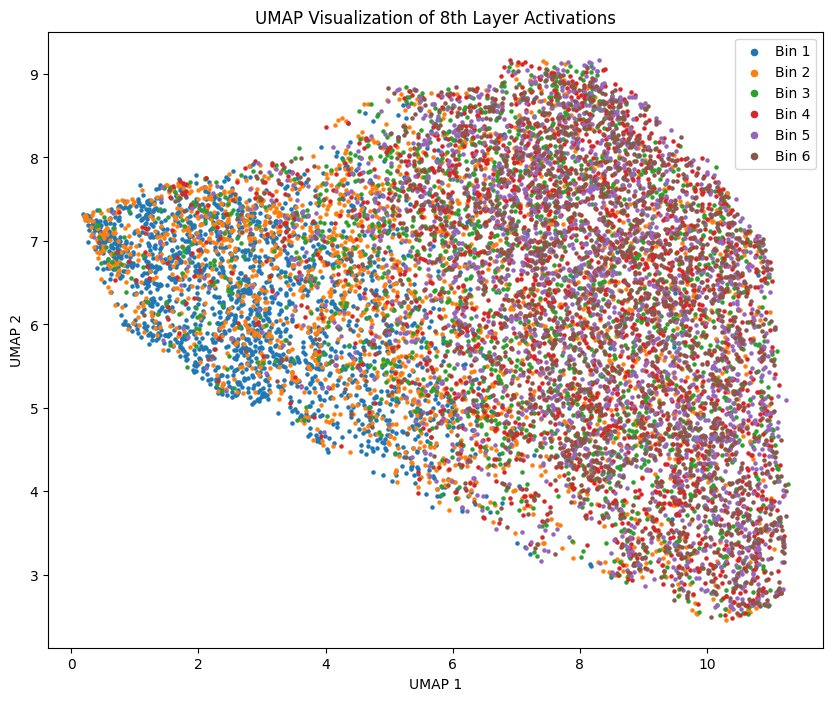

In [34]:
plt.figure(figsize=(10, 8))
for i, label in enumerate(class_labels):
    idx = labels == i
    plt.scatter(umap_result[idx, 0], umap_result[idx, 1], label=label, s=5)

# Adjust legend marker size using markerscale
plt.legend(markerscale=2, handletextpad=0.5) 
plt.title('UMAP Visualization of 8th Layer Activations')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.show()

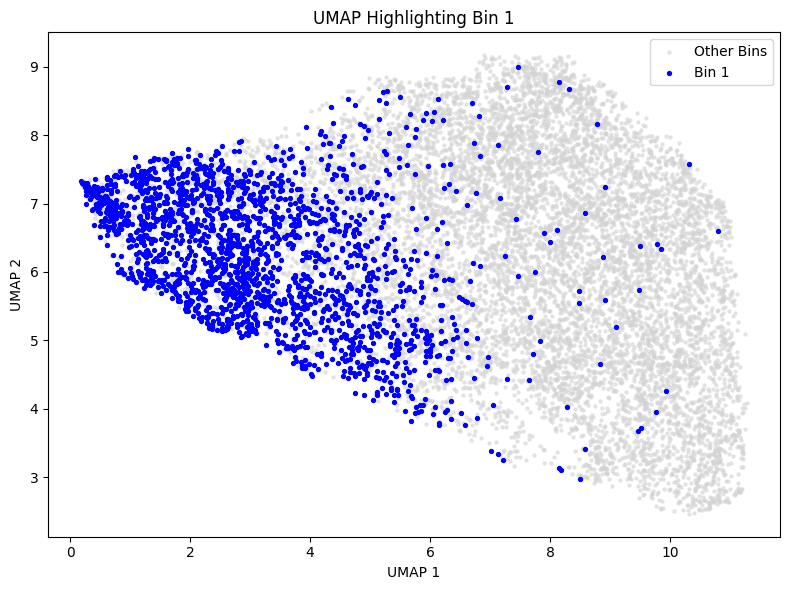

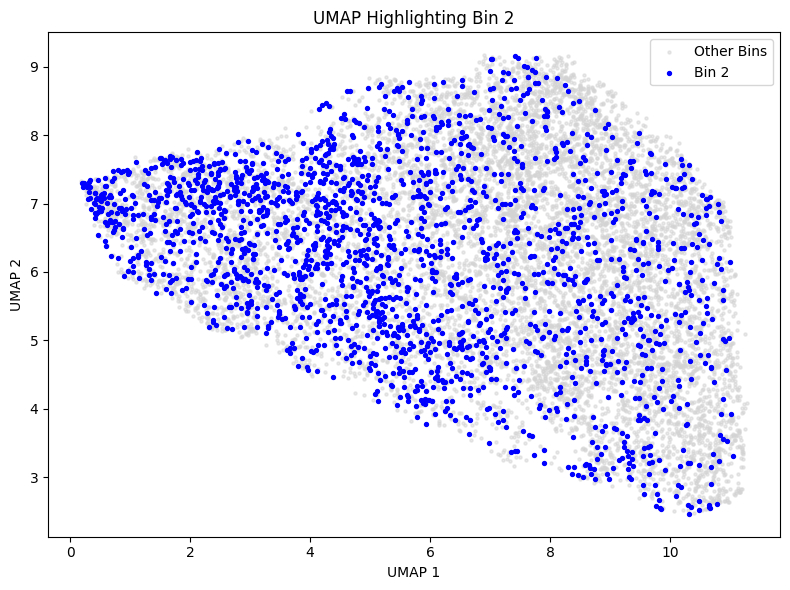

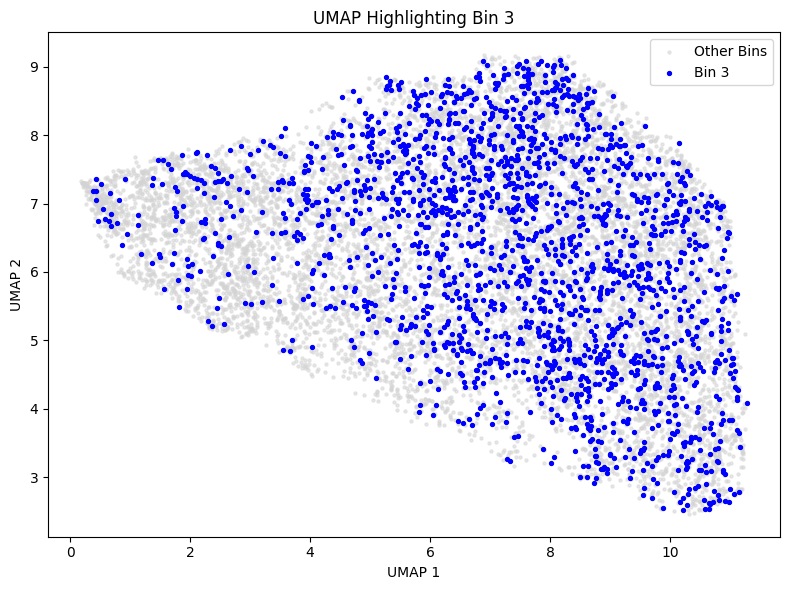

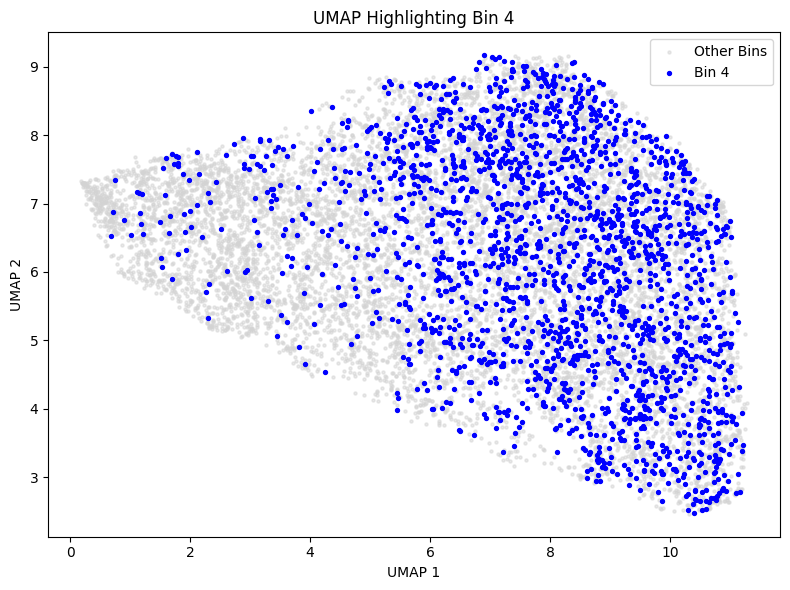

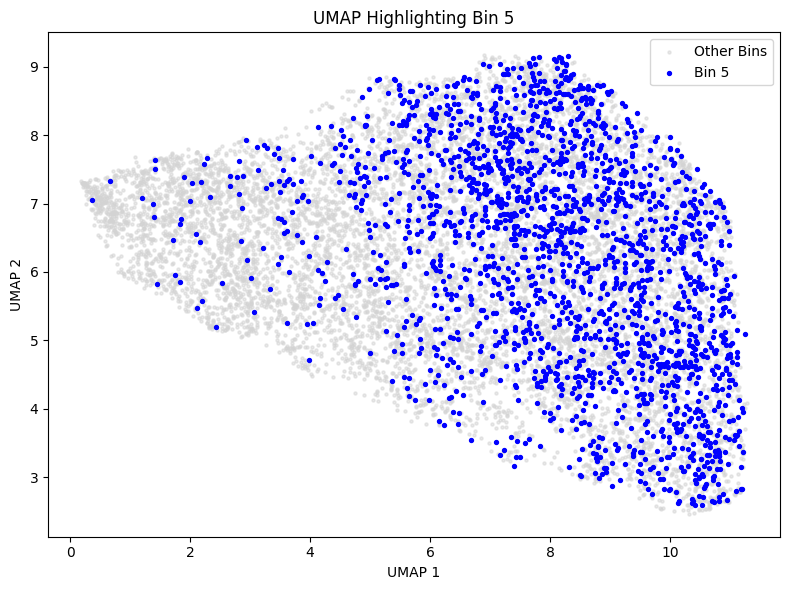

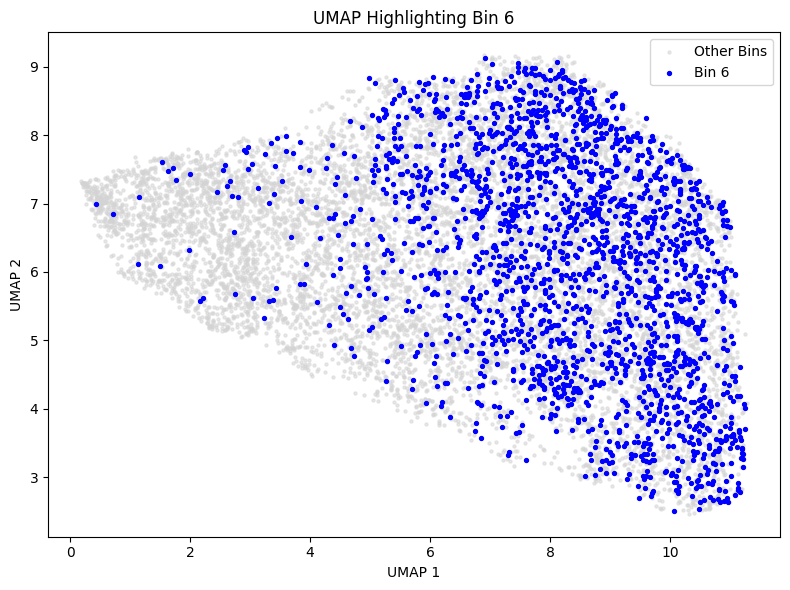

In [38]:
# Define class labels
class_labels = ["Bin 1", "Bin 2", "Bin 3", "Bin 4", "Bin 5", "Bin 6"]
num_classes = len(class_labels)

# Plot each bin individually
for i in range(num_classes):
    plt.figure(figsize=(8, 6))
    
    # Create mask for current bin
    highlight_mask = labels == i
    
    # Plot non-highlighted points in gray
    plt.scatter(umap_result[~highlight_mask, 0], umap_result[~highlight_mask, 1],
                color='lightgray', s=5, label='Other Bins', alpha=0.5)

    # Plot highlighted bin in blue
    plt.scatter(umap_result[highlight_mask, 0], umap_result[highlight_mask, 1],
                color='blue', s=8, label=class_labels[i])

    plt.title(f"UMAP Highlighting {class_labels[i]}")
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [31]:
print("Total points plotted:", len(umap_result))

Total points plotted: 12000


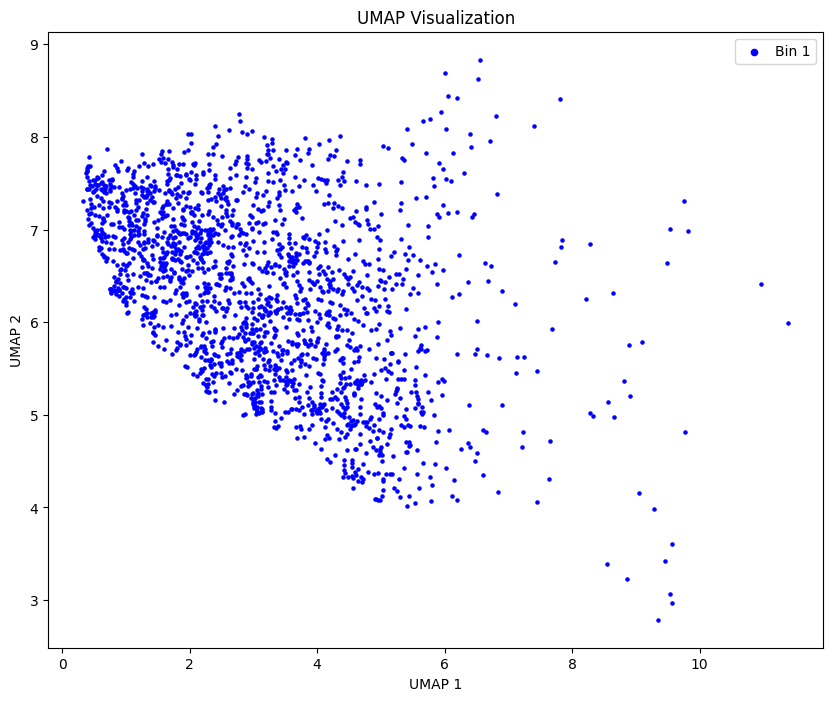

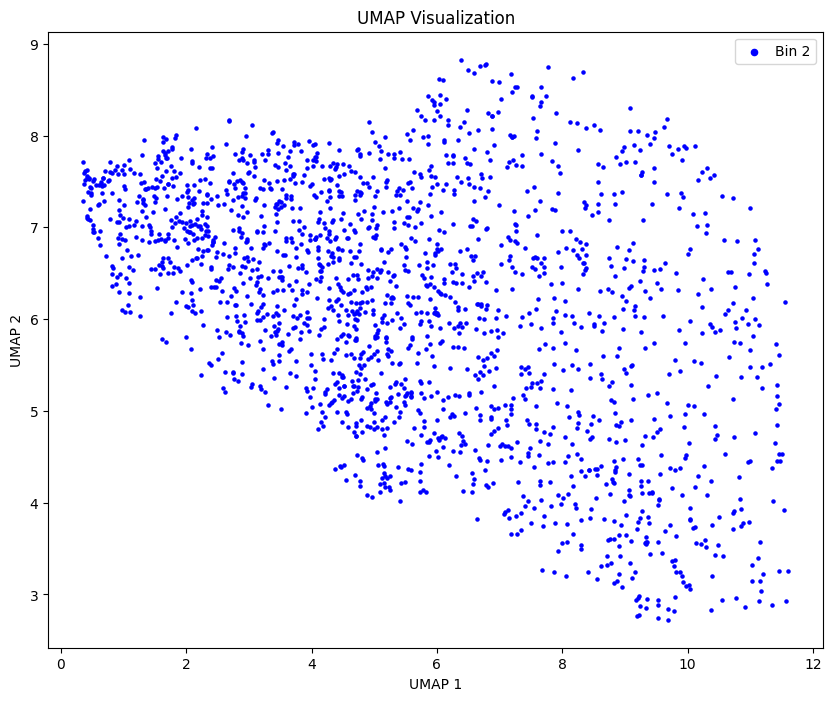

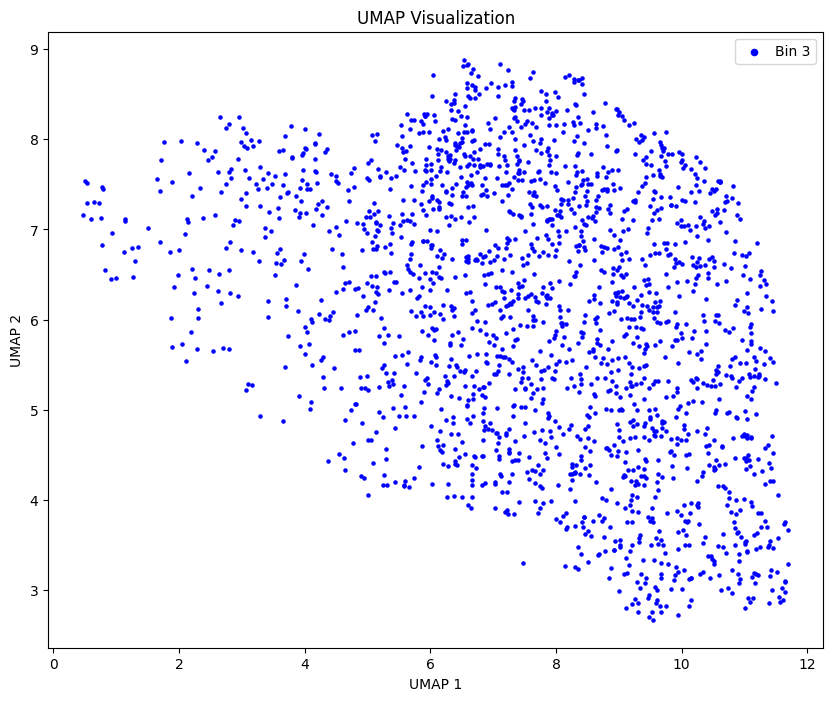

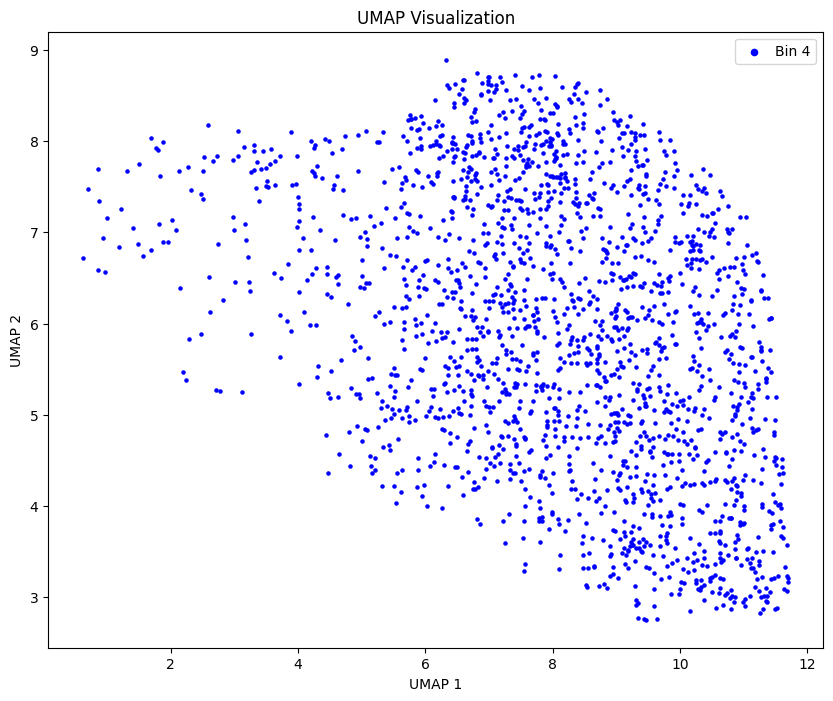

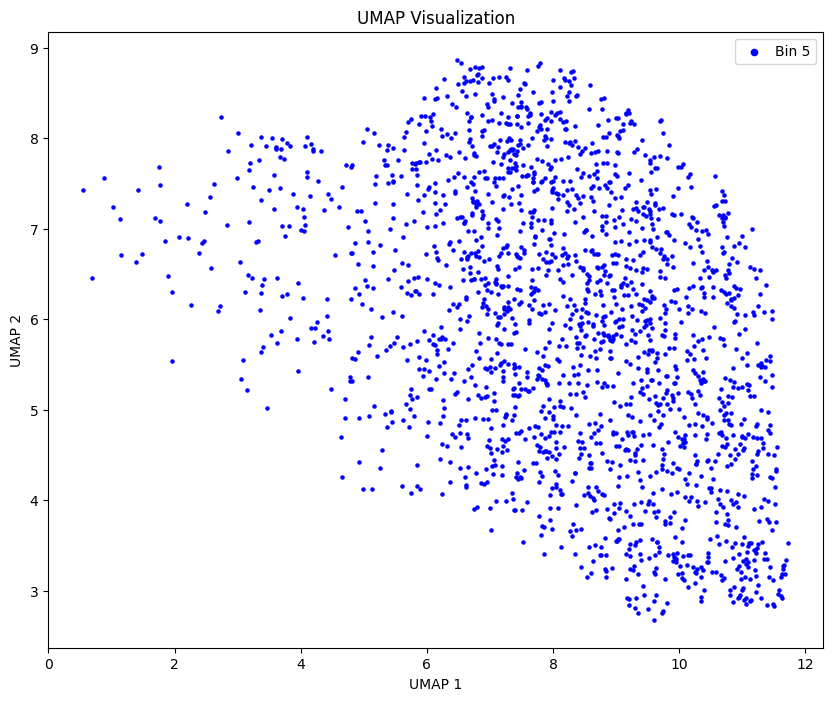

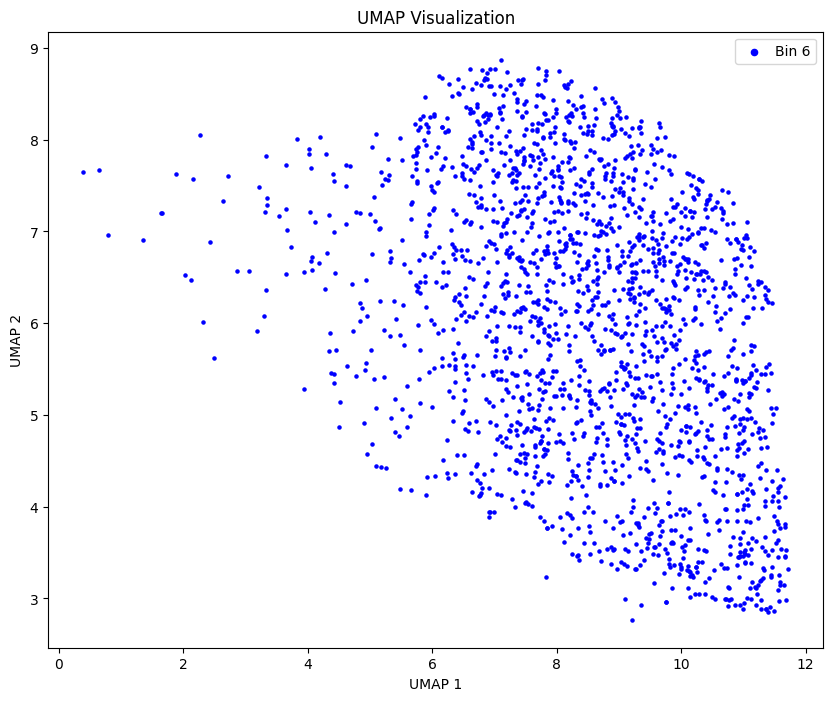

In [29]:
import matplotlib.pyplot as plt
import numpy as np

# Optional: Define label names for nice titles/legends
class_labels = ["Bin 1", "Bin 2", "Bin 3", "Bin 4", "Bin 5", "Bin 6"]

# Loop through each bin label
for bin_label in np.unique(labels):
    mask = labels == bin_label
    label_name = class_labels[bin_label - 1]  # adjust -1 if labels are 1-based

    plt.figure(figsize=(10, 8))
    plt.scatter(umap_result[mask, 0], umap_result[mask, 1], 
                color='blue', label=label_name, s=5)

    plt.legend(markerscale=2, handletextpad=0.5)
    plt.title(f'UMAP Visualization')
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    plt.show()

### Get the autophagy_2_1 scores for this new imbalanced testset for the de novo model

In [5]:
#Load pretrained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [6]:
checkpoint_path = "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


In [7]:
model = autophagy_classifier2_1(device)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
model.to(device)
model.eval()

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.7. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../../workspace/SPARCSpy/src/pretrained_models/autophagy/autophagy2.1/VGG2_autophagy_classifier2.1.cpkt`


MultilabelSupervisedModel(
  (network): _VGG2(
    (norm): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (softmax): LogSoftmax(dim=1)
    (features): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU(inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU(inplace=True)
      (11): Conv2d(256, 256, k

In [13]:
# Define the subset size and batch size
subset_size = 10000
batch_size = 256

# Load the subset indices
subset_indices = torch.load('single_model_seed_1_Case_1_subset_indices_new_big_testset.pth')

# Load the balanced testset
test_data_loader = load_dataset("/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset_big.pt", batch_size)

Loaded dataset from /dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/balanced_testset_all_classes/balanced_testset_big.pt


In [14]:
# Create a SubsetRandomSampler
subset_sampler = SubsetRandomSampler(subset_indices)

original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Get the first batch from the DataLoader
#for data in subset_data_loader:
    #print(type(data))  # Check the type of data
    #print(len(data))  # Check how many elements in the batch
    #print(data)  # Print the batch to inspect what is returned
    #break  # Exit after inspecting the first batch

classification_scores = []
out_labels = []
cell_ids = []

# Calculate Classification Scores
with torch.no_grad():
    for data, labels, ids in tqdm(subset_data_loader, desc="Calculating Scores", leave=False):
        data = data.to(device)
        logits = model(data)
        probabilities = torch.softmax(logits, dim=1)

        # Save classification scores, labels, and cell ids
        classification_scores.append(probabilities.cpu().detach().numpy())
        out_labels.append(labels.cpu().detach())
        cell_ids.append(ids.cpu().detach().numpy())

# Concatenate classification scores, labels, and cell IDs from all batches
classification_scores = np.concatenate(classification_scores, axis=0)
#out_labels = np.concatenate(out_labels, axis=0)
#out_labels = torch.cat(out_labels, dim=0)  # Concatenate the tensor lists into one tensor
cell_ids = np.concatenate(cell_ids, axis=0)

Calculating Scores:   0%|          | 0/47 [00:00<?, ?it/s]

In [15]:
# Save classification scores to a file
#np.save('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_classification_scores_new.npy', classification_scores)

# Save out_labels as torch tensor
#torch.save(out_labels, 'single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new.pth')


# Save the three arrays to a .npy file
np.save('classification_scores_big_testset.npy', classification_scores)

#Save out_labels as a PyTorch tensor
torch.save(out_labels, 'single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new_big_testset.pth')
np.save('cell_ids_big_testset.npy', cell_ids)

In [8]:
import numpy as np
import torch

# Load the classification scores
classification_scores = np.load('classification_scores_big_testset.npy')

# Load the cell IDs
cell_ids = np.load('cell_ids_big_testset.npy')

# Load the output labels as a PyTorch tensor
out_labels = torch.load('single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new_big_testset.pth')

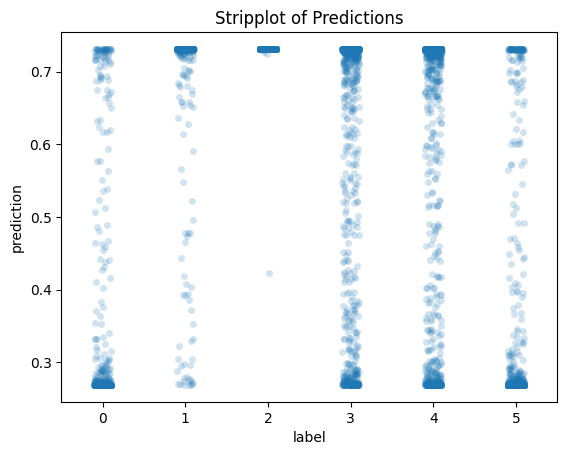

In [9]:
reform_labels = torch.hstack(out_labels)
reform_res = torch.tensor(classification_scores).softmax(dim=1)[:, 1]

#Strip Plot
sns.stripplot(x=reform_labels.numpy(), y=reform_res.numpy(), alpha=0.2)
plt.xlabel('label')
plt.ylabel('prediction')
plt.title('Stripplot of Predictions')
plt.show()

Class 0 (Stim.): Total Cells = 1201, Autophagy On = 1038, Autophagy Off = 37
Class 1 (Unstim.): Total Cells = 1178, Autophagy On = 10, Autophagy Off = 1099
Class 2 (ATG5 K0): Total Cells = 1230, Autophagy On = 0, Autophagy Off = 1229
Class 3 (Stim. timecourse): Total Cells = 1236, Autophagy On = 151, Autophagy Off = 748
Class 4 (EI24 KO timecourse): Total Cells = 1210, Autophagy On = 202, Autophagy Off = 690
Class 5 (Screening): Total Cells = 5945, Autophagy On = 5736, Autophagy Off = 65


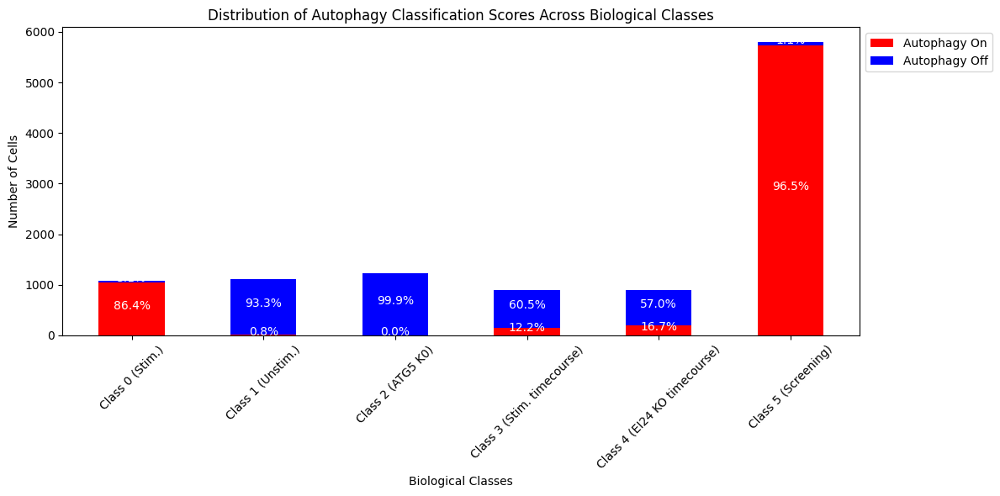

In [12]:
import numpy as np
import torch
import matplotlib.pyplot as plt

# Define class labels for readability
class_labels = ["Class 0 (Stim.)", "Class 1 (Unstim.)", "Class 2 (ATG5 K0)", 
                "Class 3 (Stim. timecourse)", "Class 4 (EI24 KO timecourse)", 
                "Class 5 (Screening)"]

# Verify that the number of samples in classification_scores matches the number in reform_labels
assert classification_scores.shape[0] == reform_labels.shape[0], "Mismatch in number of samples between classification scores and labels"

# Initialize dictionaries to store counts and percentages
counts = {bio_label: [0, 0] for bio_label in class_labels}
percentages = {bio_label: [0.0, 0.0] for bio_label in class_labels}

# Count the number of cells in each biological class with autophagy on or off
for i, bio_label in enumerate(class_labels):
    class_indices = (reform_labels == i).numpy()  # Convert tensor to numpy for indexing
    total_count = np.sum(class_indices)
    autophagy_on_count = np.sum(classification_scores[class_indices, 0] > 0.98)  # Threshold for 'Autophagy on'
    autophagy_off_count = np.sum(classification_scores[class_indices, 1] > 0.98)  # Threshold for 'Autophagy off'
    counts[bio_label] = [autophagy_on_count, autophagy_off_count]
    
    if total_count > 0:
        percentages[bio_label] = [autophagy_on_count / total_count * 100, autophagy_off_count / total_count * 100]
    
    # Print the number of cells per class
    print(f"{bio_label}: Total Cells = {total_count}, Autophagy On = {autophagy_on_count}, Autophagy Off = {autophagy_off_count}")

# Extract counts for plotting
bio_classes = list(counts.keys())
autophagy_on_counts = [counts[bio_label][0] for bio_label in bio_classes]
autophagy_off_counts = [counts[bio_label][1] for bio_label in bio_classes]

# Create the bar plot
plt.figure(figsize=(12, 6))
bar_width = 0.5
indices = np.arange(len(bio_classes))

# Plot the bars
plt.bar(indices, autophagy_on_counts, bar_width, label='Autophagy On', color='red')
plt.bar(indices, autophagy_off_counts, bar_width, bottom=autophagy_on_counts, label='Autophagy Off', color='blue')

# Add percentages to plot
for i, bio_label in enumerate(bio_classes):
    total = autophagy_on_counts[i] + autophagy_off_counts[i]
    if total > 0:
        plt.text(i, autophagy_on_counts[i] / 2, f'{percentages[bio_label][0]:.1f}%', ha='center', color='white')
        plt.text(i, autophagy_on_counts[i] + autophagy_off_counts[i] / 2, f'{percentages[bio_label][1]:.1f}%', ha='center', color='white')

plt.xlabel('Biological Classes')
plt.ylabel('Number of Cells')
plt.title('Distribution of Autophagy Classification Scores Across Biological Classes')
plt.xticks(indices, bio_classes, rotation=45)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

In [18]:
# Extract classification scores for autophagy on and off 
autophagy_on_scores = classification_scores[:, 0]
autophagy_off_scores = classification_scores[:, 1]

# Create a DataFrame with cell ids, autophagy on, and autophagy off scores
df = pd.DataFrame({
    'Cell ID': cell_ids,
    'Autophagy On Score': autophagy_on_scores,
    'Autophagy Off Score': autophagy_off_scores
})

# Save the DataFrame to a .csv file
df.to_csv('autophagy21_classification_scores_big_testset.csv', index=False)

In [19]:
df

,Cell ID,Autophagy On Score,Autophagy Off Score
0,439,6.700127e-02,9.329987e-01
1,293873,5.018042e-07,9.999995e-01
2,1437,7.523392e-01,2.476609e-01
3,437630,1.878466e-06,9.999981e-01
4,80815,9.999956e-01,4.432397e-06
...,...,...,...
11995,469873,9.998048e-01,1.952647e-04
11996,316062,3.255916e-05,9.999675e-01
11997,179090,9.619690e-01,3.803107e-02
11998,247275,2.832826e-06,9.999971e-01


In [20]:
# Define the cell IDs of overlap
target_cell_ids = [445937, 127065, 451082, 496681, 49425]

# Find the indices of these cell IDs in the cell_ids array
target_indices = np.isin(cell_ids, target_cell_ids)

# Extract the corresponding classification scores for autophagy on and off
target_autophagy_on_scores = classification_scores[target_indices, 0]
target_autophagy_off_scores = classification_scores[target_indices, 1]

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'Cell ID': np.array(cell_ids)[target_indices],  # Get the corresponding cell IDs
    'Autophagy On Score': target_autophagy_on_scores,
    'Autophagy Off Score': target_autophagy_off_scores
})

# Display the result
result_df

,Cell ID,Autophagy On Score,Autophagy Off Score
0,451082,3.741750e-05,0.999963
1,445937,5.950180e-05,0.999941
2,496681,5.460521e-04,0.999454
3,127065,6.567348e-07,0.999999
4,49425,6.830680e-03,0.993169


## Get autophagy_2_1 classification scores for big 100k testset for active learning loops

In [4]:
#Load pretrained model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [5]:
checkpoint_path = "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93quv/VGG2_autophagy_classifier2.1.cpkt"
checkpoint = torch.load(checkpoint_path)
print(checkpoint.keys())

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


In [6]:
model = autophagy_classifier2_1(device)
model.load_state_dict(torch.load(checkpoint_path)['state_dict'])
model.to(device)
model.eval()

Lightning automatically upgraded your loaded checkpoint from v1.5.5 to v2.0.7. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint --file ../../../../workspace/SPARCSpy/src/pretrained_models/autophagy/autophagy2.1/VGG2_autophagy_classifier2.1.cpkt`


MultilabelSupervisedModel(
  (network): _VGG2(
    (norm): BatchNorm2d(1, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (softmax): LogSoftmax(dim=1)
    (features): Sequential(
      (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (6): ReLU(inplace=True)
      (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU(inplace=True)
      (11): Conv2d(256, 256, k

In [12]:
import multiprocessing

num_workers = multiprocessing.cpu_count()
print(f"Number of CPU cores available: {num_workers}")

Number of CPU cores available: 256


In [13]:
def load_dataset(save_path, batch_size):
    """
    Load dataset with images, labels, and cell IDs.

    Parameters:
    - save_path: Path where the dataset is stored
    - batch_size: Batch size for DataLoader

    Returns:
    - DataLoader for the dataset
    """
    images_tensor, labels_tensor, cell_ids_tensor = torch.load(save_path)

    # Create a TensorDataset from the loaded tensors
    dataset = torch.utils.data.TensorDataset(images_tensor, labels_tensor, cell_ids_tensor)
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    print(f"Loaded dataset from {save_path}")
    return data_loader

# Load the balanced test dataset
test_data_loader = load_dataset(
    "/dss/dsshome1/0F/di93quv/LRZ_Random_Screening_subset_100k.pt",
    batch_size=64
)

Loaded dataset from /dss/dsshome1/0F/di93quv/LRZ_Random_Screening_subset_100k.pt


In [14]:
#/dss/dsshome1/0F/di93quv/balanced_testset_big_100k.pt

In [15]:
original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

layer_name = 'features.24' # 8th layer activations name from model architecture

# define the return layers for IntermediateLayerGetter
return_layers = {layer_name: layer_name}

# Initialize the model with correct feature output
mid_getter = MidGetter(model, return_layers=return_layers, keep_output=True)

subset_size = 100000 

# Create DataLoader
batch_size = 256

# Randomly sample a subset of the dataset
subset_indices = torch.randperm(len(original_dataset))[:subset_size]
torch.save(subset_indices, 'active_learning_single_model_seed_1_Case_1_subset_indices_new.pth')
subset_indices = torch.load('active_learning_single_model_seed_1_Case_1_subset_indices_new.pth')

In [16]:
# Create a SubsetRandomSampler
subset_sampler = SubsetRandomSampler(subset_indices)

original_dataset = test_data_loader.dataset  # Access the underlying dataset from the DataLoader

# Create a new DataLoader for the subset
subset_data_loader = DataLoader(original_dataset, batch_size=batch_size, sampler=subset_sampler)

# Get the first batch from the DataLoader
#for data in subset_data_loader:
    #print(type(data))  # Check the type of data
    #print(len(data))  # Check how many elements in the batch
    #print(data)  # Print the batch to inspect what is returned
    #break  # Exit after inspecting the first batch

classification_scores = []
out_labels = []
cell_ids = []

# Calculate Classification Scores
with torch.no_grad():
    for data, labels, ids in tqdm(subset_data_loader, desc="Calculating Scores", leave=False):
        data = data.to(device)
        logits = model(data)
        probabilities = torch.softmax(logits, dim=1)

        # Save classification scores, labels, and cell ids
        classification_scores.append(probabilities.cpu().detach().numpy())
        out_labels.append(labels.cpu().detach())
        cell_ids.append(ids.cpu().detach().numpy())

# Concatenate classification scores, labels, and cell IDs from all batches
classification_scores = np.concatenate(classification_scores, axis=0)
#out_labels = np.concatenate(out_labels, axis=0)
#out_labels = torch.cat(out_labels, dim=0)  # Concatenate the tensor lists into one tensor
cell_ids = np.concatenate(cell_ids, axis=0)

Calculating Scores:   0%|          | 0/391 [00:00<?, ?it/s]

In [22]:
# Save the three arrays to a .npy file
np.save('active_learning_classification_scores.npy', classification_scores)

#Save out_labels as a PyTorch tensor
torch.save(out_labels, 'active_learning_single_model_seed_1_Case1_pretrained_original_autophagy_2_1_out_labels_new.pth')
np.save('active_learning_cell_ids.npy', cell_ids)

In [17]:
# Extract classification scores for autophagy on and off 
autophagy_on_scores = classification_scores[:, 0]
autophagy_off_scores = classification_scores[:, 1]

# Create a DataFrame with cell ids, autophagy on, and autophagy off scores
df = pd.DataFrame({
    'Cell ID': cell_ids,
    'Autophagy On Score': autophagy_on_scores,
    'Autophagy Off Score': autophagy_off_scores
})

df

,Cell ID,Autophagy On Score,Autophagy Off Score
0,294674,0.999973,2.701664e-05
1,247918,0.996398,3.602020e-03
2,136301,0.999999,1.488861e-06
3,467709,0.999999,6.879398e-07
4,156705,1.000000,6.414813e-08
...,...,...,...
99995,4066,0.999968,3.199371e-05
99996,49644,0.999999,7.839663e-07
99997,313183,0.994087,5.912762e-03
99998,166426,0.999996,3.755230e-06


In [18]:
# Save the DataFrame to a .csv file
df.to_csv('active_learning_autophagy21_classification_scores_LRZ_random_screening_100k.csv', index=False)